## Attempted solution for the Cold-start competition hosted by DrivenData (top 3%)


### I had used XGBoost to forecast the power usage for variable prediction windows. For problem description see https://www.drivendata.org/competitions/55/schneider-cold-start

In [1]:
%matplotlib inline

# plotting
import matplotlib as mpl
mpl.style.use('ggplot')
import matplotlib.pyplot as plt

# math and data manipulation
import numpy as np
import pandas as pd
import seaborn as sns

# to handle paths
from pathlib import Path

# set random seeds 
from numpy.random import seed
from tensorflow import set_random_seed

RANDOM_SEED = 2018
seed(RANDOM_SEED)
set_random_seed(RANDOM_SEED)

# progress bar
from tqdm import tqdm

/Users/param/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/Users/param/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
consumption_train = pd.read_csv('consumption_train.csv',parse_dates=['timestamp'])
cold_start_test = pd.read_csv('cold_start_test.csv',parse_dates=['timestamp'])
meta = pd.read_csv('meta.csv')
submission_format = pd.read_csv('submission_format.csv',parse_dates=['timestamp'])

In [3]:
#Adding relevant feature columns
import datetime
import calendar

def add_time_features(df):
    df['Year']= (df['timestamp'].dt.year)
    df['Date']= (df['timestamp'].dt.day)
    df['Month']= (df['timestamp'].dt.month)#.apply(lambda x: calendar.month_abbr[x])
    df['Day']= (df['timestamp'].dt.weekday).apply(lambda x: calendar.day_name[x])
    df['Hour']= (df['timestamp'].dt.hour)
    return df

def offdaymask(df):
    day_off_mask = ((df.Day == 'Saturday')|
                    (df.Day == 'Sunday')|                    
                    ((df.Date == 25)&(df.Month == 12))|
                    ((df.Date == 26)&(df.Month == 12))|
                    ((df.Date == 1)&(df.Month == 1))|
                    ((df.Date == 6)&(df.Month == 1))|
                    ((df.Date == 1)&(df.Month == 5))|
                    ((df.Date == 14)&(df.Month == 7))|
                    ((df.Date == 15)&(df.Month == 8))|
                    ((df.Date == 6)&(df.Month == 4)&(df.Year==2012))|
                    ((df.Date == 9)&(df.Month == 4)&(df.Year==2012))|
                    ((df.Date == 17)&(df.Month == 5)&(df.Year==2012))|
                    ((df.Date == 28)&(df.Month == 5)&(df.Year==2012))|
                    ((df.Date == 7)&(df.Month == 6)&(df.Year==2012))|
                    ((df.Date == 29)&(df.Month == 3)&(df.Year==2013))|
                    ((df.Date == 1)&(df.Month == 4)&(df.Year==2013))|
                    ((df.Date == 9)&(df.Month == 5)&(df.Year==2013))|
                    ((df.Date == 20)&(df.Month == 5)&(df.Year==2013))| 
                    ((df.Date == 18)&(df.Month == 4)&(df.Year==2014))|
                    ((df.Date == 21)&(df.Month == 4)&(df.Year==2014))|
                    ((df.Date == 29)&(df.Month == 5)&(df.Year==2014))|
                    ((df.Date == 9)&(df.Month == 6)&(df.Year==2014))|
                    ((df.Date == 3)&(df.Month == 4)&(df.Year==2015))|
                    ((df.Date == 6)&(df.Month == 4)&(df.Year==2015))|
                    ((df.Date == 14)&(df.Month == 5)&(df.Year==2015))|
                    ((df.Date == 25)&(df.Month == 5)&(df.Year==2015))|
                    ((df.Date == 25)&(df.Month == 3)&(df.Year==2016))|
                    ((df.Date == 28)&(df.Month == 3)&(df.Year==2016))|
                    ((df.Date == 5)&(df.Month == 5)&(df.Year==2016))|            
                    ((df.Date == 14)&(df.Month == 4)&(df.Year==2017))|
                    ((df.Date == 17)&(df.Month == 4)&(df.Year==2017))|
                    ((df.Date == 5)&(df.Month == 6)&(df.Year==2017))
                   )
    return day_off_mask

def add_features(df):
    # make a copy so that the original dataframe is not overwritten
    data = df.copy(deep = True) 
    
    #Add Day's name etc. features
    add_time_features(data)
    
    #merge with meta data to get information regarding building size etc.
    data = pd.merge(data, meta, on='series_id')
    
    #to see if the considered day is working or not
    data['Day_off'] = offdaymask(data).astype('int')  
    
    #to get a unique identifier: MAY NOT BE USED IN THE END
    data.index.names=['id']
    
    data = data[['series_id','timestamp','temperature','Hour',
                 'Day','Date','Month','Year','surface','base_temperature',
                 'Day_off','consumption']]
    return data
    

In [4]:
# choose subset of series for training
frac_series_to_use = 0.01

rng = np.random.RandomState(seed=RANDOM_SEED)
series_ids = consumption_train.series_id.unique()
series_mask = rng.binomial(1,
                           frac_series_to_use,
                           size=series_ids.shape).astype(bool)

training_series = series_ids[series_mask]

# reduce training data to series subset
consumption_train = consumption_train[consumption_train.series_id.isin(training_series)]

In [5]:
train = add_features(consumption_train);
#train.consumption = np.log1p(train.consumption)

In [6]:
train.dtypes

series_id                    int64
timestamp           datetime64[ns]
temperature                float64
Hour                         int64
Day                         object
Date                         int64
Month                        int64
Year                         int64
surface                     object
base_temperature            object
Day_off                      int64
consumption                float64
dtype: object

(array([4552.,  748.,  577.,  139.,   75.,  119.,   68.,  183.,  222.,
          37.]),
 array([   958.34670256,  71483.19902813, 142008.05135369, 212532.90367926,
        283057.75600482, 353582.60833038, 424107.46065595, 494632.31298151,
        565157.16530707, 635682.01763264, 706206.8699582 ]),
 <a list of 10 Patch objects>)

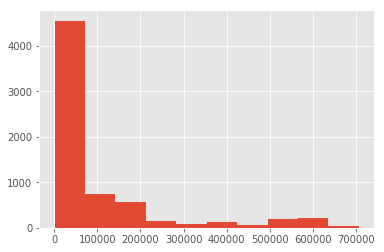

In [7]:
plt.hist(train.consumption)

In [8]:
train.head()

,series_id,timestamp,temperature,Hour,Day,Date,Month,Year,surface,base_temperature,Day_off,consumption
id,,,,,,,,,,,,
0,100283,2017-06-07 00:00:00,NaN,0,Wednesday,7,6,2017,x-small,low,0,527862.165731
1,100283,2017-06-07 01:00:00,NaN,1,Wednesday,7,6,2017,x-small,low,0,561278.342934
2,100283,2017-06-07 02:00:00,NaN,2,Wednesday,7,6,2017,x-small,low,0,570699.933083
3,100283,2017-06-07 03:00:00,NaN,3,Wednesday,7,6,2017,x-small,low,0,562464.244579
4,100283,2017-06-07 04:00:00,NaN,4,Wednesday,7,6,2017,x-small,low,0,565464.153881


In [9]:
test = add_features(cold_start_test);

#test.consumption = np.log1p(test.consumption)

In [10]:
test[test.consumption == 0]

,series_id,timestamp,temperature,Hour,Day,Date,Month,Year,surface,base_temperature,Day_off,consumption
id,,,,,,,,,,,,
4261,101464,2013-11-05 13:00:00,22.15,13,Tuesday,5,11,2013,x-large,low,0,0.0
4262,101464,2013-11-05 14:00:00,23.00,14,Tuesday,5,11,2013,x-large,low,0,0.0
78730,100721,2012-06-05 10:00:00,NaN,10,Tuesday,5,6,2012,xx-large,low,0,0.0
78731,100721,2012-06-05 11:00:00,NaN,11,Tuesday,5,6,2012,xx-large,low,0,0.0


In [11]:
test.consumption[(test.series_id== 101464) & (test.Hour == 13) & (test.Date ==5)] =12.087794735850453
# test.consumption[(test.series_id== 101464) & (test.Hour == 12) & (test.Date ==5)]

test.consumption[(test.series_id== 101464) & (test.Hour == 14) & (test.Date ==5)] = 12.039802363333814
#test.consumption[(test.series_id== 101464) & (test.Hour == 15) & (test.Date ==5)]

test.consumption[(test.series_id== 100721) & (test.Hour == 10) & (test.Date ==5) & (test.Month ==6)] = 11.61617550412255
#test.consumption[(test.series_id== 100721) & (test.Hour == 9) & (test.Date ==5)& (test.Month ==6)]

test.consumption[(test.series_id== 100721) & (test.Hour == 11) & (test.Date ==5) & (test.Month ==6)] = 11.951765968652262
#test.consumption[(test.series_id== 100721) & (test.Hour == 12) & (test.Date ==5)& (test.Month ==6)]

test[test.consumption == 0]

/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


,series_id,timestamp,temperature,Hour,Day,Date,Month,Year,surface,base_temperature,Day_off,consumption
id,,,,,,,,,,,,


In [12]:
test.Day_off[((test.Date==31)|(test.Date<5)) & (test.series_id == 102718)]=1;
test.Day_off[(test.Date<6) & (test.series_id == 103578)]=1;
test.Day_off[(test.Date<7) & (test.series_id == 102354)]=1;
test.Day_off[((test.Date>24)&(test.Date<29)|(test.Date==1)|(test.Day=='Saturday')|(test.Day=='Sunday')) & (test.series_id == 101441)]=1;

test.Day_off[((test.Date>25)|(test.Date<3)) & (test.series_id == 102618)]=1;
test.Day_off[(test.Date!=1) & (test.series_id == 103315)]=0;
test.Day_off[(test.Day == 'Monday') & (test.series_id == 101169)]=1;

test.consumption[(test.series_id == 101667) & (test.consumption <10)] = test.consumption[(test.series_id == 101667) & (test.consumption >10)].mean()

test.consumption[(test.series_id == 100775) & (test.consumption <10)] = test.consumption[(test.series_id == 100775) & (test.consumption >10)].mean()

test.consumption[(test.series_id == 102560) & (test.consumption <10.5)] = test.consumption[(test.series_id == 102560) & (test.consumption >10.5)].mean()

#102618



/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/param/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/User

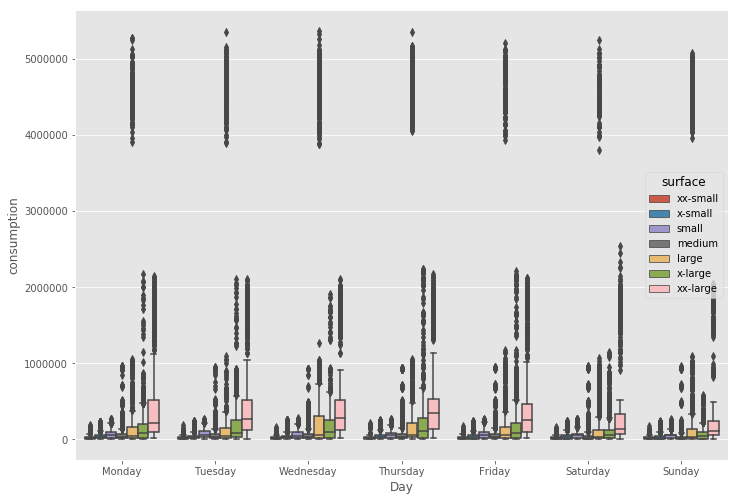

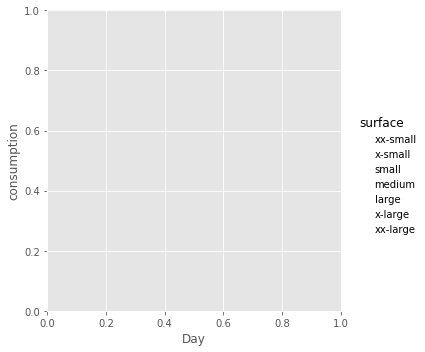

In [13]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.catplot(x='Day',y='consumption',data=test,hue='surface',kind='box',ax=ax,
            order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],
           hue_order=['xx-small','x-small','small','medium','large','x-large','xx-large']);

In [14]:
#test.groupby(['series_id','Day'])['consumption'].std()

In [15]:
sub = add_features(submission_format);
sub['prediction_window'] = submission_format['prediction_window']

## Adding categorical encodings and lagged features

In [16]:
def create_lagged_features(df, lag=1):
    #df = data.copy(deep=True)
    if not type(df) == pd.DataFrame:
        df = pd.DataFrame(df, columns=['consumption'])
    
    def _rename_lag(ser, j):
        ser.name = ser.name + f'_{j}'
        return ser
    
    if df.shape[0]>24:
        # add a column lagged by `i` steps
        for i in range(1, lag + 1):
            df = df.join(df.consumption.shift(i).pipe(_rename_lag, i))
    else:
        for i in range(1, lag):
            df = df.join(df.consumption.shift(i).pipe(_rename_lag, i))
    
    df.dropna(inplace=True)
    return df

In [17]:
hoursconsidered =True
daysconsidered = False

In [18]:
cols = ['Hour_0','Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6', 'Hour_7',
        'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12', 'Hour_13',
        'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18', 'Hour_19',
        'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',  
        'Day_Monday','Day_Tuesday','Day_Wednesday','Day_Thursday',
        'Day_Friday','Day_Saturday', 'Day_Sunday', 
        'surface_xx-small','surface_x-small','surface_small','surface_medium', 
        'surface_large', 'surface_x-large','surface_xx-large', 
        'Day_off_0','Day_off_1','base_temperature_low','base_temperature_high','consumption']

if hoursconsidered & daysconsidered:
    dropcols = ['Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6', 'Hour_7',
                'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12', 'Hour_13',
                'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18', 'Hour_19',
                'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',  
                'Day_Tuesday','Day_Wednesday','Day_Thursday',
                'Day_Friday','Day_Saturday', 'Day_Sunday', 
                'surface_x-small','surface_small','surface_medium', 'surface_large', 'surface_x-large','surface_xx-large', 
                'Day_off_1','base_temperature_high','consumption']
elif daysconsidered:
    dropcols = ['Day_Tuesday','Day_Wednesday','Day_Thursday',
                'Day_Friday','Day_Saturday', 'Day_Sunday', 
                'surface_x-small','surface_small','surface_medium', 'surface_large', 
                'surface_x-large','surface_xx-large',
                'Day_off_1','base_temperature_high','consumption']
elif hoursconsidered:
    dropcols = ['Hour_1', 'Hour_2', 'Hour_3', 'Hour_4', 'Hour_5', 'Hour_6', 'Hour_7',
                'Hour_8', 'Hour_9', 'Hour_10', 'Hour_11', 'Hour_12', 'Hour_13',
                'Hour_14', 'Hour_15', 'Hour_16', 'Hour_17', 'Hour_18', 'Hour_19',
                'Hour_20', 'Hour_21', 'Hour_22', 'Hour_23',   
                'surface_x-small','surface_small','surface_medium', 'surface_large', 'surface_x-large','surface_xx-large', 
                'Day_off_1','base_temperature_high','consumption']
else:
    dropcols = ['surface_x-small','surface_small','surface_medium', 'surface_large', 'surface_x-large','surface_xx-large', 
                'Day_off_1','base_temperature_high','consumption']

In [19]:
dropcols

['Hour_1',
 'Hour_2',
 'Hour_3',
 'Hour_4',
 'Hour_5',
 'Hour_6',
 'Hour_7',
 'Hour_8',
 'Hour_9',
 'Hour_10',
 'Hour_11',
 'Hour_12',
 'Hour_13',
 'Hour_14',
 'Hour_15',
 'Hour_16',
 'Hour_17',
 'Hour_18',
 'Hour_19',
 'Hour_20',
 'Hour_21',
 'Hour_22',
 'Hour_23',
 'surface_x-small',
 'surface_small',
 'surface_medium',
 'surface_large',
 'surface_x-large',
 'surface_xx-large',
 'Day_off_1',
 'base_temperature_high',
 'consumption']

In [20]:
def encoding_categorical(df):
    #the categorical features considered
    cat_features = ['Hour','surface','base_temperature','Day_off','Day']

    X_cat = (pd.get_dummies(df[cat_features],columns = cat_features,
                               drop_first=False,dtype=np.int64,prefix_sep='_'))

    #add the unfound booleans manually
    if (set(cols)- set(X_cat.columns)):
        for x in list((set(cols)- set(X_cat.columns))):
            X_cat[x] = 0
                    
    if ((df.Day_off).min() == 1) | ((df.Day_off).max() ==0):
        X_cat['Day_off_1'] = df.Day_off
    
    X_cat['consumption'] = df.consumption
    
    #fixing the order and dropping first categorical
    X_cat = X_cat[dropcols]
    return X_cat

In [21]:
cat_number = encoding_categorical(train).shape[1]-1
print('Number of categorical columns considered =',cat_number)

Number of categorical columns considered = 31


In [22]:
from sklearn.preprocessing import MinMaxScaler
def scaling(df):
    df2 = df.copy(deep=True)
    scaler = MinMaxScaler(feature_range=(0, 1))
    df2[['consumption']] = scaler.fit_transform(df2[['consumption']])
    return df2,scaler

In [23]:
# create a differenced series
def difference(dataset, interval=1):
    diff = []
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
        #diff.insert(0,np.nan)
    return diff

In [24]:
do_diff =False

In [25]:

def prepare_training_data(df, lag):
    """ Converts a series of consumption data into a
        lagged, scaled sample.
    """
    df = encoding_categorical(df)
    # scale training data
    vals, scaler = scaling(df)
    
    
    #differencing
    if do_diff:
        vals.consumption = difference(vals.consumption.values,interval=1)
        difflist = vals.consumption.values[1:]
    # convert consumption series to lagged features
    consumption_lagged = create_lagged_features(vals, lag=lag)
    
    if df.shape[0]>24:
        # X, y format taking the first column (original time series) to be the y
        X = consumption_lagged.drop('consumption', axis=1).values
    else:
        X = consumption_lagged.values
        
    y = consumption_lagged.consumption.values
    
    # keras expects 3 dimensional X
    if xgbnotused:
        X = X.reshape(X.shape[0], 1, X.shape[1])  
        
    return X, y, scaler,consumption_lagged

In [26]:
#%%time
from xgboost import XGBRegressor
lag=0
reg = XGBRegressor(max_depth=10,n_estimators=1000)
xgbnotused =False


num_training_series = train.series_id.nunique()
num_passes_through_data = 3

for i in tqdm(range(num_passes_through_data), 
              total=num_passes_through_data, 
              desc='Learning Consumption Trends - Epoch'):
    
    for ser_id, ser_data in train.groupby('series_id'):

        # prepare the data
        X, y, scaler,temp = prepare_training_data(ser_data, lag)
        reg.fit(X, y)

Learning Consumption Trends - Epoch: 100%|██████████| 3/3 [01:07<00:00, 22.41s/it]


<Figure size 1008x504 with 0 Axes>

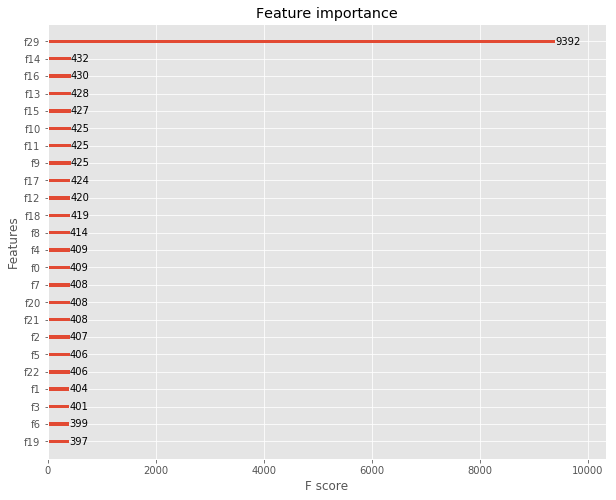

In [27]:
from xgboost import plot_importance
plt.figure(figsize=(14,7))
ax = plot_importance(reg)
fig = ax.figure
fig.set_size_inches(10, 8)

In [28]:
dropcols;

In [29]:
import scipy#.ndimage.interpolation import shift

def xgb_generate_hourly_forecast(data,num_pred_hours, consumption,
                                 model, scaler, lag,lastconsump,dayofflist,processed):
    """ Uses last hour's prediction to generate next for num_pred_hours, 
        initialized by most recent cold start prediction. Inverts scale of 
        predictions before return.
    """
    preds_scaled = np.zeros(num_pred_hours)
    lastpointscaled = scaler.transform(lastconsump)
    daytemp = ((data.timestamp.dt.weekday).values)[-1]

    X = (consumption[-1][-lag-cat_number:]).reshape(-1,lag+cat_number)

    
    # forecast
    for i in range(num_pred_hours):
        # predict scaled value for next time step

        yhat = reg.predict(X)
        preds_scaled[i] = yhat
        
        # update X to be latest data plus prediction
        X[0,-lag:] =scipy.ndimage.interpolation.shift(X[0,-lag:],1,cval=yhat)

        if "Day_off_1" in dropcols:
            dayoffindex =processed.columns.get_loc("Day_off_1")
        if "Day_Tuesday" in dropcols:
            day_tue =processed.columns.get_loc("Day_Tuesday")
        if "Day_Sunday" in dropcols:
            day_sun =processed.columns.get_loc("Day_Sunday")
        #print(dayoffindex,day_tue,day_sun)
        #Updating hour and day categorical variables
        hour = i%24   
        if (hoursconsidered):
            (X[0,:23].fill(0)) #Fill the hour columns with 0
            if ((hour>=1) & (hoursconsidered)):
                X[0,hour-1] =1 #subtracted one due to categorical encoding starting from 1 a.m.

        ##daytemp 0 = Monday, 6=Sunday
        if  i%24 ==0:
            daytemp =  (daytemp+1)%7
        #print(i,daytemp,(1 + i//24)%7)
        if (daysconsidered):
            (X[0,day_tue:day_sun+1].fill(0)) #Fill the hour columns with 0
            if (daytemp>0) :
                X[0,day_tue+daytemp-1] = 1
                
        if dayofflist[daytemp]:
            X[0,dayoffindex] =1
        else:
            X[0,dayoffindex] =0
        
        #check
        #print(daytemp,X[0,dayoffindex])
        #print(i,daytemp,X[0,23:29])
        if do_diff:
            preds_scaled[i] = preds_scaled[i]+lastpointscaled
            #print(lastpointscaled,preds_scaled[i])
            lastpointscaled = preds_scaled[i]
        
    # revert scale back to original range
    hourly_preds = scaler.inverse_transform(preds_scaled.reshape(-1, 1)).ravel()#[:,0]
    
    return hourly_preds

In [30]:
# copy submission format and fill in values
my_submission = submission_format.copy()

In [31]:
def inverse_difference(last_ob, value):
    return value + last_ob

In [32]:
lessdata=[]
for x in my_submission.series_id.unique():
    if test[test.series_id == x].shape[0] <=24:
        lessdata.append(x)

In [33]:
sublist = list(sub.series_id.unique())

temp1 = sublist.index(100582)
temp2 =sublist.index(103505)
temp3 = sublist.index(102796)
sublist[temp1] = 103505
sublist[temp2] = 102796
sublist[temp3] = 100582

temp1 = sublist.index(103556)
temp2 = sublist.index(102647)
sublist[temp1] = 102647
sublist[temp2] = 103556

temp1 = sublist.index(101354)
temp2 = sublist.index(103362)
sublist[temp1] = 103362
sublist[temp2] = 101354

In [34]:
tempworkday = pd.DataFrame(test[test.Day_off==0].groupby('series_id')['consumption'].mean())
tempworkday.columns =['workdayavg']
tempoffday = pd.DataFrame(test[test.Day_off==1].groupby('series_id')['consumption'].mean())
tempoffday.columns =['offdayavg']
temp = test.join(tempworkday,on = 'series_id')
temp = temp.join(tempoffday,on = 'series_id')

In [35]:
notnandata =[]
uniquelist = test.series_id.unique()
import math
for s_id in uniquelist:
    if (math.isnan(temp.workdayavg[test.series_id == s_id].head(1).values[0]) | 
         (math.isnan(temp.offdayavg[test.series_id == s_id].head(1).values[0]))):
        pass
    else:    
        notnandata.append(s_id)
len(notnandata)

522

In [36]:
pred_window_to_num_preds = {'hourly': 24, 'daily': 7, 'weekly': 2}
pred_window_to_num_pred_hours = {'hourly': 1, 'daily':  24, 'weekly':  7 * 24}
num_test_series = my_submission.series_id.nunique()
import random

def xgb_make_pred_plots(ser_id):
    
    prednumber = sub.series_id[sub.series_id==ser_id].count()
    predtype = sub.prediction_window[sub.series_id==ser_id].unique()[0]
    print(prednumber,predtype)
    pred_window_to_hours = {'hourly': 1, 'daily':  24, 'weekly':  7 * 24}
    num_pred_hours = prednumber*pred_window_to_hours[predtype]
    print(ser_id,num_pred_hours)
    #num_pred_hours = number*pred_window_to_num_pred_hours[pred_window]    
    series_data = test[test.series_id == ser_id]#.consumption
    lastconsump = series_data.consumption.values[0]#[-1]

    dayofflist=meta[['monday_is_day_off','tuesday_is_day_off',
                     'wednesday_is_day_off','thursday_is_day_off',
                     'friday_is_day_off','saturday_is_day_off',
                     'sunday_is_day_off']][meta.series_id == ser_id].values.reshape(7,1)



    cold_X, cold_y, scaler, processed = prepare_training_data(series_data, lag)
    scaler0 =scaler
    if (test[test.series_id == ser_id].shape[0]>24) & (ser_id!=102364) &(ser_id in notnandata):
        reg.fit(cold_X, cold_y)
    # make hourly forecasts for duration of pred window
    preds = xgb_generate_hourly_forecast(series_data,num_pred_hours, 
                                         cold_X, reg, scaler, lag,
                                         lastconsump,dayofflist,processed) 
    
    
    lessdatalist =[103268,100735,101428,101226,101482,101284,
                   101518,101924,
                  ]
    if (ser_id in lessdatalist):
        preds = series_data.consumption.values

    if (ser_id in [100777,101136,101278,100974,102607]):
        preds[-24:] =[series_data.consumption.values[-1]]*24
    if (ser_id in [103208,102287,102111,103343]):
        preds[-24:] =series_data.consumption.values[-24:]
        
    if (ser_id in [100150,102161]):
        x = list(series_data.consumption.values)
        for j in range(6):
            x =x + list(series_data.consumption.values)
        preds = np.array(x)
    if (ser_id in [100111]):
        x = list(series_data.consumption.values[-24:])
        for j in range(6):
            x =x + list(series_data.consumption.values[-24:])
        preds = np.array(x)
    
    if ser_id == 100721:
        preds = preds+0.5
        
    if np.abs(series_data.consumption.values.std()) <= 0.01 :
        preds = num_pred_hours*[series_data.consumption.values[-1]]
        
        
    #inv_preds = [inverse_difference(data[i], diff[i]) for i in range(len(diff))]
    l = test.consumption[test.series_id ==ser_id].shape[0]
    xl =list(range(l))
    plt.figure(figsize=(5,3))
    plt.plot(xl,(test.consumption[test.series_id ==ser_id]),'-r',label='Test data')
    xt = list(range(len(preds)))
    xt = [x+xl[-1] for x in xt]
    plt.plot(xt,preds,'-b',label='Forecast')
    plt.title('XGBOOST: '+str(ser_id))
    plt.legend(loc='upper left')
    plt.show()

In [ ]:
subtemp = sub.drop(['surface','base_temperature','temperature'],axis=1)#.head()

In [ ]:
subtemp.columns

In [ ]:
subtemp = subtemp[['series_id', 'timestamp', 'Hour', 'Day', 'Date', 'Month', 'Year',
       'Day_off', 'prediction_window','consumption']]

In [ ]:
subtemp.head()


Forecasting from Cold Start Data:   0%|          | 0/625 [00:00<?, ?it/s]

102781 <class 'numpy.ndarray'>
Last day observed: Saturday 	 2 / 3 / 2013
work day avg= 58032.05282696925 	 off day avg= 15729.577247038242
[102781 'large' 'low' False False False False False True True]


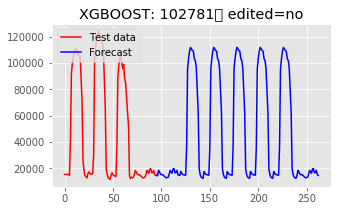


Forecasting from Cold Start Data:   0%|          | 1/625 [00:00<06:12,  1.68it/s]

103342 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 19 / 6 / 2013
work day avg= 67333.46130064932 	 off day avg= nan
[103342 'large' 'low' False False False False False True True]


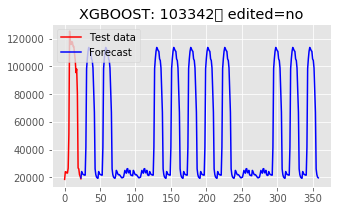


Forecasting from Cold Start Data:   0%|          | 2/625 [00:00<05:09,  2.01it/s]

102969 <class 'numpy.ndarray'>
Last day observed: Saturday 	 14 / 12 / 2013
work day avg= 59936.75981331591 	 off day avg= 16366.330020938496
[102969 'large' 'low' False False False False False True True]


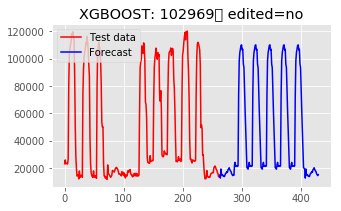


Forecasting from Cold Start Data:   0%|          | 3/625 [00:01<07:04,  1.46it/s]

102718 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 1 / 2015
work day avg= 37480.62951763292 	 off day avg= 16646.730891432944
[102718 'large' 'low' False False False False False True True]


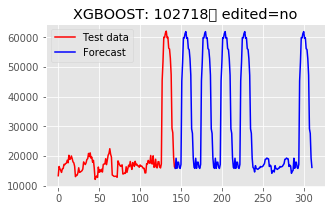


Forecasting from Cold Start Data:   1%|          | 4/625 [00:02<07:06,  1.46it/s]

102493 <class 'numpy.ndarray'>
Last day observed: Saturday 	 10 / 10 / 2015
work day avg= 30311.415909602358 	 off day avg= 17477.984925610526
[102493 'large' 'low' False False False False False True True]


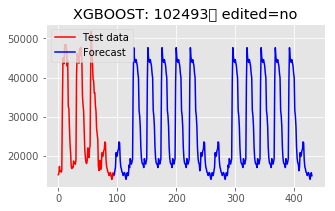


Forecasting from Cold Start Data:   1%|          | 5/625 [00:03<06:52,  1.50it/s]

102374 <class 'numpy.ndarray'>
Last day observed: Saturday 	 10 / 9 / 2016
work day avg= 31620.157828124582 	 off day avg= 17936.013918661087
[102374 'large' 'low' False False False False False True True]


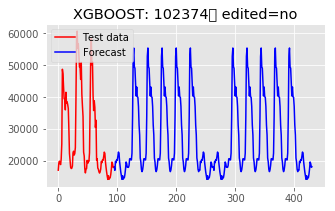


Forecasting from Cold Start Data:   1%|          | 6/625 [00:03<06:45,  1.53it/s]

102714 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 27 / 8 / 2013
work day avg= 292189.8577762746 	 off day avg= 207293.53215044443
[102714 'x-large' 'low' False False False False False True True]


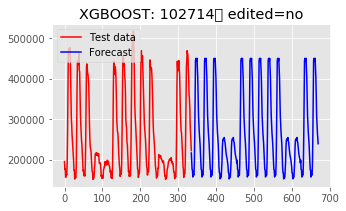


Forecasting from Cold Start Data:   1%|          | 7/625 [00:05<09:00,  1.14it/s]

100712 <class 'numpy.ndarray'>
Last day observed: Thursday 	 10 / 10 / 2013
work day avg= 229518.86718794898 	 off day avg= nan
[100712 'x-large' 'low' False False False False False True True]


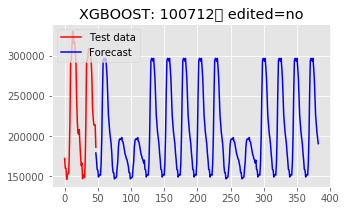


Forecasting from Cold Start Data:   1%|▏         | 8/625 [00:05<07:23,  1.39it/s]

101878 <class 'numpy.ndarray'>
Last day observed: Monday 	 7 / 4 / 2014
work day avg= 275027.13031659805 	 off day avg= 173304.69582816053
[101878 'x-large' 'low' False False False False False True True]


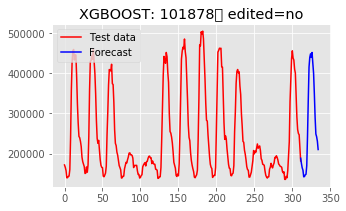


Forecasting from Cold Start Data:   1%|▏         | 9/625 [00:06<09:02,  1.14it/s]

103268 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 4 / 2015
work day avg= 231611.74439634974 	 off day avg= nan
[103268 'x-large' 'low' False False False False False True True]


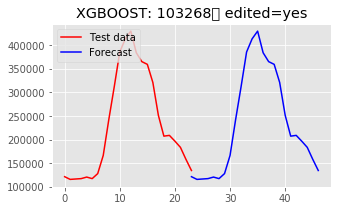


Forecasting from Cold Start Data:   2%|▏         | 10/625 [00:07<06:52,  1.49it/s]

103578 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 8 / 1 / 2013
work day avg= 289268.18327344273 	 off day avg= 225032.41191615968
[103578 'x-large' 'low' False False False False False True True]


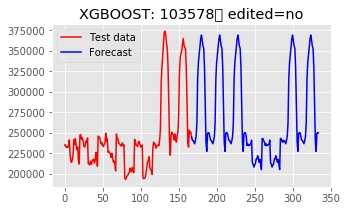


Forecasting from Cold Start Data:   2%|▏         | 11/625 [00:07<07:12,  1.42it/s]

100735 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 24 / 4 / 2013
work day avg= 333809.7896676093 	 off day avg= nan
[100735 'x-large' 'low' False False False False False True True]


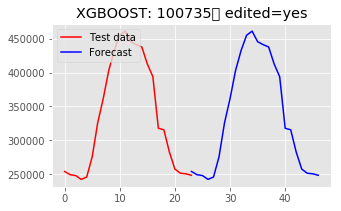


Forecasting from Cold Start Data:   2%|▏         | 12/625 [00:08<05:37,  1.82it/s]

101027 <class 'numpy.ndarray'>
Last day observed: Saturday 	 1 / 2 / 2014
work day avg= 286373.21910381113 	 off day avg= 192797.40631779228
[101027 'x-large' 'low' False False False False False True True]


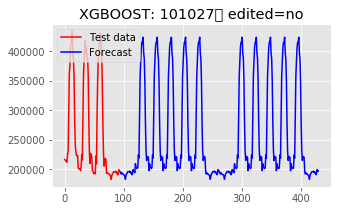


Forecasting from Cold Start Data:   2%|▏         | 13/625 [00:08<05:52,  1.73it/s]

103626 <class 'numpy.ndarray'>
Last day observed: Saturday 	 24 / 5 / 2014
work day avg= 316572.13994386914 	 off day avg= 199752.52770458368
[103626 'x-large' 'low' False False False False False True True]


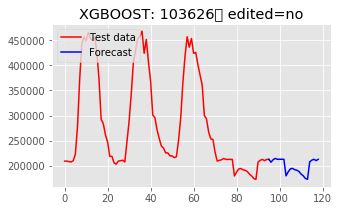


Forecasting from Cold Start Data:   2%|▏         | 14/625 [00:09<06:05,  1.67it/s]

100649 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 22 / 7 / 2014
work day avg= 332368.31373252335 	 off day avg= 217500.70015533364
[100649 'x-large' 'low' False False False False False True True]


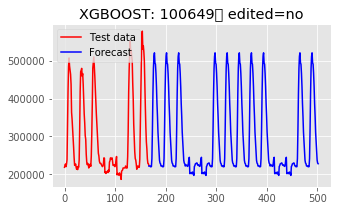


Forecasting from Cold Start Data:   2%|▏         | 15/625 [00:10<06:51,  1.48it/s]

100257 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 17 / 9 / 2014
work day avg= 318175.78192165284 	 off day avg= 204527.41673955714
[100257 'x-large' 'low' False False False False False True True]


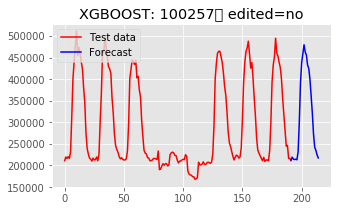


Forecasting from Cold Start Data:   3%|▎         | 16/625 [00:11<07:27,  1.36it/s]

101234 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 12 / 11 / 2014
work day avg= 285880.7148259899 	 off day avg= 181121.45124359324
[101234 'x-large' 'low' False False False False False True True]


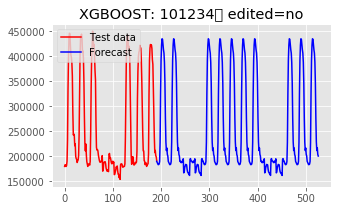


Forecasting from Cold Start Data:   3%|▎         | 17/625 [00:12<08:20,  1.21it/s]

103058 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 3 / 3 / 2015
work day avg= 296554.84412530396 	 off day avg= 199356.12182243494
[103058 'x-large' 'low' False False False False False True True]


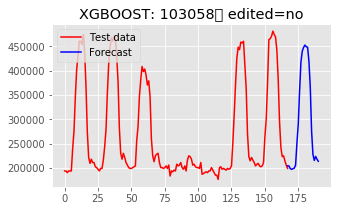


Forecasting from Cold Start Data:   3%|▎         | 18/625 [00:12<08:15,  1.22it/s]

101428 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 17 / 6 / 2015
work day avg= 321881.57630477025 	 off day avg= nan
[101428 'x-large' 'low' False False False False False True True]


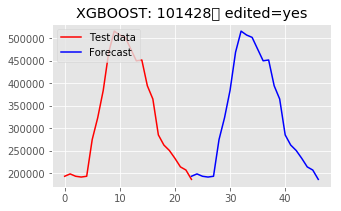


Forecasting from Cold Start Data:   3%|▎         | 19/625 [00:13<06:22,  1.59it/s]

101275 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 18 / 8 / 2015
work day avg= 315740.88882130256 	 off day avg= 178743.01595070088
[101275 'x-large' 'low' False False False False False True True]


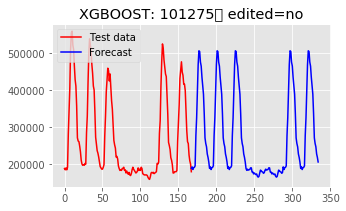


Forecasting from Cold Start Data:   3%|▎         | 20/625 [00:14<07:08,  1.41it/s]

100698 <class 'numpy.ndarray'>
Last day observed: Monday 	 30 / 11 / 2015
work day avg= 277695.318934311 	 off day avg= nan
[100698 'x-large' 'low' False False False False False True True]


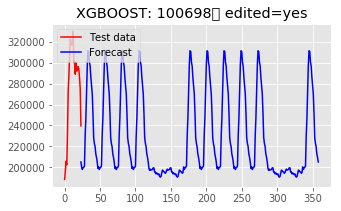


Forecasting from Cold Start Data:   3%|▎         | 21/625 [00:14<05:50,  1.73it/s]

100990 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 5 / 2016
work day avg= 261929.97226883573 	 off day avg= nan
[100990 'x-large' 'low' False False False False False True True]


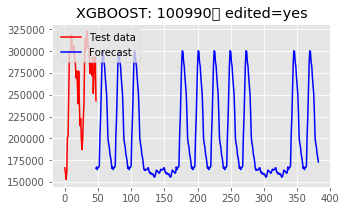


Forecasting from Cold Start Data:   4%|▎         | 22/625 [00:14<04:56,  2.03it/s]

100148 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 7 / 2016
work day avg= 395188.7724552337 	 off day avg= 324267.1434680271
[100148 'x-large' 'low' False False False False False True True]


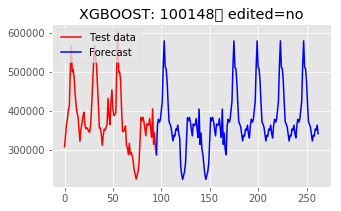


Forecasting from Cold Start Data:   4%|▎         | 23/625 [00:15<05:01,  2.00it/s]

103328 <class 'numpy.ndarray'>
Last day observed: Thursday 	 3 / 11 / 2016
work day avg= 310880.75315144524 	 off day avg= nan
[103328 'x-large' 'low' False False False False False True True]


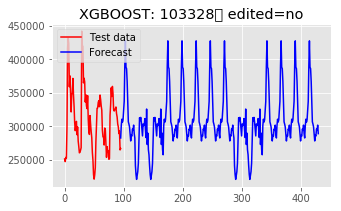


Forecasting from Cold Start Data:   4%|▍         | 24/625 [00:15<04:14,  2.36it/s]

101661 <class 'numpy.ndarray'>
Last day observed: Monday 	 2 / 1 / 2017
work day avg= 194766.19631838886 	 off day avg= 174918.16495795155
[101661 'x-large' 'low' False False False False False True True]


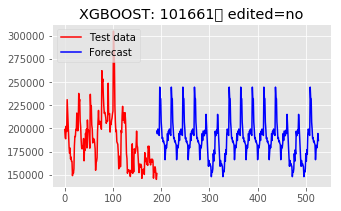


Forecasting from Cold Start Data:   4%|▍         | 25/625 [00:16<05:54,  1.69it/s]

101577 <class 'numpy.ndarray'>
Last day observed: Saturday 	 25 / 2 / 2017
work day avg= 292504.60073027515 	 off day avg= 244665.43737448868
[101577 'x-large' 'low' False False False False False True True]


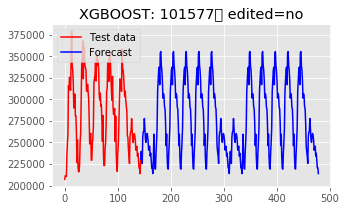


Forecasting from Cold Start Data:   4%|▍         | 26/625 [00:17<07:02,  1.42it/s]

102176 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 18 / 4 / 2017
work day avg= 305037.13947022345 	 off day avg= 225251.6361277787
[102176 'x-large' 'low' False False False False False True True]


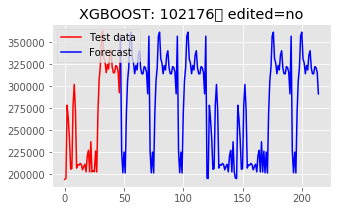


Forecasting from Cold Start Data:   4%|▍         | 27/625 [00:17<06:18,  1.58it/s]

101018 <class 'numpy.ndarray'>
Last day observed: Thursday 	 22 / 6 / 2017
work day avg= 334646.8905149362 	 off day avg= 239744.16610422314
[101018 'x-large' 'low' False False False False False True True]


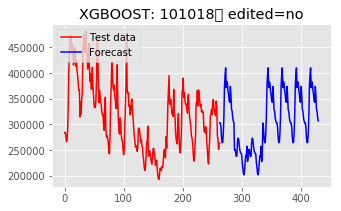


Forecasting from Cold Start Data:   4%|▍         | 28/625 [00:18<07:49,  1.27it/s]

101424 <class 'numpy.ndarray'>
Last day observed: Thursday 	 10 / 8 / 2017
work day avg= 330600.267220659 	 off day avg= nan
[101424 'x-large' 'low' False False False False False True True]


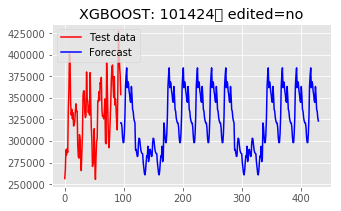


Forecasting from Cold Start Data:   5%|▍         | 29/625 [00:19<06:15,  1.59it/s]

102868 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 11 / 10 / 2017
work day avg= 328867.6557314815 	 off day avg= 243307.208135443
[102868 'x-large' 'low' False False False False False True True]


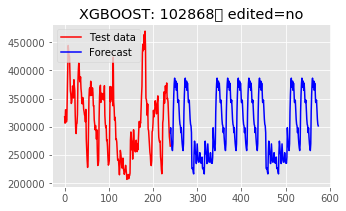


Forecasting from Cold Start Data:   5%|▍         | 30/625 [00:20<07:43,  1.28it/s]

102549 <class 'numpy.ndarray'>
Last day observed: Saturday 	 23 / 3 / 2013
work day avg= 105460.80101439799 	 off day avg= 78400.30822739303
[102549 'x-large' 'low' False False False False False True True]


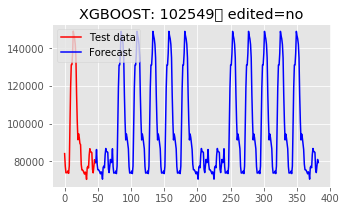


Forecasting from Cold Start Data:   5%|▍         | 31/625 [00:20<06:56,  1.43it/s]

103167 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 16 / 7 / 2013
work day avg= 99892.12640150395 	 off day avg= 57204.606698399584
[103167 'x-large' 'low' False False False False False True True]


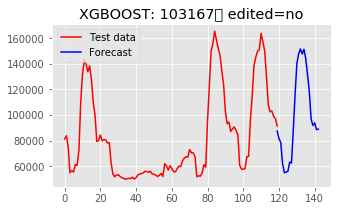


Forecasting from Cold Start Data:   5%|▌         | 32/625 [00:21<06:44,  1.46it/s]

101464 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 13 / 11 / 2013
work day avg= 115320.80754111441 	 off day avg= 83510.44348258508
[101464 'x-large' 'low' False False False False False True True]


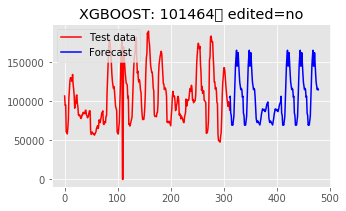


Forecasting from Cold Start Data:   5%|▌         | 33/625 [00:22<07:34,  1.30it/s]

102618 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 1 / 2014
work day avg= 36019.41569869331 	 off day avg= 33638.66670082933
[102618 'x-large' 'low' False False False False False True True]


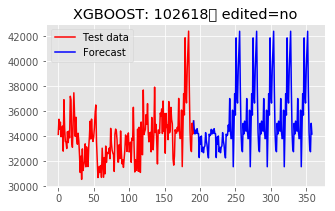


Forecasting from Cold Start Data:   5%|▌         | 34/625 [00:23<07:42,  1.28it/s]

102898 <class 'numpy.ndarray'>
Last day observed: Sunday 	 23 / 2 / 2014
work day avg= 64513.208343532264 	 off day avg= 42887.16370340456
[102898 'x-large' 'low' False False False False False True True]


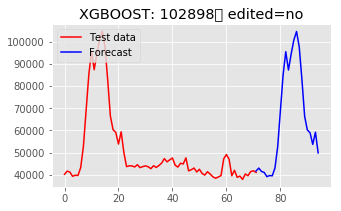


Forecasting from Cold Start Data:   6%|▌         | 35/625 [00:23<06:43,  1.46it/s]

102448 <class 'numpy.ndarray'>
Last day observed: Sunday 	 20 / 4 / 2014
work day avg= nan 	 off day avg= 51827.027521985496
[102448 'x-large' 'low' False False False False False True True]


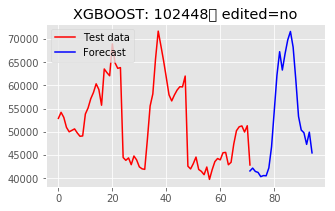


Forecasting from Cold Start Data:   6%|▌         | 36/625 [00:23<05:14,  1.87it/s]

103098 <class 'numpy.ndarray'>
Last day observed: Monday 	 18 / 8 / 2014
work day avg= 111292.72935083829 	 off day avg= 65747.09403130648
[103098 'x-large' 'low' False False False False False True True]


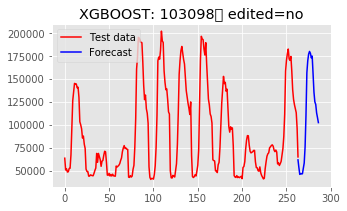


Forecasting from Cold Start Data:   6%|▌         | 37/625 [00:25<07:07,  1.37it/s]

102722 <class 'numpy.ndarray'>
Last day observed: Thursday 	 9 / 10 / 2014
work day avg= 118431.98815090378 	 off day avg= 81259.80282526292
[102722 'x-large' 'low' False False False False False True True]


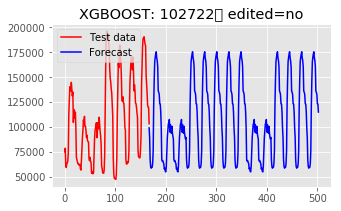


Forecasting from Cold Start Data:   6%|▌         | 38/625 [00:25<07:40,  1.27it/s]

101169 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 27 / 1 / 2015
work day avg= 58591.78635372145 	 off day avg= 35617.380946439196
[101169 'x-large' 'low' False False False False False True True]


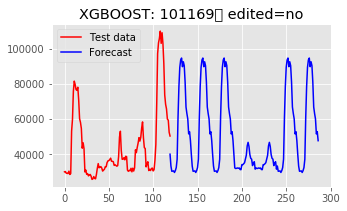


Forecasting from Cold Start Data:   6%|▌         | 39/625 [00:26<07:22,  1.32it/s]

102196 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 15 / 7 / 2015
work day avg= 94675.20416875412 	 off day avg= 73634.49791164896
[102196 'x-large' 'low' False False False False False True True]


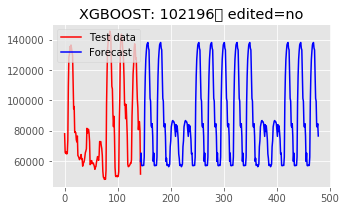


Forecasting from Cold Start Data:   6%|▋         | 40/625 [00:27<07:33,  1.29it/s]

103332 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 9 / 9 / 2015
work day avg= 107608.94299011158 	 off day avg= 67192.67859577134
[103332 'x-large' 'low' False False False False False True True]


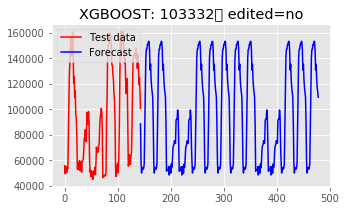


Forecasting from Cold Start Data:   7%|▋         | 41/625 [00:28<07:50,  1.24it/s]

100472 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 3 / 11 / 2015
work day avg= 107944.8174640127 	 off day avg= 59907.242157187604
[100472 'x-large' 'low' False False False False False True True]


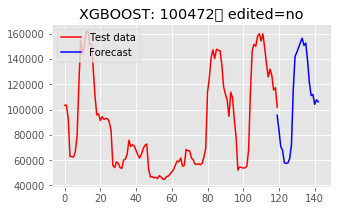


Forecasting from Cold Start Data:   7%|▋         | 42/625 [00:29<07:40,  1.26it/s]

100637 <class 'numpy.ndarray'>
Last day observed: Sunday 	 14 / 8 / 2016
work day avg= 118116.38918869953 	 off day avg= 71988.94842538968
[100637 'x-large' 'low' False False False False False True True]


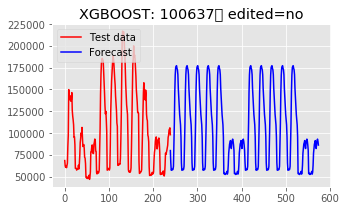


Forecasting from Cold Start Data:   7%|▋         | 43/625 [00:30<08:42,  1.11it/s]

103477 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 12 / 2016
work day avg= 71856.1884284591 	 off day avg= 54933.32336155739
[103477 'x-large' 'low' False False False False False True True]


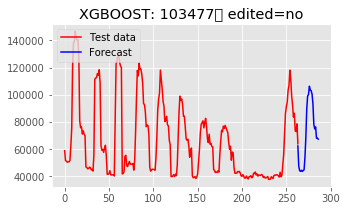


Forecasting from Cold Start Data:   7%|▋         | 44/625 [00:31<09:43,  1.00s/it]

100667 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 25 / 1 / 2017
work day avg= 57777.68279725371 	 off day avg= 30049.813442630064
[100667 'x-large' 'low' False False False False False True True]


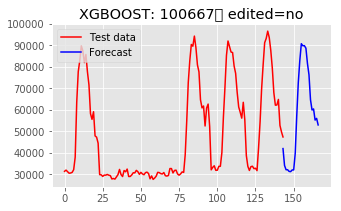


Forecasting from Cold Start Data:   7%|▋         | 45/625 [00:32<09:12,  1.05it/s]

102406 <class 'numpy.ndarray'>
Last day observed: Thursday 	 4 / 2 / 2016
work day avg= 148961.3332825785 	 off day avg= 100259.36757902591
[102406 'x-large' 'low' False False False False False True True]


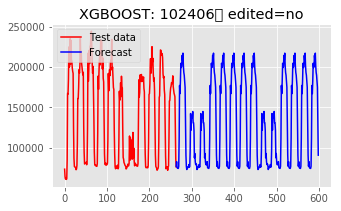


Forecasting from Cold Start Data:   7%|▋         | 46/625 [00:33<10:08,  1.05s/it]

101226 <class 'numpy.ndarray'>
Last day observed: Monday 	 21 / 3 / 2016
work day avg= 140875.66135735592 	 off day avg= nan
[101226 'x-large' 'low' False False False False False True True]


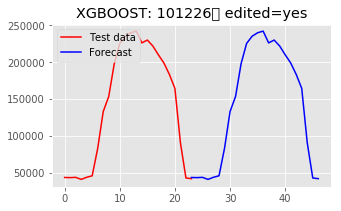


Forecasting from Cold Start Data:   8%|▊         | 47/625 [00:33<07:36,  1.27it/s]

101121 <class 'numpy.ndarray'>
Last day observed: Sunday 	 5 / 5 / 2013
work day avg= nan 	 off day avg= 93384.61281995312
[101121 'x-large' 'low' False False False False False True True]


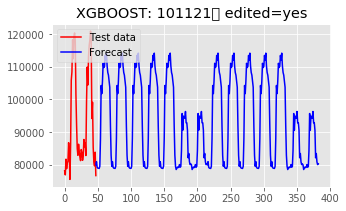


Forecasting from Cold Start Data:   8%|▊         | 48/625 [00:34<06:05,  1.58it/s]

102920 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 11 / 6 / 2014
work day avg= 148311.25906846183 	 off day avg= 112528.98373492388
[102920 'x-large' 'low' False False False False False True True]


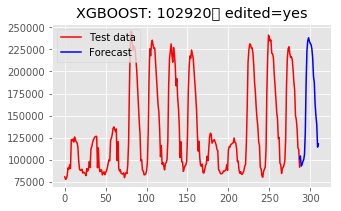


Forecasting from Cold Start Data:   8%|▊         | 49/625 [00:35<08:01,  1.20it/s]

100730 <class 'numpy.ndarray'>
Last day observed: Thursday 	 19 / 3 / 2015
work day avg= 154917.77387736557 	 off day avg= 99273.78900661804
[100730 'x-large' 'low' False False False False False True True]


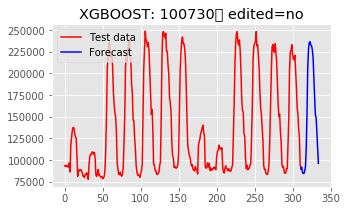


Forecasting from Cold Start Data:   8%|▊         | 50/625 [00:36<09:33,  1.00it/s]

100360 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 5 / 2015
work day avg= 137435.85237902196 	 off day avg= 104159.29123297354
[100360 'x-large' 'low' False False False False False True True]


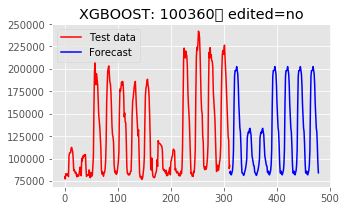


Forecasting from Cold Start Data:   8%|▊         | 51/625 [00:38<10:38,  1.11s/it]

103449 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 6 / 2015
work day avg= nan 	 off day avg= 103970.98557169484
[103449 'x-large' 'low' False False False False False True True]


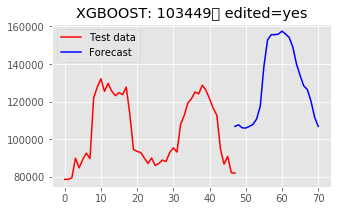


Forecasting from Cold Start Data:   8%|▊         | 52/625 [00:38<07:59,  1.20it/s]

103464 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 4 / 2016
work day avg= nan 	 off day avg= 91493.86491336458
[103464 'x-large' 'low' False False False False False True True]


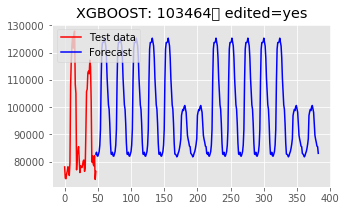


Forecasting from Cold Start Data:   8%|▊         | 53/625 [00:38<06:25,  1.48it/s]

101672 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 21 / 6 / 2016
work day avg= 99236.73335198204 	 off day avg= 80438.15934801834
[101672 'x-large' 'low' False False False False False True True]


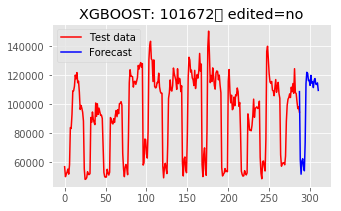


Forecasting from Cold Start Data:   9%|▊         | 54/625 [00:39<08:04,  1.18it/s]

102340 <class 'numpy.ndarray'>
Last day observed: Thursday 	 23 / 3 / 2017
work day avg= 95841.44588420165 	 off day avg= 81795.89891571367
[102340 'x-large' 'low' False False False False False True True]


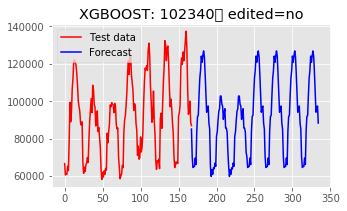


Forecasting from Cold Start Data:   9%|▉         | 55/625 [00:40<08:15,  1.15it/s]

102471 <class 'numpy.ndarray'>
Last day observed: Thursday 	 4 / 9 / 2014
work day avg= 114961.15577512815 	 off day avg= 104346.41160321522
[102471 'x-small' 'low' False False False False False True True]


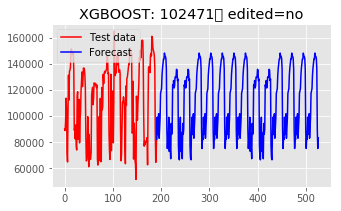


Forecasting from Cold Start Data:   9%|▉         | 56/625 [00:41<08:36,  1.10it/s]

101411 <class 'numpy.ndarray'>
Last day observed: Sunday 	 21 / 12 / 2014
work day avg= 127143.539318303 	 off day avg= 126183.68154794443
[101411 'x-small' 'low' False False False False False True True]


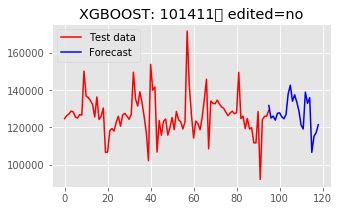


Forecasting from Cold Start Data:   9%|▉         | 57/625 [00:42<06:56,  1.36it/s]

100658 <class 'numpy.ndarray'>
Last day observed: Monday 	 15 / 6 / 2015
work day avg= 141466.94202483192 	 off day avg= 141591.18980942885
[100658 'x-small' 'low' False False False False False True True]


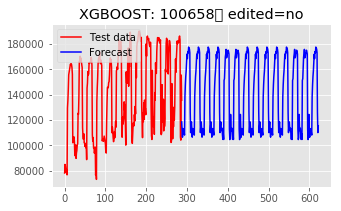


Forecasting from Cold Start Data:   9%|▉         | 58/625 [00:43<08:42,  1.08it/s]

101414 <class 'numpy.ndarray'>
Last day observed: Thursday 	 6 / 8 / 2015
work day avg= 158398.30306577237 	 off day avg= 151065.6012879452
[101414 'x-small' 'low' False False False False False True True]


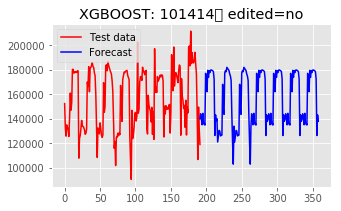


Forecasting from Cold Start Data:   9%|▉         | 59/625 [00:44<08:55,  1.06it/s]

102394 <class 'numpy.ndarray'>
Last day observed: Saturday 	 16 / 1 / 2016
work day avg= 99746.3889896575 	 off day avg= 99060.89747069975
[102394 'x-small' 'low' False False False False False True True]


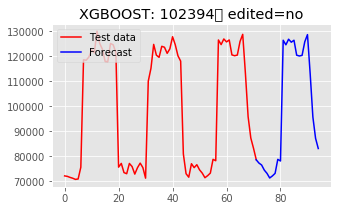


Forecasting from Cold Start Data:  10%|▉         | 60/625 [00:45<07:45,  1.21it/s]

100167 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 22 / 3 / 2016
work day avg= 141516.9452650876 	 off day avg= 153409.85048258377
[100167 'x-small' 'low' False False False False False True True]


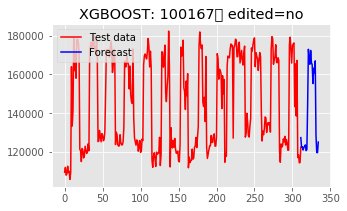


Forecasting from Cold Start Data:  10%|▉         | 61/625 [00:46<09:44,  1.04s/it]

102568 <class 'numpy.ndarray'>
Last day observed: Monday 	 16 / 5 / 2016
work day avg= 135715.7626034072 	 off day avg= 125473.70912113281
[102568 'x-small' 'low' False False False False False True True]


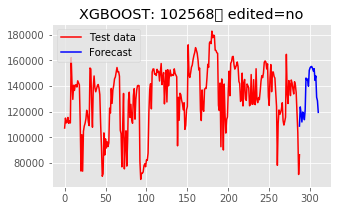


Forecasting from Cold Start Data:  10%|▉         | 62/625 [00:47<10:20,  1.10s/it]

101318 <class 'numpy.ndarray'>
Last day observed: Thursday 	 7 / 7 / 2016
work day avg= 143100.10632070026 	 off day avg= 133373.70852520168
[101318 'x-small' 'low' False False False False False True True]


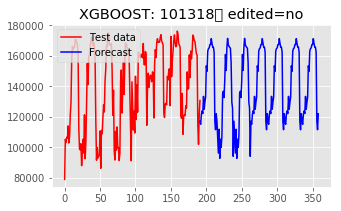


Forecasting from Cold Start Data:  10%|█         | 63/625 [00:48<10:03,  1.07s/it]

102367 <class 'numpy.ndarray'>
Last day observed: Monday 	 31 / 10 / 2016
work day avg= 131938.587074652 	 off day avg= 129110.98349466805
[102367 'x-small' 'low' False False False False False True True]


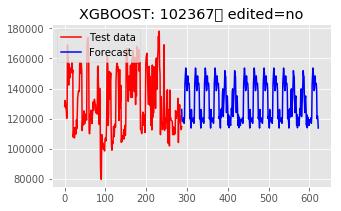


Forecasting from Cold Start Data:  10%|█         | 64/625 [00:49<10:10,  1.09s/it]

100646 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 15 / 2 / 2017
work day avg= 106136.54971606111 	 off day avg= 105163.31183330761
[100646 'x-small' 'low' False False False False False True True]


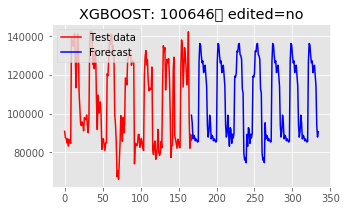


Forecasting from Cold Start Data:  10%|█         | 65/625 [00:50<09:08,  1.02it/s]

103629 <class 'numpy.ndarray'>
Last day observed: Thursday 	 3 / 8 / 2017
work day avg= 144173.00559654072 	 off day avg= 133524.95251348874
[103629 'x-small' 'low' False False False False False True True]


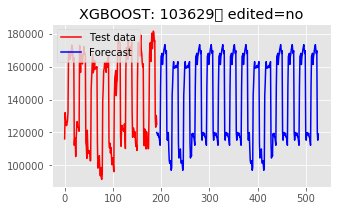


Forecasting from Cold Start Data:  11%|█         | 66/625 [00:51<08:59,  1.04it/s]

101664 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 4 / 10 / 2017
work day avg= 159028.01656742176 	 off day avg= 138483.21719680066
[101664 'x-small' 'low' False False False False False True True]


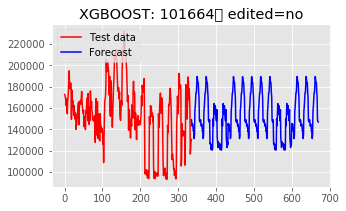


Forecasting from Cold Start Data:  11%|█         | 67/625 [00:52<09:41,  1.04s/it]

100809 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 11 / 2017
work day avg= 102927.88914775633 	 off day avg= 107562.20591154858
[100809 'x-small' 'low' False False False False False True True]


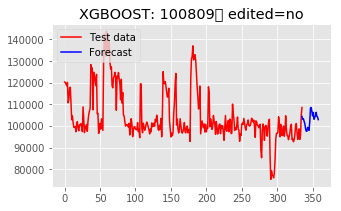


Forecasting from Cold Start Data:  11%|█         | 68/625 [00:53<09:04,  1.02it/s]

103236 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 23 / 5 / 2017
work day avg= 94393.18006593437 	 off day avg= 43786.72874365515
[103236 'x-large' 'low' False False False False False True True]


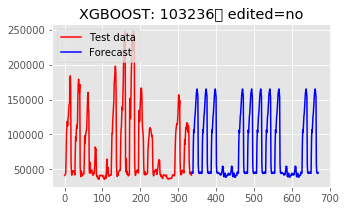


Forecasting from Cold Start Data:  11%|█         | 69/625 [00:55<10:19,  1.11s/it]

100012 <class 'numpy.ndarray'>
Last day observed: Friday 	 14 / 7 / 2017
work day avg= 162356.1938768837 	 off day avg= 93300.55966291888
[100012 'x-large' 'low' False False False False False True True]


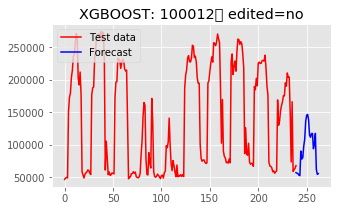


Forecasting from Cold Start Data:  11%|█         | 70/625 [00:56<10:26,  1.13s/it]

102090 <class 'numpy.ndarray'>
Last day observed: Saturday 	 9 / 9 / 2017
work day avg= 93963.71283768404 	 off day avg= 44643.05373484659
[102090 'x-large' 'low' False False False False False True True]


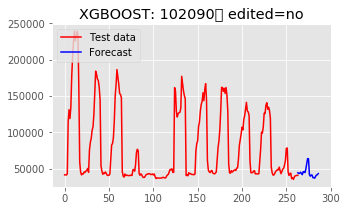


Forecasting from Cold Start Data:  11%|█▏        | 71/625 [00:57<10:28,  1.13s/it]

101860 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 1 / 11 / 2017
work day avg= 82939.3395725319 	 off day avg= 44674.740099314775
[101860 'x-large' 'low' False False False False False True True]


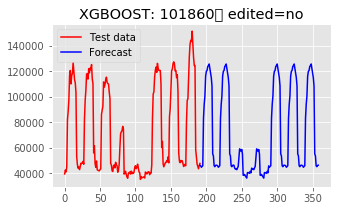


Forecasting from Cold Start Data:  12%|█▏        | 72/625 [00:58<10:06,  1.10s/it]

101667 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 12 / 2017
work day avg= 103317.89836201209 	 off day avg= 111742.5012096847
[101667 'xx-small' 'low' False False False False False True True]


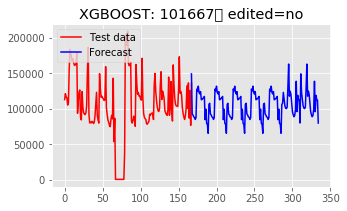


Forecasting from Cold Start Data:  12%|█▏        | 73/625 [00:59<09:09,  1.00it/s]

102164 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 7 / 10 / 2015
work day avg= 67956.31068970374 	 off day avg= 55380.49687754872
[102164 'large' 'low' False False False False False True True]


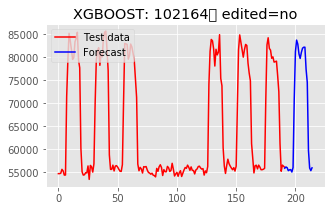


Forecasting from Cold Start Data:  12%|█▏        | 74/625 [01:00<09:07,  1.01it/s]

103219 <class 'numpy.ndarray'>
Last day observed: Thursday 	 21 / 1 / 2016
work day avg= 74510.55015159702 	 off day avg= nan
[103219 'large' 'low' False False False False False True True]


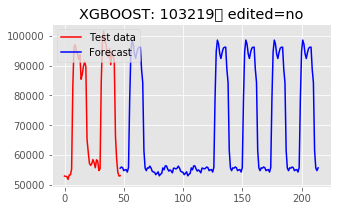


Forecasting from Cold Start Data:  12%|█▏        | 75/625 [01:00<06:59,  1.31it/s]

100072 <class 'numpy.ndarray'>
Last day observed: Sunday 	 24 / 4 / 2016
work day avg= 216259.49151212504 	 off day avg= 53722.38047065912
[100072 'medium' 'low' False False False False False False True]


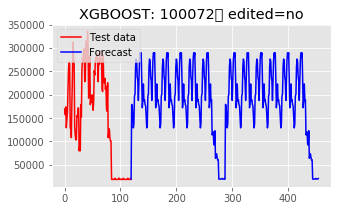


Forecasting from Cold Start Data:  12%|█▏        | 76/625 [01:01<07:05,  1.29it/s]

101747 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 2 / 2015
work day avg= 108438.52893688204 	 off day avg= 62508.75126034836
[101747 'large' 'low' False False True True True True True]


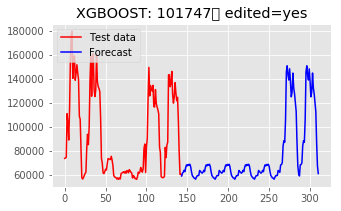


Forecasting from Cold Start Data:  12%|█▏        | 77/625 [01:02<07:20,  1.25it/s]

103073 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 5 / 2016
work day avg= 73678.54313866793 	 off day avg= 42325.97969771416
[103073 'large' 'low' False False True True True True True]


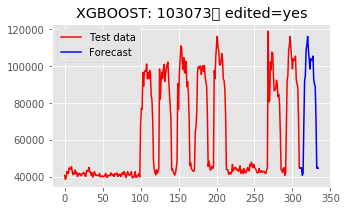


Forecasting from Cold Start Data:  12%|█▏        | 78/625 [01:03<08:55,  1.02it/s]

100380 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 21 / 2 / 2017
work day avg= 46104.74111542073 	 off day avg= 29074.648856635904
[100380 'large' 'low' False False True True True True True]


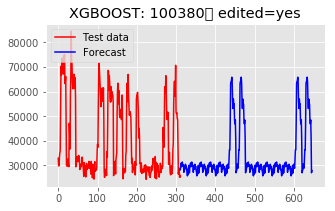


Forecasting from Cold Start Data:  13%|█▎        | 79/625 [01:04<10:12,  1.12s/it]

102630 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 12 / 2014
work day avg= 128731.37068781459 	 off day avg= 78934.54176683251
[102630 'small' 'low' False False False False False True True]


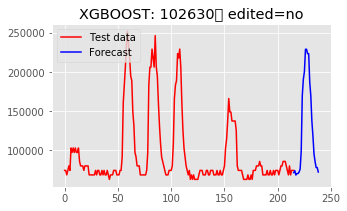


Forecasting from Cold Start Data:  13%|█▎        | 80/625 [01:05<09:25,  1.04s/it]

103049 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 2 / 2015
work day avg= 134565.73707732328 	 off day avg= 68545.27530130387
[103049 'small' 'low' False False False False False True True]


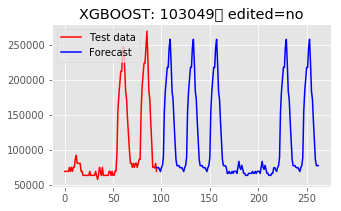


Forecasting from Cold Start Data:  13%|█▎        | 81/625 [01:06<07:59,  1.13it/s]

100925 <class 'numpy.ndarray'>
Last day observed: Friday 	 7 / 8 / 2015
work day avg= 117028.51880710416 	 off day avg= 60544.345954287564
[100925 'small' 'low' False False False False False True True]


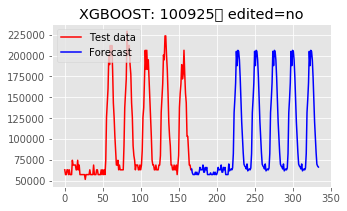


Forecasting from Cold Start Data:  13%|█▎        | 82/625 [01:07<07:42,  1.17it/s]

100711 <class 'numpy.ndarray'>
Last day observed: Friday 	 29 / 1 / 2016
work day avg= 128516.42034714848 	 off day avg= 57857.46669596119
[100711 'small' 'low' False False False False False True True]


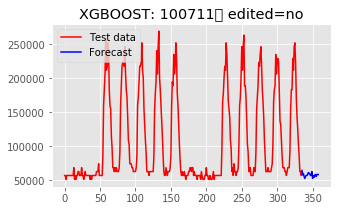


Forecasting from Cold Start Data:  13%|█▎        | 83/625 [01:08<09:09,  1.01s/it]

100902 <class 'numpy.ndarray'>
Last day observed: Saturday 	 19 / 3 / 2016
work day avg= 123429.26228471722 	 off day avg= 57041.451513802815
[100902 'small' 'low' False False False False False True True]


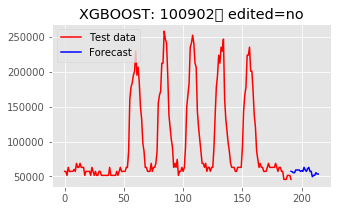


Forecasting from Cold Start Data:  13%|█▎        | 84/625 [01:09<08:53,  1.01it/s]

100204 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 5 / 2016
work day avg= 109099.23957364324 	 off day avg= 54931.75372578359
[100204 'small' 'low' False False False False False True True]


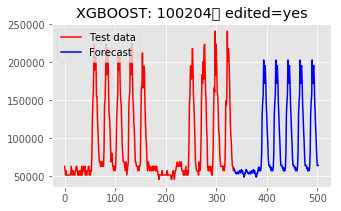


Forecasting from Cold Start Data:  14%|█▎        | 85/625 [01:10<09:43,  1.08s/it]

100761 <class 'numpy.ndarray'>
Last day observed: Friday 	 8 / 7 / 2016
work day avg= 109242.53980075398 	 off day avg= 51826.91547171756
[100761 'small' 'low' False False False False False True True]


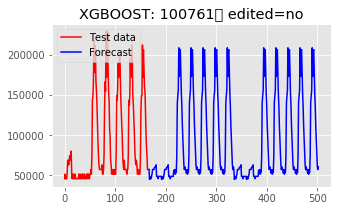


Forecasting from Cold Start Data:  14%|█▍        | 86/625 [01:11<09:14,  1.03s/it]

100733 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 2 / 2017
work day avg= 127172.9807179853 	 off day avg= 60305.51224243633
[100733 'small' 'low' False False False False False True True]


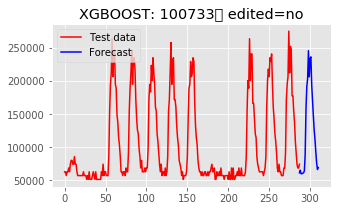


Forecasting from Cold Start Data:  14%|█▍        | 87/625 [01:12<09:59,  1.11s/it]

103271 <class 'numpy.ndarray'>
Last day observed: Thursday 	 20 / 4 / 2017
work day avg= 119792.16604423986 	 off day avg= 67629.74607254082
[103271 'small' 'low' False False False False False True True]


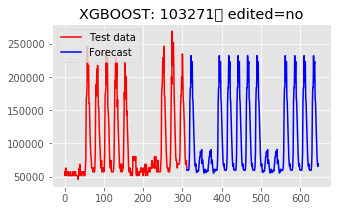


Forecasting from Cold Start Data:  14%|█▍        | 88/625 [01:14<10:45,  1.20s/it]

102879 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 6 / 2017
work day avg= nan 	 off day avg= 62733.65497959053
[102879 'small' 'low' False False False False False True True]


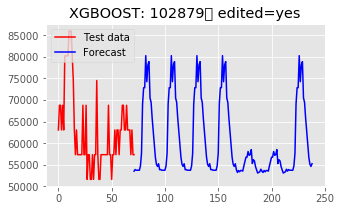


Forecasting from Cold Start Data:  14%|█▍        | 89/625 [01:14<08:09,  1.10it/s]

102719 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 8 / 8 / 2017
work day avg= 111076.63121895991 	 off day avg= 63410.35049650236
[102719 'small' 'low' False False False False False True True]


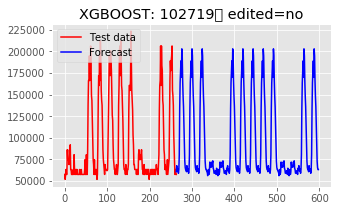


Forecasting from Cold Start Data:  14%|█▍        | 90/625 [01:15<08:43,  1.02it/s]

103438 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 26 / 9 / 2017
work day avg= 120849.8581967239 	 off day avg= 62096.76508132058
[103438 'small' 'low' False False False False False True True]


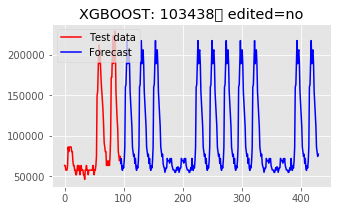


Forecasting from Cold Start Data:  15%|█▍        | 91/625 [01:16<07:41,  1.16it/s]

103463 <class 'numpy.ndarray'>
Last day observed: Sunday 	 19 / 11 / 2017
work day avg= nan 	 off day avg= 61260.84708984126
[103463 'small' 'low' False False False False False True True]


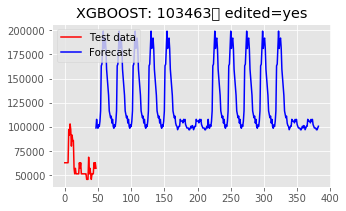


Forecasting from Cold Start Data:  15%|█▍        | 92/625 [01:16<06:04,  1.46it/s]

103617 <class 'numpy.ndarray'>
Last day observed: Monday 	 13 / 4 / 2015
work day avg= 31263.877909728777 	 off day avg= 28451.953429004796
[103617 'medium' 'low' False False False False False True True]


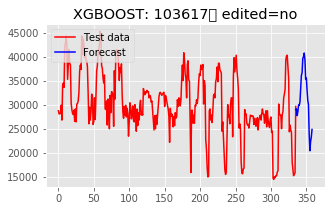


Forecasting from Cold Start Data:  15%|█▍        | 93/625 [01:17<07:09,  1.24it/s]

102765 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 21 / 7 / 2015
work day avg= 22747.61044616207 	 off day avg= nan
[102765 'medium' 'low' False False False False False True True]


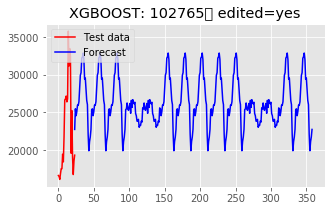


Forecasting from Cold Start Data:  15%|█▌        | 94/625 [01:17<05:38,  1.57it/s]

102047 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 9 / 2015
work day avg= 18330.72461662792 	 off day avg= 13249.315921579182
[102047 'medium' 'low' False False False False False True True]


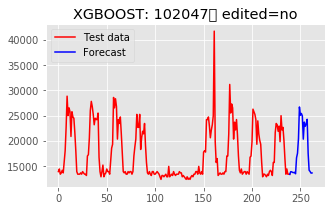


Forecasting from Cold Start Data:  15%|█▌        | 95/625 [01:18<05:52,  1.50it/s]

101050 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 12 / 1 / 2016
work day avg= 26191.681308239633 	 off day avg= 19855.191944043327
[101050 'medium' 'low' False False False False False True True]


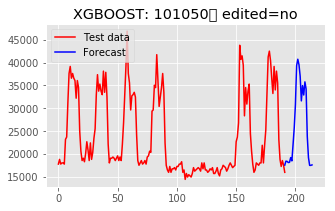


Forecasting from Cold Start Data:  15%|█▌        | 96/625 [01:19<06:05,  1.45it/s]

102078 <class 'numpy.ndarray'>
Last day observed: Thursday 	 30 / 6 / 2016
work day avg= 20154.361390227234 	 off day avg= 14719.673379056985
[102078 'medium' 'low' False False False False False True True]


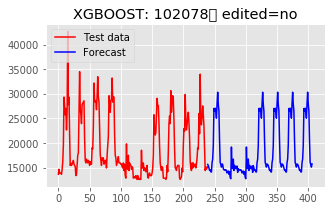


Forecasting from Cold Start Data:  16%|█▌        | 97/625 [01:20<06:32,  1.34it/s]

101964 <class 'numpy.ndarray'>
Last day observed: Monday 	 24 / 10 / 2016
work day avg= 25367.4225291572 	 off day avg= 17655.022025919607
[101964 'medium' 'low' False False False False False True True]


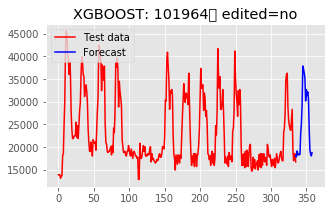


Forecasting from Cold Start Data:  16%|█▌        | 98/625 [01:21<07:59,  1.10it/s]

101477 <class 'numpy.ndarray'>
Last day observed: Monday 	 7 / 7 / 2014
work day avg= 65968.13914627374 	 off day avg= 59352.819533945876
[101477 'medium' 'low' False False False False False True True]


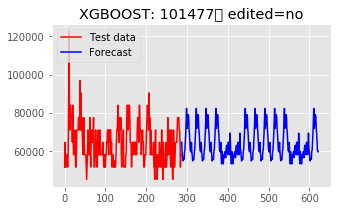


Forecasting from Cold Start Data:  16%|█▌        | 99/625 [01:22<07:53,  1.11it/s]

100814 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 2 / 9 / 2014
work day avg= 61954.83278637888 	 off day avg= 55449.799655296374
[100814 'medium' 'low' False False False False False True True]


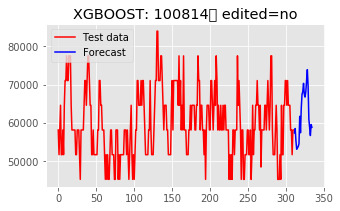


Forecasting from Cold Start Data:  16%|█▌        | 100/625 [01:23<08:08,  1.07it/s]

102288 <class 'numpy.ndarray'>
Last day observed: Thursday 	 16 / 10 / 2014
work day avg= 65140.05590573652 	 off day avg= nan
[102288 'medium' 'low' False False False False False True True]


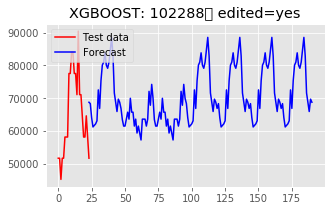


Forecasting from Cold Start Data:  16%|█▌        | 101/625 [01:23<06:14,  1.40it/s]

101046 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 24 / 12 / 2014
work day avg= 76660.69389237088 	 off day avg= 64399.827997716784
[101046 'medium' 'low' False False False False False True True]


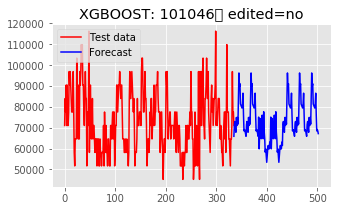


Forecasting from Cold Start Data:  16%|█▋        | 102/625 [01:24<07:16,  1.20it/s]

101413 <class 'numpy.ndarray'>
Last day observed: Thursday 	 4 / 6 / 2015
work day avg= 59958.46054959839 	 off day avg= 51412.19288427965
[101413 'medium' 'low' False False False False False True True]


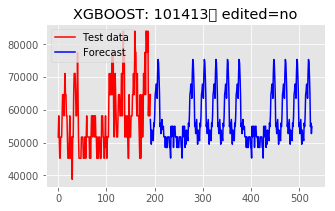


Forecasting from Cold Start Data:  16%|█▋        | 103/625 [01:25<07:08,  1.22it/s]

102943 <class 'numpy.ndarray'>
Last day observed: Thursday 	 10 / 3 / 2016
work day avg= 74067.65309942905 	 off day avg= 62313.73116602481
[102943 'medium' 'low' False False False False False True True]


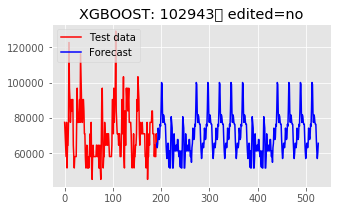


Forecasting from Cold Start Data:  17%|█▋        | 104/625 [01:26<07:20,  1.18it/s]

101482 <class 'numpy.ndarray'>
Last day observed: Thursday 	 9 / 11 / 2017
work day avg= 68100.96753781545 	 off day avg= nan
[101482 'medium' 'low' False False False False False True True]


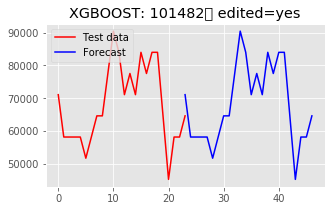


Forecasting from Cold Start Data:  17%|█▋        | 105/625 [01:26<05:38,  1.54it/s]

103175 <class 'numpy.ndarray'>
Last day observed: Thursday 	 19 / 1 / 2017
work day avg= 10729.749478379032 	 off day avg= 4499.2603111422795
[103175 'small' 'low' False False False False False True True]


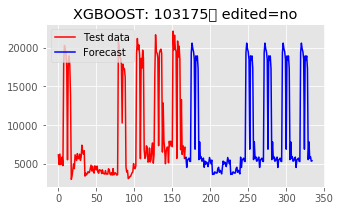


Forecasting from Cold Start Data:  17%|█▋        | 106/625 [01:27<05:10,  1.67it/s]

103254 <class 'numpy.ndarray'>
Last day observed: Friday 	 10 / 7 / 2015
work day avg= 16839.45946573286 	 off day avg= 4091.6494023323753
[103254 'x-small' 'low' False False False False False True True]


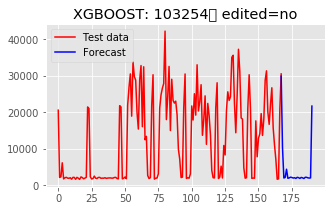


Forecasting from Cold Start Data:  17%|█▋        | 107/625 [01:27<05:52,  1.47it/s]

100905 <class 'numpy.ndarray'>
Last day observed: Sunday 	 1 / 11 / 2015
work day avg= 27089.362221611013 	 off day avg= 6830.928606324635
[100905 'x-small' 'low' False False False False False True True]


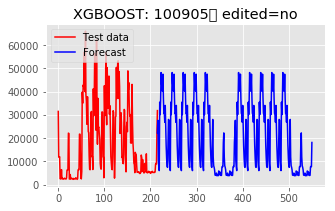


Forecasting from Cold Start Data:  17%|█▋        | 108/625 [01:28<06:28,  1.33it/s]

100593 <class 'numpy.ndarray'>
Last day observed: Sunday 	 20 / 12 / 2015
work day avg= nan 	 off day avg= 9109.13072288991
[100593 'x-small' 'low' False False False False False True True]


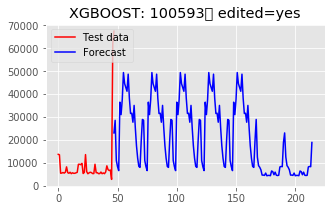


Forecasting from Cold Start Data:  17%|█▋        | 109/625 [01:29<05:07,  1.68it/s]

103364 <class 'numpy.ndarray'>
Last day observed: Sunday 	 21 / 2 / 2016
work day avg= 35056.02595152422 	 off day avg= 14391.529492587259
[103364 'x-small' 'low' False False False False False True True]


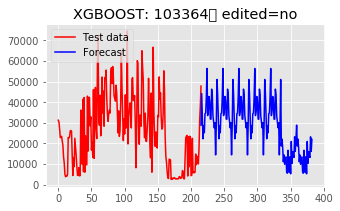


Forecasting from Cold Start Data:  18%|█▊        | 110/625 [01:30<06:24,  1.34it/s]

100477 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 19 / 4 / 2016
work day avg= 24409.68530335853 	 off day avg= 7291.286135265953
[100477 'x-small' 'low' False False False False False True True]


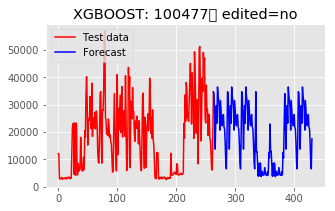


Forecasting from Cold Start Data:  18%|█▊        | 111/625 [01:31<07:36,  1.13it/s]

100746 <class 'numpy.ndarray'>
Last day observed: Friday 	 10 / 6 / 2016
work day avg= 18966.890094267997 	 off day avg= 8135.088386125048
[100746 'x-small' 'low' False False False False False True True]


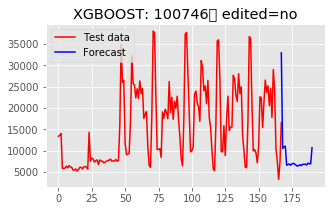


Forecasting from Cold Start Data:  18%|█▊        | 112/625 [01:32<07:37,  1.12it/s]

103434 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 7 / 2016
work day avg= nan 	 off day avg= 4730.3774847763125
[103434 'x-small' 'low' False False False False False True True]


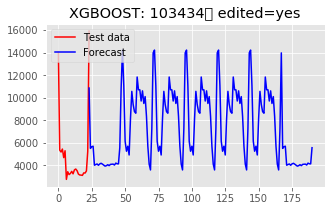


Forecasting from Cold Start Data:  18%|█▊        | 113/625 [01:32<05:56,  1.44it/s]

101002 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 27 / 9 / 2016
work day avg= 16583.904272001004 	 off day avg= 4746.207771460991
[101002 'x-small' 'low' False False False False False True True]


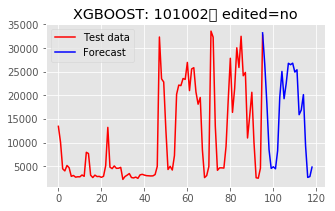


Forecasting from Cold Start Data:  18%|█▊        | 114/625 [01:33<06:00,  1.42it/s]

102123 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 29 / 11 / 2016
work day avg= 30190.823765347744 	 off day avg= 12263.795050469285
[102123 'x-small' 'low' False False False False False True True]


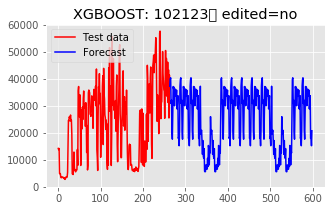


Forecasting from Cold Start Data:  18%|█▊        | 115/625 [01:34<07:38,  1.11it/s]

102167 <class 'numpy.ndarray'>
Last day observed: Friday 	 24 / 3 / 2017
work day avg= 26233.09433954622 	 off day avg= 6672.825616834976
[102167 'x-small' 'low' False False False False False True True]


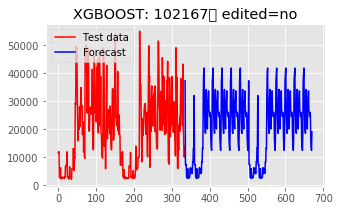


Forecasting from Cold Start Data:  19%|█▊        | 116/625 [01:36<09:11,  1.08s/it]

101004 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 16 / 5 / 2017
work day avg= 20779.34141971843 	 off day avg= 6916.755943476164
[101004 'x-small' 'low' False False False False False True True]


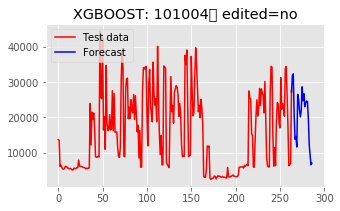


Forecasting from Cold Start Data:  19%|█▊        | 117/625 [01:37<09:23,  1.11s/it]

102160 <class 'numpy.ndarray'>
Last day observed: Monday 	 11 / 1 / 2016
work day avg= 34351.92541625925 	 off day avg= 28844.32774031969
[102160 'x-small' 'low' False False False False False True True]


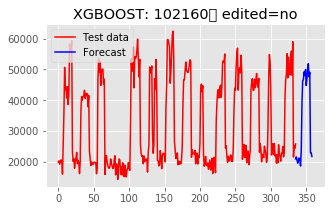


Forecasting from Cold Start Data:  19%|█▉        | 118/625 [01:38<10:14,  1.21s/it]

101302 <class 'numpy.ndarray'>
Last day observed: Friday 	 4 / 3 / 2016
work day avg= 32996.845376501355 	 off day avg= 28371.53324605903
[101302 'x-small' 'low' False False False False False True True]


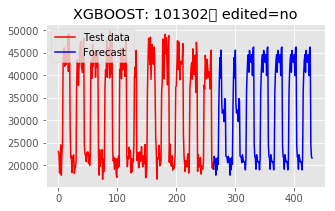


Forecasting from Cold Start Data:  19%|█▉        | 119/625 [01:40<10:23,  1.23s/it]

103380 <class 'numpy.ndarray'>
Last day observed: Sunday 	 1 / 5 / 2016
work day avg= 35066.83824346346 	 off day avg= 31575.192701826116
[103380 'x-small' 'low' False False False False False True True]


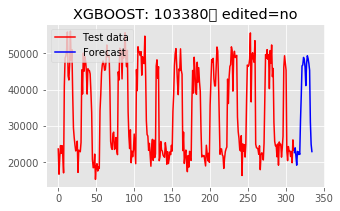


Forecasting from Cold Start Data:  19%|█▉        | 120/625 [01:41<10:35,  1.26s/it]

100289 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 17 / 5 / 2017
work day avg= 41222.4293792163 	 off day avg= nan
[100289 'x-small' 'low' False False False False False True True]


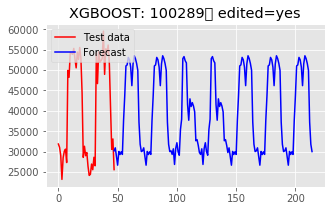


Forecasting from Cold Start Data:  19%|█▉        | 121/625 [01:41<07:59,  1.05it/s]

103131 <class 'numpy.ndarray'>
Last day observed: Sunday 	 17 / 9 / 2017
work day avg= 44218.065861936804 	 off day avg= 41045.07571900673
[103131 'x-small' 'low' False False False False False True True]


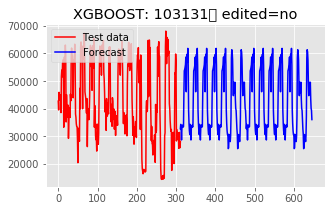


Forecasting from Cold Start Data:  20%|█▉        | 122/625 [01:42<09:08,  1.09s/it]

101284 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 31 / 10 / 2017
work day avg= 31487.66751886555 	 off day avg= nan
[101284 'x-small' 'low' False False False False False True True]


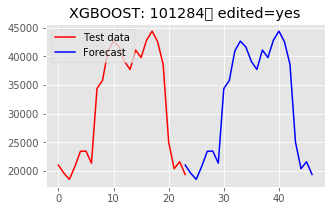


Forecasting from Cold Start Data:  20%|█▉        | 123/625 [01:43<06:50,  1.22it/s]

103523 <class 'numpy.ndarray'>
Last day observed: Sunday 	 8 / 10 / 2017
work day avg= 54024.862901824956 	 off day avg= 48663.849939033775
[103523 'small' 'low' False False False False False True True]


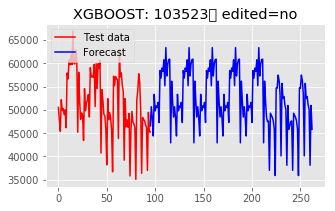


Forecasting from Cold Start Data:  20%|█▉        | 124/625 [01:43<06:22,  1.31it/s]

103166 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 2 / 2017
work day avg= 45783.243883377145 	 off day avg= 42094.64124404379
[103166 'xx-small' 'low' False False False False False True True]


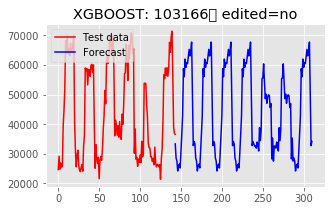


Forecasting from Cold Start Data:  20%|██        | 125/625 [01:44<06:33,  1.27it/s]

102905 <class 'numpy.ndarray'>
Last day observed: Friday 	 15 / 1 / 2016
work day avg= 8669.254333577352 	 off day avg= nan
[102905 'x-small' 'low' False False False False False True True]


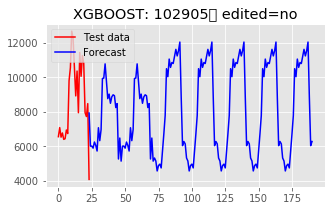


Forecasting from Cold Start Data:  20%|██        | 126/625 [01:44<05:10,  1.61it/s]

102028 <class 'numpy.ndarray'>
Last day observed: Friday 	 18 / 3 / 2016
work day avg= 15311.999977018775 	 off day avg= nan
[102028 'x-small' 'low' False False False False False True True]


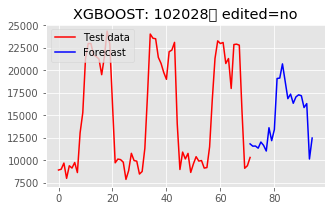


Forecasting from Cold Start Data:  20%|██        | 127/625 [01:45<04:08,  2.00it/s]

102245 <class 'numpy.ndarray'>
Last day observed: Saturday 	 18 / 2 / 2017
work day avg= 23265.179617626676 	 off day avg= 22774.604970885848
[102245 'x-small' 'low' False False False False False True True]


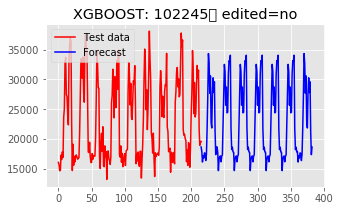


Forecasting from Cold Start Data:  20%|██        | 128/625 [01:46<05:26,  1.52it/s]

100252 <class 'numpy.ndarray'>
Last day observed: Thursday 	 13 / 4 / 2017
work day avg= 23392.63506096268 	 off day avg= 21654.896724904927
[100252 'x-small' 'low' False False False False False True True]


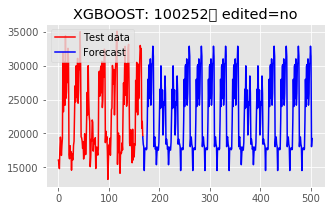


Forecasting from Cold Start Data:  21%|██        | 129/625 [01:47<06:00,  1.38it/s]

102279 <class 'numpy.ndarray'>
Last day observed: Sunday 	 6 / 8 / 2017
work day avg= 32890.20720427342 	 off day avg= 31200.782444758224
[102279 'x-small' 'low' False False False False False True True]


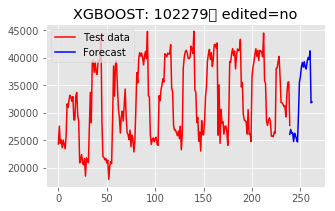


Forecasting from Cold Start Data:  21%|██        | 130/625 [01:48<06:46,  1.22it/s]

101698 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 11 / 2017
work day avg= 26511.65620125159 	 off day avg= 24419.928909803373
[101698 'x-small' 'low' False False False False False True True]


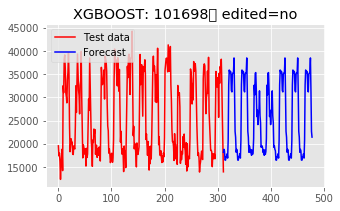


Forecasting from Cold Start Data:  21%|██        | 131/625 [01:49<08:05,  1.02it/s]

100732 <class 'numpy.ndarray'>
Last day observed: Saturday 	 5 / 11 / 2016
work day avg= 44889.18294638274 	 off day avg= 41824.99410492749
[100732 'x-small' 'low' False False False False False True True]


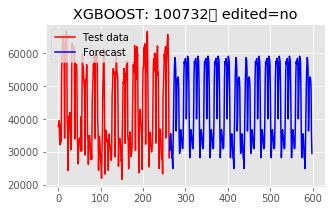


Forecasting from Cold Start Data:  21%|██        | 132/625 [01:50<08:59,  1.09s/it]

101518 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 2 / 8 / 2017
work day avg= 59295.78285664165 	 off day avg= nan
[101518 'x-small' 'low' False False False False False True True]


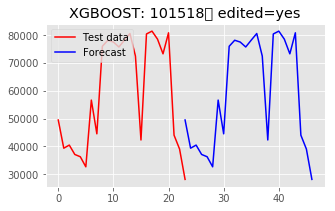


Forecasting from Cold Start Data:  21%|██▏       | 133/625 [01:50<06:44,  1.22it/s]

103476 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 12 / 2017
work day avg= 41240.760092084434 	 off day avg= 36679.74688243528
[103476 'x-small' 'low' False False False False False True True]


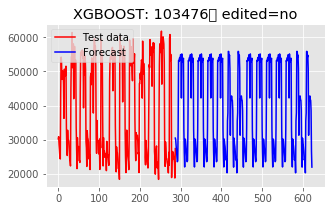


Forecasting from Cold Start Data:  21%|██▏       | 134/625 [01:52<07:48,  1.05it/s]

103455 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 5 / 2016
work day avg= 21675.759482474128 	 off day avg= 20324.138660208686
[103455 'x-small' 'low' False False False False False True True]


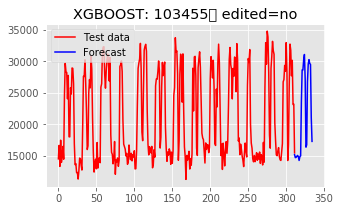


Forecasting from Cold Start Data:  22%|██▏       | 135/625 [01:53<08:29,  1.04s/it]

101189 <class 'numpy.ndarray'>
Last day observed: Monday 	 2 / 5 / 2016
work day avg= 29660.224185098778 	 off day avg= 27881.488461264427
[101189 'x-small' 'low' False False False False False True True]


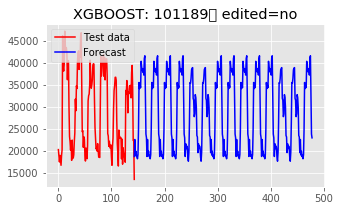


Forecasting from Cold Start Data:  22%|██▏       | 136/625 [01:54<07:50,  1.04it/s]

100835 <class 'numpy.ndarray'>
Last day observed: Friday 	 31 / 3 / 2017
work day avg= 28634.06823670149 	 off day avg= nan
[100835 'x-small' 'low' False False False False False True True]


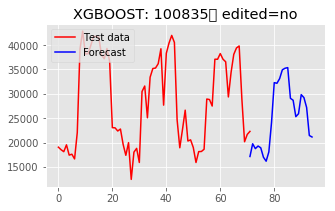


Forecasting from Cold Start Data:  22%|██▏       | 137/625 [01:54<05:57,  1.36it/s]

101361 <class 'numpy.ndarray'>
Last day observed: Saturday 	 16 / 9 / 2017
work day avg= 32250.233235660642 	 off day avg= 35405.05621748569
[101361 'x-small' 'low' False False False False False True True]


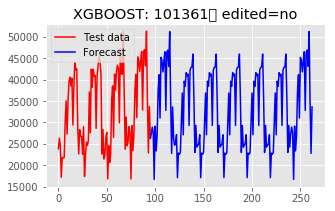


Forecasting from Cold Start Data:  22%|██▏       | 138/625 [01:55<05:38,  1.44it/s]

101503 <class 'numpy.ndarray'>
Last day observed: Friday 	 6 / 5 / 2016
work day avg= 35280.37515403858 	 off day avg= nan
[101503 'x-small' 'low' False False False False False True True]


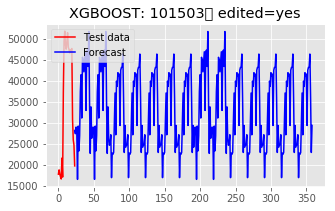


Forecasting from Cold Start Data:  22%|██▏       | 139/625 [01:55<04:37,  1.75it/s]

100235 <class 'numpy.ndarray'>
Last day observed: Friday 	 17 / 2 / 2017
work day avg= 23787.83720917618 	 off day avg= 20470.557768329745
[100235 'x-small' 'low' False False False False False True True]


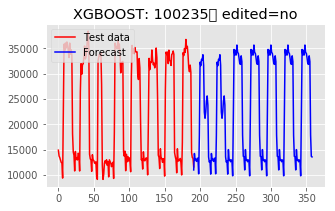


Forecasting from Cold Start Data:  22%|██▏       | 140/625 [01:56<05:46,  1.40it/s]

100803 <class 'numpy.ndarray'>
Last day observed: Saturday 	 10 / 6 / 2017
work day avg= 24024.92162742357 	 off day avg= 24049.018879239058
[100803 'x-small' 'low' False False False False False True True]


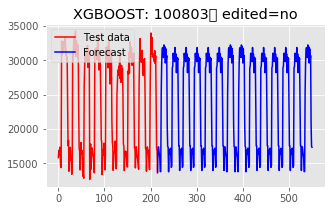


Forecasting from Cold Start Data:  23%|██▎       | 141/625 [01:57<06:37,  1.22it/s]

102424 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 23 / 3 / 2016
work day avg= 36271.912331316365 	 off day avg= 31407.300687477662
[102424 'x-small' 'low' False False False False False True True]


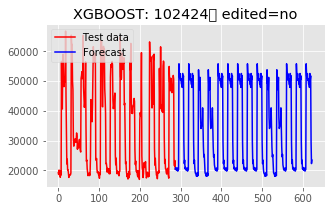


Forecasting from Cold Start Data:  23%|██▎       | 142/625 [01:58<07:51,  1.02it/s]

102229 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 7 / 2016
work day avg= 37761.2435147602 	 off day avg= 36791.366415338925
[102229 'x-small' 'low' False False False False False True True]


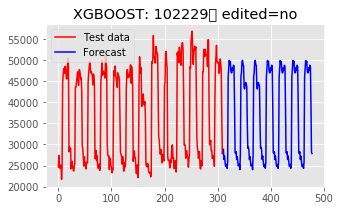


Forecasting from Cold Start Data:  23%|██▎       | 143/625 [02:00<08:41,  1.08s/it]

103527 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 31 / 5 / 2016
work day avg= 38614.082852375526 	 off day avg= 36421.74563833282
[103527 'x-small' 'low' False False False False False True True]


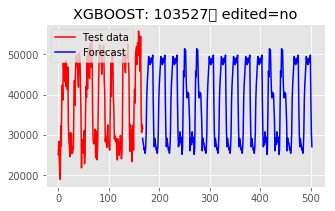


Forecasting from Cold Start Data:  23%|██▎       | 144/625 [02:01<08:17,  1.03s/it]

100901 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 21 / 9 / 2016
work day avg= 37001.179895896465 	 off day avg= 35110.169005666365
[100901 'x-small' 'low' False False False False False True True]


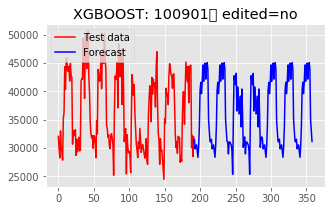


Forecasting from Cold Start Data:  23%|██▎       | 145/625 [02:01<08:02,  1.00s/it]

101295 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 22 / 11 / 2016
work day avg= 33187.92880773331 	 off day avg= 31238.959410953103
[101295 'x-small' 'low' False False False False False True True]


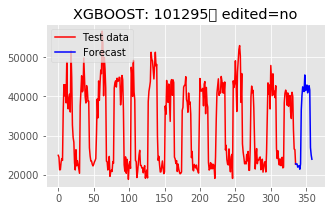


Forecasting from Cold Start Data:  23%|██▎       | 146/625 [02:03<09:06,  1.14s/it]

100605 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 3 / 2017
work day avg= 28760.521442470465 	 off day avg= nan
[100605 'x-small' 'low' False False False False False True True]


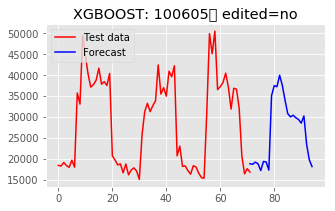


Forecasting from Cold Start Data:  24%|██▎       | 147/625 [02:03<06:55,  1.15it/s]

102830 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 10 / 2017
work day avg= 40601.015131269254 	 off day avg= 38362.33614610407
[102830 'x-small' 'low' False False False False False True True]


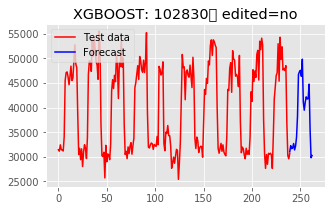


Forecasting from Cold Start Data:  24%|██▎       | 148/625 [02:04<07:37,  1.04it/s]

102202 <class 'numpy.ndarray'>
Last day observed: Saturday 	 29 / 10 / 2016
work day avg= nan 	 off day avg= 33669.030854984885
[102202 'medium' 'low' False False False False False True True]


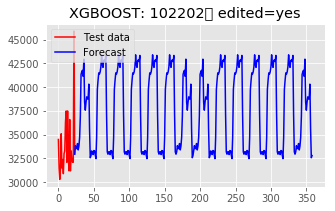


Forecasting from Cold Start Data:  24%|██▍       | 149/625 [02:05<06:09,  1.29it/s]

101848 <class 'numpy.ndarray'>
Last day observed: Monday 	 26 / 12 / 2016
work day avg= nan 	 off day avg= 27728.417393068474
[101848 'medium' 'low' False False False False False True True]


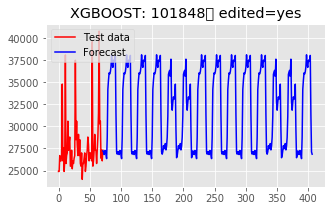


Forecasting from Cold Start Data:  24%|██▍       | 150/625 [02:05<05:39,  1.40it/s]

100242 <class 'numpy.ndarray'>
Last day observed: Monday 	 4 / 4 / 2016
work day avg= 44086.701286994765 	 off day avg= 43172.6085701303
[100242 'x-small' 'low' False False False False False True True]


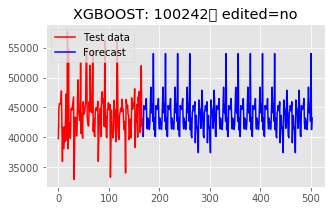


Forecasting from Cold Start Data:  24%|██▍       | 151/625 [02:06<06:01,  1.31it/s]

103505 <class 'numpy.ndarray'>
Last day observed: Monday 	 22 / 8 / 2016
work day avg= 9791.716439728198 	 off day avg= 8645.315326311467
[103505 'x-small' 'low' False False False False False True True]


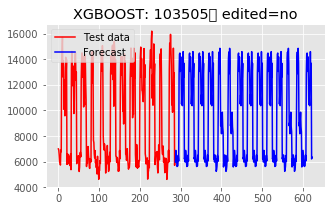


Forecasting from Cold Start Data:  24%|██▍       | 152/625 [02:08<07:26,  1.06it/s]

102796 <class 'numpy.ndarray'>
Last day observed: Monday 	 26 / 9 / 2016
work day avg= 34557.12918363116 	 off day avg= 31342.856577567338
[102796 'x-small' 'low' False False False False False True True]


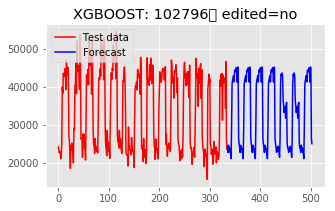


Forecasting from Cold Start Data:  24%|██▍       | 153/625 [02:09<08:33,  1.09s/it]

100582 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 13 / 9 / 2016
work day avg= 50416.02001605924 	 off day avg= nan
[100582 'x-small' 'low' False False False False False True True]


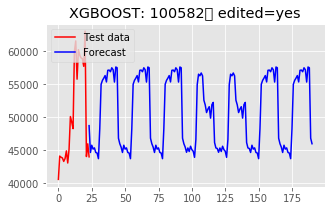


Forecasting from Cold Start Data:  25%|██▍       | 154/625 [02:09<06:31,  1.20it/s]

102465 <class 'numpy.ndarray'>
Last day observed: Saturday 	 8 / 10 / 2016
work day avg= 47117.35349335615 	 off day avg= 49396.326122088845
[102465 'small' 'low' False False False False False True True]


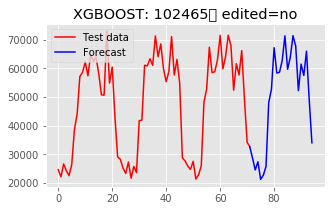


Forecasting from Cold Start Data:  25%|██▍       | 155/625 [02:10<05:44,  1.36it/s]

101353 <class 'numpy.ndarray'>
Last day observed: Monday 	 25 / 7 / 2016
work day avg= 84318.0864532462 	 off day avg= 76506.34870848845
[101353 'small' 'low' False False False False False True True]


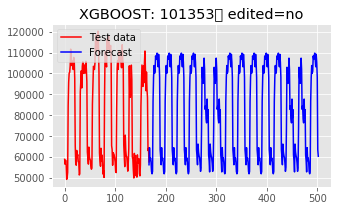


Forecasting from Cold Start Data:  25%|██▍       | 156/625 [02:11<06:14,  1.25it/s]

102910 <class 'numpy.ndarray'>
Last day observed: Friday 	 25 / 7 / 2014
work day avg= 25957.17835234985 	 off day avg= 26133.946321784093
[102910 'xx-small' 'low' False False False False False True True]


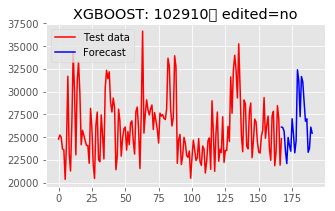


Forecasting from Cold Start Data:  25%|██▌       | 157/625 [02:11<05:42,  1.37it/s]

100717 <class 'numpy.ndarray'>
Last day observed: Monday 	 17 / 11 / 2014
work day avg= 30892.052042448588 	 off day avg= 30655.19290039437
[100717 'xx-small' 'low' False False False False False True True]


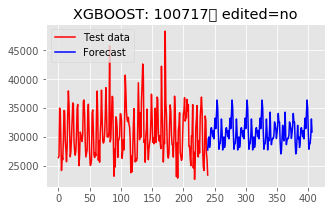


Forecasting from Cold Start Data:  25%|██▌       | 158/625 [02:12<05:26,  1.43it/s]

103356 <class 'numpy.ndarray'>
Last day observed: Thursday 	 8 / 1 / 2015
work day avg= 28673.47233196553 	 off day avg= 30137.33782941439
[103356 'xx-small' 'low' False False False False False True True]


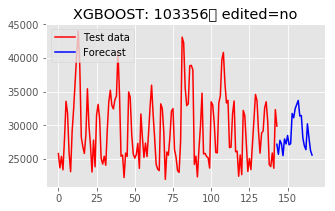


Forecasting from Cold Start Data:  25%|██▌       | 159/625 [02:13<05:29,  1.41it/s]

101450 <class 'numpy.ndarray'>
Last day observed: Monday 	 2 / 3 / 2015
work day avg= 38573.7299446554 	 off day avg= 41042.740146084805
[101450 'xx-small' 'low' False False False False False True True]


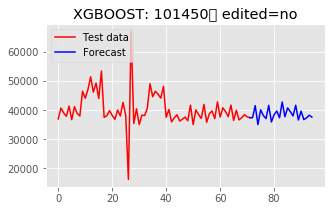


Forecasting from Cold Start Data:  26%|██▌       | 160/625 [02:13<04:29,  1.73it/s]

101975 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 6 / 5 / 2015
work day avg= 39057.503513899406 	 off day avg= 38024.14828028571
[101975 'xx-small' 'low' False False False False False True True]


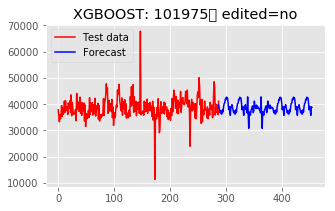


Forecasting from Cold Start Data:  26%|██▌       | 161/625 [02:13<04:24,  1.76it/s]

100815 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 30 / 6 / 2015
work day avg= 30880.514095661656 	 off day avg= 29897.994440444327
[100815 'xx-small' 'low' False False False False False True True]


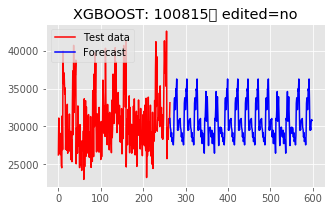


Forecasting from Cold Start Data:  26%|██▌       | 162/625 [02:14<04:51,  1.59it/s]

100876 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 8 / 2015
work day avg= 36129.18957534708 	 off day avg= 36600.45121528318
[100876 'xx-small' 'low' False False False False False True True]


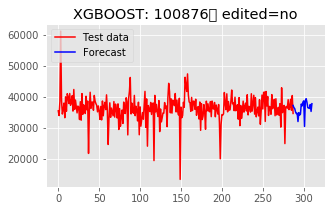


Forecasting from Cold Start Data:  26%|██▌       | 163/625 [02:15<04:31,  1.70it/s]

102377 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 14 / 10 / 2015
work day avg= 38892.707248650106 	 off day avg= 36801.46819489044
[102377 'xx-small' 'low' False False False False False True True]


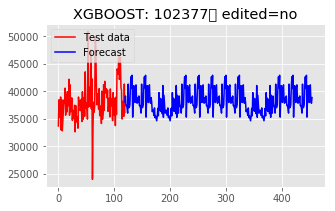


Forecasting from Cold Start Data:  26%|██▌       | 164/625 [02:15<04:12,  1.83it/s]

102560 <class 'numpy.ndarray'>
Last day observed: Saturday 	 11 / 10 / 2014
work day avg= 74731.54683159082 	 off day avg= 68586.96937272568
[102560 'x-large' 'low' False False False False False True True]


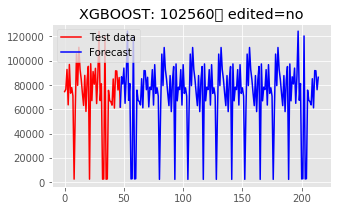


Forecasting from Cold Start Data:  26%|██▋       | 165/625 [02:15<03:50,  1.99it/s]

101693 <class 'numpy.ndarray'>
Last day observed: Thursday 	 5 / 2 / 2015
work day avg= 58375.13869222805 	 off day avg= 61983.355109945354
[101693 'x-large' 'low' False False False False False True True]


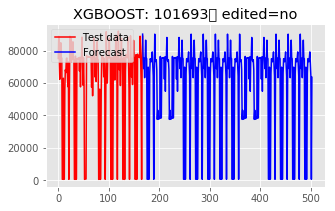


Forecasting from Cold Start Data:  27%|██▋       | 166/625 [02:16<03:54,  1.96it/s]

100775 <class 'numpy.ndarray'>
Last day observed: Monday 	 30 / 3 / 2015
work day avg= 74255.43530650636 	 off day avg= 75115.05872883
[100775 'x-large' 'low' False False False False False True True]


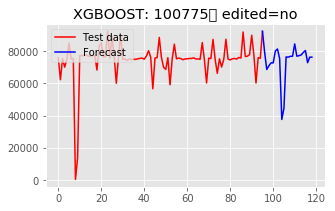


Forecasting from Cold Start Data:  27%|██▋       | 167/625 [02:16<03:39,  2.08it/s]

103541 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 26 / 5 / 2015
work day avg= 83650.28838827275 	 off day avg= 83072.98068239162
[103541 'x-large' 'low' False False False False False True True]


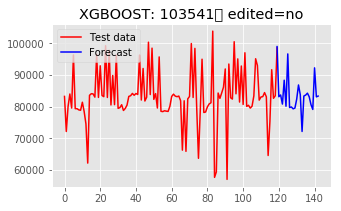


Forecasting from Cold Start Data:  27%|██▋       | 168/625 [02:17<03:36,  2.11it/s]

101065 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 7 / 2015
work day avg= 82076.39371224232 	 off day avg= 83714.79668485031
[101065 'x-large' 'low' False False False False False True True]


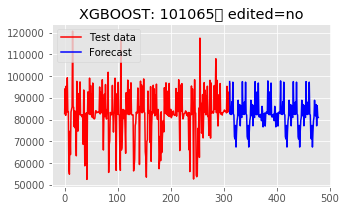


Forecasting from Cold Start Data:  27%|██▋       | 169/625 [02:17<03:51,  1.97it/s]

103385 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 2 / 2015
work day avg= 247028.21581904244 	 off day avg= 206268.84875955546
[103385 'x-large' 'low' False False False False False True True]


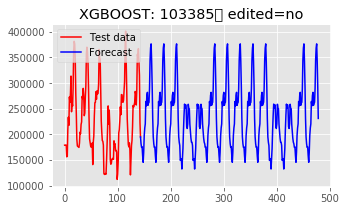


Forecasting from Cold Start Data:  27%|██▋       | 170/625 [02:18<04:40,  1.62it/s]

100882 <class 'numpy.ndarray'>
Last day observed: Friday 	 10 / 4 / 2015
work day avg= 236794.18973511065 	 off day avg= nan
[100882 'x-large' 'low' False False False False False True True]


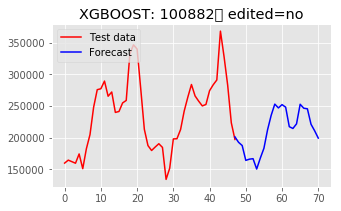


Forecasting from Cold Start Data:  27%|██▋       | 171/625 [02:19<03:42,  2.04it/s]

100584 <class 'numpy.ndarray'>
Last day observed: Monday 	 8 / 6 / 2015
work day avg= 233026.6800152056 	 off day avg= 166194.86164356134
[100584 'x-large' 'low' False False False False False True True]


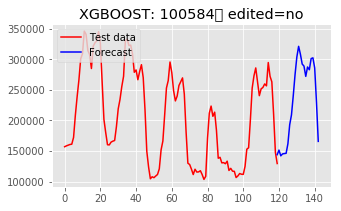


Forecasting from Cold Start Data:  28%|██▊       | 172/625 [02:19<04:13,  1.79it/s]

101929 <class 'numpy.ndarray'>
Last day observed: Sunday 	 22 / 11 / 2015
work day avg= 271330.67336701485 	 off day avg= 220417.7858563652
[101929 'x-large' 'low' False False False False False True True]


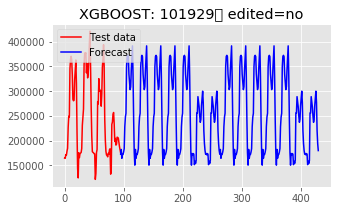


Forecasting from Cold Start Data:  28%|██▊       | 173/625 [02:20<04:31,  1.67it/s]

101738 <class 'numpy.ndarray'>
Last day observed: Monday 	 24 / 8 / 2015
work day avg= 10021.817677460494 	 off day avg= 7807.400516257039
[101738 'small' 'low' False False False False False True True]


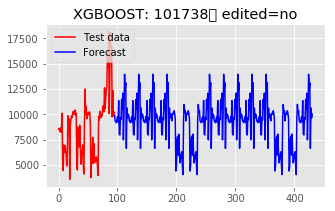


Forecasting from Cold Start Data:  28%|██▊       | 174/625 [02:20<04:23,  1.71it/s]

103125 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 21 / 10 / 2015
work day avg= 11141.54719516111 	 off day avg= 8707.119282077183
[103125 'small' 'low' False False False False False True True]


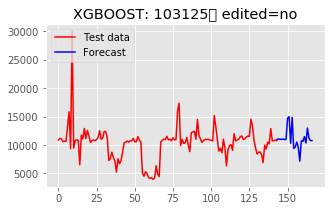


Forecasting from Cold Start Data:  28%|██▊       | 175/625 [02:21<04:36,  1.63it/s]

103597 <class 'numpy.ndarray'>
Last day observed: Friday 	 11 / 12 / 2015
work day avg= 12720.079622271005 	 off day avg= nan
[103597 'small' 'low' False False False False False True True]


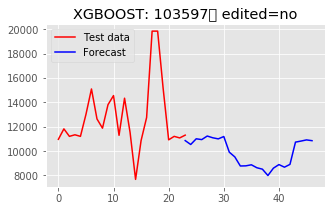


Forecasting from Cold Start Data:  28%|██▊       | 176/625 [02:21<03:39,  2.05it/s]

100310 <class 'numpy.ndarray'>
Last day observed: Monday 	 27 / 10 / 2014
work day avg= 22948.48959577432 	 off day avg= 18087.233846292984
[100310 'x-large' 'low' False False False False False True True]


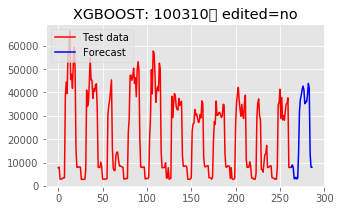


Forecasting from Cold Start Data:  28%|██▊       | 177/625 [02:23<05:06,  1.46it/s]

101581 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 4 / 2015
work day avg= nan 	 off day avg= 11059.756913357487
[101581 'x-large' 'low' False False False False False True True]


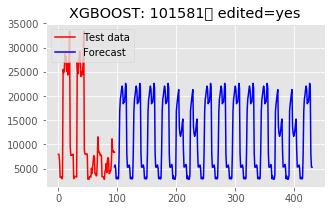


Forecasting from Cold Start Data:  28%|██▊       | 178/625 [02:23<04:08,  1.80it/s]

103461 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 30 / 8 / 2016
work day avg= 32887.629608020085 	 off day avg= 18881.916762142573
[103461 'x-large' 'low' False False False False False True True]


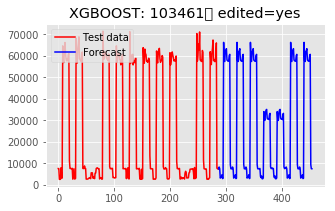


Forecasting from Cold Start Data:  29%|██▊       | 179/625 [02:24<05:44,  1.29it/s]

100104 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 14 / 12 / 2016
work day avg= 23645.761623695216 	 off day avg= 17553.97598204523
[100104 'x-large' 'low' False False False False False True True]


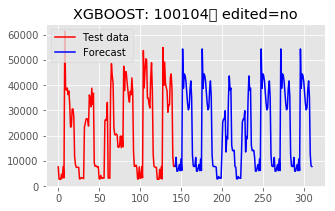


Forecasting from Cold Start Data:  29%|██▉       | 180/625 [02:25<05:29,  1.35it/s]

100769 <class 'numpy.ndarray'>
Last day observed: Sunday 	 1 / 2 / 2015
work day avg= 16210.700800265962 	 off day avg= 16209.368486902289
[100769 'x-large' 'low' False False False False False True True]


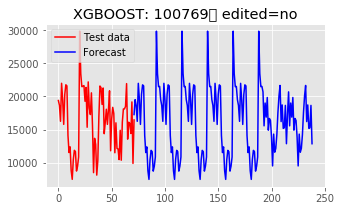


Forecasting from Cold Start Data:  29%|██▉       | 181/625 [02:25<05:02,  1.47it/s]

100351 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 8 / 4 / 2015
work day avg= 15753.120947687088 	 off day avg= 18460.930700368117
[100351 'x-large' 'low' False False False False False True True]


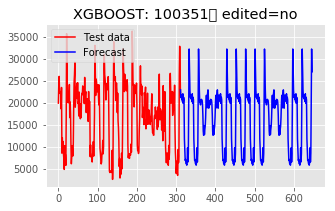


Forecasting from Cold Start Data:  29%|██▉       | 182/625 [02:27<06:28,  1.14it/s]

101335 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 27 / 5 / 2015
work day avg= 16591.150283003743 	 off day avg= 18588.9097613862
[101335 'x-large' 'low' False False False False False True True]


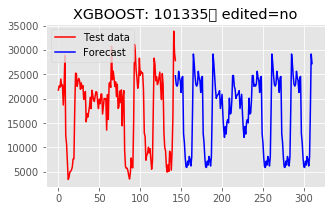


Forecasting from Cold Start Data:  29%|██▉       | 183/625 [02:27<06:17,  1.17it/s]

103392 <class 'numpy.ndarray'>
Last day observed: Friday 	 24 / 7 / 2015
work day avg= 26241.184796979393 	 off day avg= 34577.0846229551
[103392 'x-large' 'low' False False False False False True True]


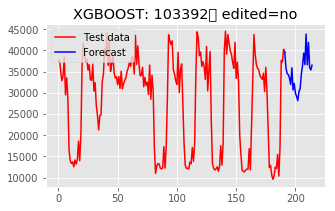


Forecasting from Cold Start Data:  29%|██▉       | 184/625 [02:28<06:19,  1.16it/s]

103601 <class 'numpy.ndarray'>
Last day observed: Saturday 	 13 / 8 / 2016
work day avg= 21501.405988303013 	 off day avg= 24860.61208257762
[103601 'x-large' 'low' False False False False False True True]


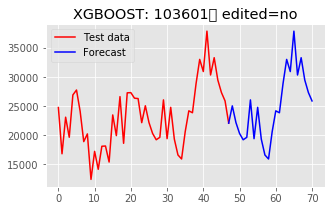


Forecasting from Cold Start Data:  30%|██▉       | 185/625 [02:29<05:32,  1.32it/s]

100501 <class 'numpy.ndarray'>
Last day observed: Sunday 	 18 / 1 / 2015
work day avg= 11795.596314293223 	 off day avg= 14129.107836682282
[100501 'x-large' 'low' False False False False False True True]


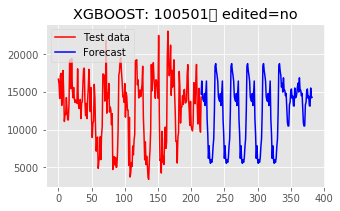


Forecasting from Cold Start Data:  30%|██▉       | 186/625 [02:30<06:07,  1.19it/s]

103312 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 5 / 8 / 2014
work day avg= 81643.85405587059 	 off day avg= 63135.08297610958
[103312 'x-large' 'low' False False False False False True True]


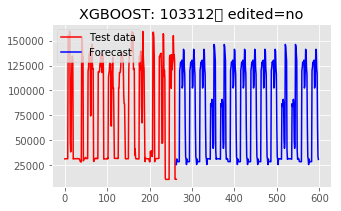


Forecasting from Cold Start Data:  30%|██▉       | 187/625 [02:31<06:53,  1.06it/s]

102198 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 19 / 11 / 2014
work day avg= 49177.01345115481 	 off day avg= 30960.952068430837
[102198 'x-large' 'low' False False False False False True True]


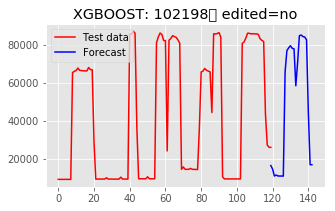


Forecasting from Cold Start Data:  30%|███       | 188/625 [02:32<06:18,  1.16it/s]

101266 <class 'numpy.ndarray'>
Last day observed: Thursday 	 26 / 11 / 2015
work day avg= 30983.053592186374 	 off day avg= 17024.35747972522
[101266 'x-large' 'low' False False False False False True True]


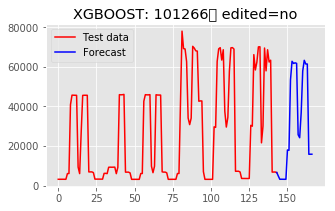


Forecasting from Cold Start Data:  30%|███       | 189/625 [02:32<06:01,  1.20it/s]

100094 <class 'numpy.ndarray'>
Last day observed: Saturday 	 9 / 7 / 2016
work day avg= 33621.06360017048 	 off day avg= 33696.665092364885
[100094 'x-large' 'low' False False False False False True True]


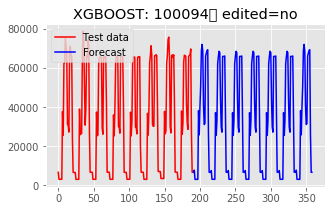


Forecasting from Cold Start Data:  30%|███       | 190/625 [02:33<06:09,  1.18it/s]

100335 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 2 / 9 / 2015
work day avg= 199481.11324565575 	 off day avg= 56441.10384926704
[100335 'x-large' 'low' False False False False False True True]


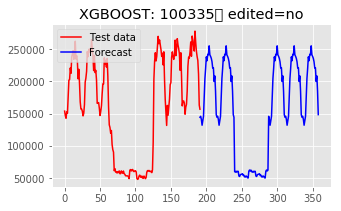


Forecasting from Cold Start Data:  31%|███       | 191/625 [02:34<06:23,  1.13it/s]

103132 <class 'numpy.ndarray'>
Last day observed: Sunday 	 7 / 8 / 2016
work day avg= 113019.32582760444 	 off day avg= 40611.010101042724
[103132 'x-large' 'low' False False False False False True True]


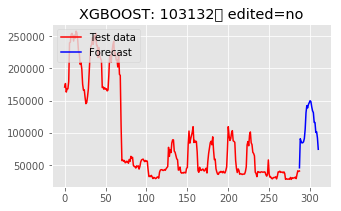


Forecasting from Cold Start Data:  31%|███       | 192/625 [02:35<06:43,  1.07it/s]

102244 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 5 / 1 / 2016
work day avg= 43351.68995967088 	 off day avg= 48713.210830620075
[102244 'x-large' 'low' False False False False False True True]


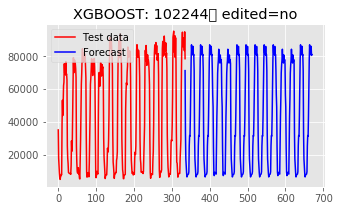


Forecasting from Cold Start Data:  31%|███       | 193/625 [02:36<06:58,  1.03it/s]

103302 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 2 / 2016
work day avg= 36168.62623757784 	 off day avg= 44784.80026622858
[103302 'x-large' 'low' False False False False False True True]


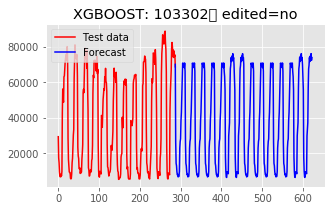


Forecasting from Cold Start Data:  31%|███       | 194/625 [02:38<07:27,  1.04s/it]

102001 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 8 / 6 / 2016
work day avg= 30737.135227544157 	 off day avg= nan
[102001 'x-large' 'low' False False False False False True True]


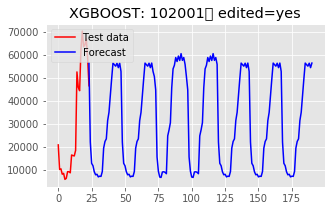


Forecasting from Cold Start Data:  31%|███       | 195/625 [02:38<05:43,  1.25it/s]

103423 <class 'numpy.ndarray'>
Last day observed: Thursday 	 29 / 9 / 2016
work day avg= 23988.633240046056 	 off day avg= nan
[103423 'x-large' 'low' False False False False False True True]


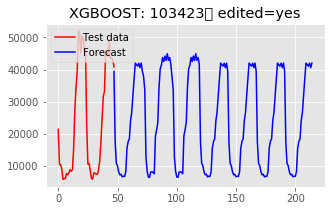


Forecasting from Cold Start Data:  31%|███▏      | 196/625 [02:38<04:28,  1.60it/s]

102984 <class 'numpy.ndarray'>
Last day observed: Monday 	 11 / 5 / 2015
work day avg= 5091.579248234072 	 off day avg= 5782.662057439079
[102984 'x-large' 'low' False False False False False True True]


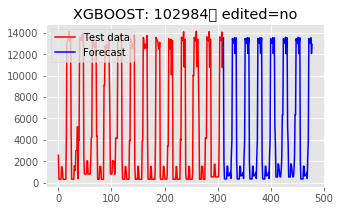


Forecasting from Cold Start Data:  32%|███▏      | 197/625 [02:39<06:00,  1.19it/s]

102806 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 9 / 12 / 2015
work day avg= 2594.0383026283234 	 off day avg= nan
[102806 'x-large' 'low' False False False False False True True]


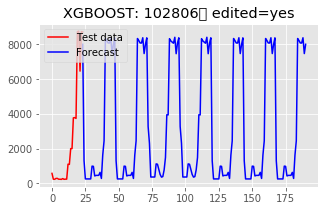


Forecasting from Cold Start Data:  32%|███▏      | 198/625 [02:40<04:42,  1.51it/s]

100758 <class 'numpy.ndarray'>
Last day observed: Sunday 	 10 / 4 / 2016
work day avg= 2922.5484414589323 	 off day avg= 3630.9830237534866
[100758 'x-large' 'low' False False False False False True True]


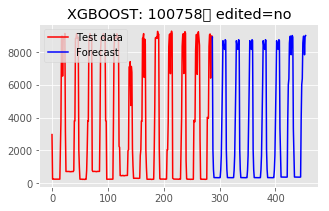


Forecasting from Cold Start Data:  32%|███▏      | 199/625 [02:41<05:49,  1.22it/s]

100799 <class 'numpy.ndarray'>
Last day observed: Friday 	 21 / 8 / 2015
work day avg= 52472.48289112011 	 off day avg= 59112.14081689552
[100799 'x-large' 'low' False False False False False True True]


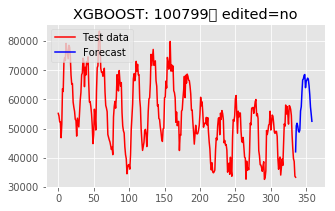


Forecasting from Cold Start Data:  32%|███▏      | 200/625 [02:42<06:56,  1.02it/s]

102857 <class 'numpy.ndarray'>
Last day observed: Saturday 	 10 / 10 / 2015
work day avg= 8412.075041421534 	 off day avg= 8097.6784448723065
[102857 'x-large' 'low' False False False False False True True]


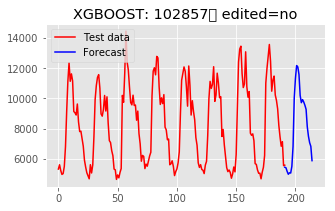


Forecasting from Cold Start Data:  32%|███▏      | 201/625 [02:43<06:44,  1.05it/s]

102992 <class 'numpy.ndarray'>
Last day observed: Saturday 	 5 / 12 / 2015
work day avg= 10334.030750287056 	 off day avg= 10045.918450460562
[102992 'x-large' 'low' False False False False False True True]


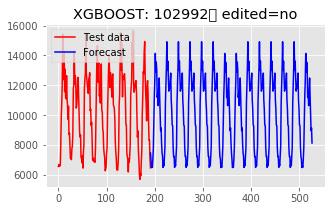


Forecasting from Cold Start Data:  32%|███▏      | 202/625 [02:44<06:46,  1.04it/s]

101084 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 13 / 1 / 2015
work day avg= 58662.05791433338 	 off day avg= 81850.82658292937
[101084 'x-large' 'low' False False False False False True True]


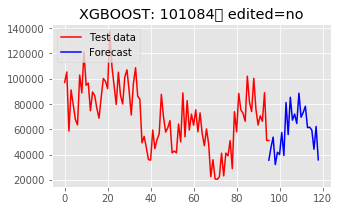


Forecasting from Cold Start Data:  32%|███▏      | 203/625 [02:45<06:04,  1.16it/s]

100486 <class 'numpy.ndarray'>
Last day observed: Monday 	 16 / 3 / 2015
work day avg= 70082.71500631115 	 off day avg= 49794.33219370375
[100486 'x-large' 'low' False False False False False True True]


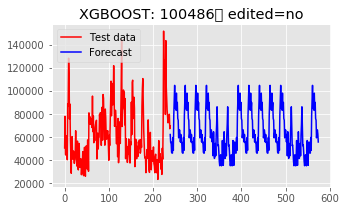


Forecasting from Cold Start Data:  33%|███▎      | 204/625 [02:46<06:18,  1.11it/s]

100820 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 13 / 5 / 2015
work day avg= 87284.87392727518 	 off day avg= 64138.52286489127
[100820 'x-large' 'low' False False False False False True True]


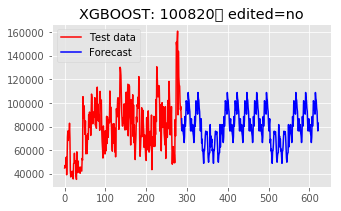


Forecasting from Cold Start Data:  33%|███▎      | 205/625 [02:47<06:44,  1.04it/s]

103299 <class 'numpy.ndarray'>
Last day observed: Friday 	 10 / 7 / 2015
work day avg= 100172.91769423785 	 off day avg= 86352.93943129863
[103299 'x-large' 'low' False False False False False True True]


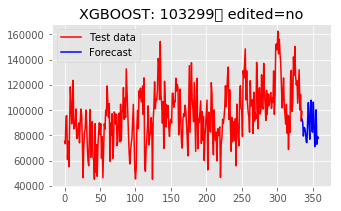


Forecasting from Cold Start Data:  33%|███▎      | 206/625 [02:48<06:45,  1.03it/s]

101582 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 1 / 10 / 2014
work day avg= 1606757.4521219279 	 off day avg= 635555.8643563068
[101582 'x-large' 'low' False False False False False True True]


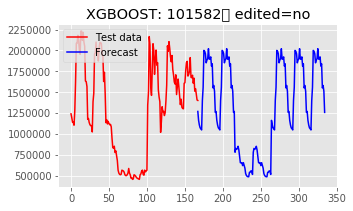


Forecasting from Cold Start Data:  33%|███▎      | 207/625 [02:49<06:37,  1.05it/s]

103040 <class 'numpy.ndarray'>
Last day observed: Friday 	 21 / 11 / 2014
work day avg= 1791608.255881192 	 off day avg= nan
[103040 'x-large' 'low' False False False False False True True]


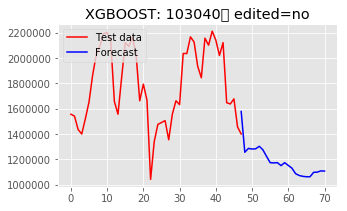


Forecasting from Cold Start Data:  33%|███▎      | 208/625 [02:49<05:04,  1.37it/s]

102354 <class 'numpy.ndarray'>
Last day observed: Thursday 	 10 / 1 / 2013
work day avg= 407856.45811837615 	 off day avg= 232306.19471057886
[102354 'x-large' 'low' False False False False False True True]


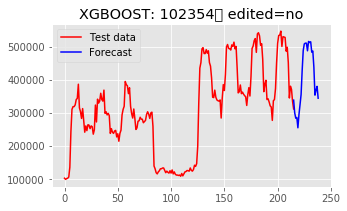


Forecasting from Cold Start Data:  33%|███▎      | 209/625 [02:50<05:45,  1.20it/s]

102349 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 5 / 3 / 2013
work day avg= 403508.184744375 	 off day avg= 159309.81402406338
[102349 'x-large' 'low' False False False False False True True]


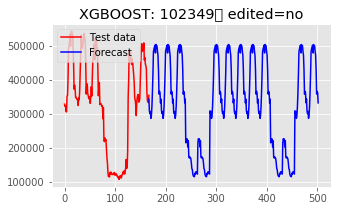


Forecasting from Cold Start Data:  34%|███▎      | 210/625 [02:51<05:54,  1.17it/s]

101441 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 5 / 2013
work day avg= 356348.79486256547 	 off day avg= 147385.24908121998
[101441 'x-large' 'low' False False False False False True True]


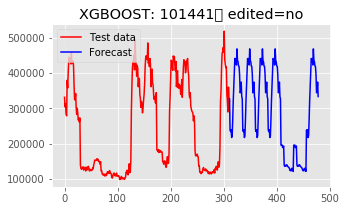


Forecasting from Cold Start Data:  34%|███▍      | 211/625 [02:52<07:03,  1.02s/it]

103539 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 6 / 2013
work day avg= 453753.97989450506 	 off day avg= 149330.7128079921
[103539 'x-large' 'low' False False False False False True True]


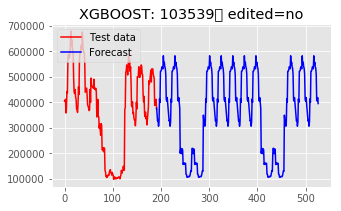


Forecasting from Cold Start Data:  34%|███▍      | 212/625 [02:53<07:07,  1.03s/it]

101750 <class 'numpy.ndarray'>
Last day observed: Thursday 	 22 / 8 / 2013
work day avg= 343410.1647341546 	 off day avg= 131526.65024587486
[101750 'x-large' 'low' False False False False False True True]


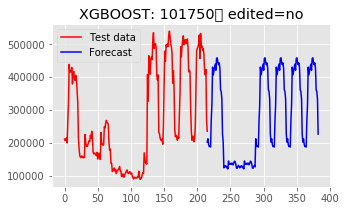


Forecasting from Cold Start Data:  34%|███▍      | 213/625 [02:54<07:09,  1.04s/it]

100074 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 15 / 10 / 2013
work day avg= 415335.8193034565 	 off day avg= 170786.6078770409
[100074 'x-large' 'low' False False False False False True True]


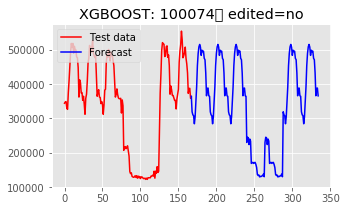


Forecasting from Cold Start Data:  34%|███▍      | 214/625 [02:55<06:57,  1.02s/it]

101420 <class 'numpy.ndarray'>
Last day observed: Sunday 	 8 / 12 / 2013
work day avg= 442754.3514672822 	 off day avg= 222072.23750988487
[101420 'x-large' 'low' False False False False False True True]


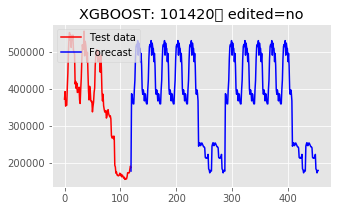


Forecasting from Cold Start Data:  34%|███▍      | 215/625 [02:56<06:38,  1.03it/s]

100777 <class 'numpy.ndarray'>
Last day observed: Saturday 	 1 / 2 / 2014
work day avg= 421455.67275238386 	 off day avg= 197827.82079090574
[100777 'x-large' 'low' False False False False False True True]


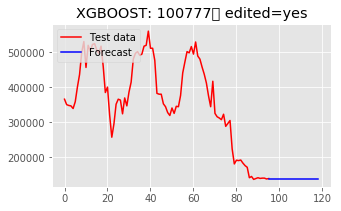


Forecasting from Cold Start Data:  35%|███▍      | 216/625 [02:57<05:59,  1.14it/s]

103024 <class 'numpy.ndarray'>
Last day observed: Thursday 	 27 / 3 / 2014
work day avg= 413338.3441512512 	 off day avg= nan
[103024 'x-large' 'low' False False False False False True True]


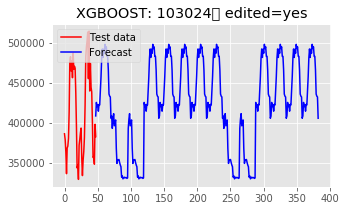


Forecasting from Cold Start Data:  35%|███▍      | 217/625 [02:57<04:45,  1.43it/s]

103208 <class 'numpy.ndarray'>
Last day observed: Thursday 	 22 / 5 / 2014
work day avg= 418882.2892712908 	 off day avg= nan
[103208 'x-large' 'low' False False False False False True True]


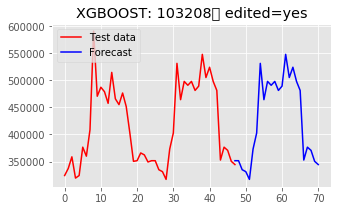


Forecasting from Cold Start Data:  35%|███▍      | 218/625 [02:57<03:45,  1.80it/s]

102645 <class 'numpy.ndarray'>
Last day observed: Sunday 	 27 / 7 / 2014
work day avg= 472315.16332003084 	 off day avg= 172147.77052218496
[102645 'x-large' 'low' False False False False False True True]


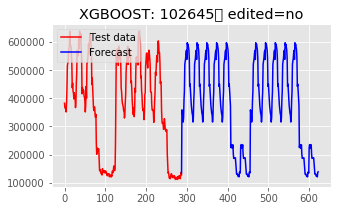


Forecasting from Cold Start Data:  35%|███▌      | 219/625 [02:59<05:26,  1.24it/s]

101497 <class 'numpy.ndarray'>
Last day observed: Sunday 	 2 / 8 / 2015
work day avg= 204935.5536187406 	 off day avg= 122160.99495029444
[101497 'x-large' 'low' False False False False False True True]


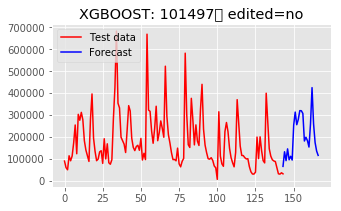


Forecasting from Cold Start Data:  35%|███▌      | 220/625 [03:00<05:22,  1.26it/s]

101618 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 31 / 8 / 2016
work day avg= 140829.3374241073 	 off day avg= 103266.87511821355
[101618 'x-large' 'low' False False False False False True True]


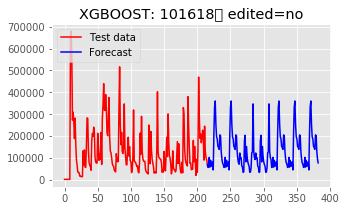


Forecasting from Cold Start Data:  35%|███▌      | 221/625 [03:00<05:40,  1.18it/s]

102538 <class 'numpy.ndarray'>
Last day observed: Sunday 	 26 / 4 / 2015
work day avg= nan 	 off day avg= 11450.975339936072
[102538 'x-large' 'low' False False False False False True True]


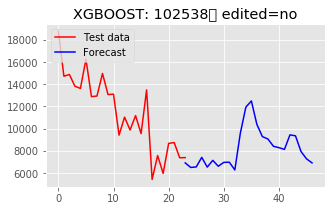


Forecasting from Cold Start Data:  36%|███▌      | 222/625 [03:01<04:24,  1.53it/s]

102042 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 8 / 2015
work day avg= 16351.972601042131 	 off day avg= 20130.133006730855
[102042 'x-large' 'low' False False False False False True True]


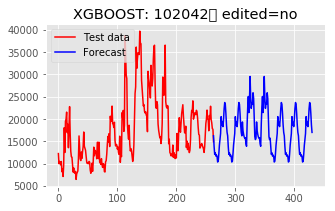


Forecasting from Cold Start Data:  36%|███▌      | 223/625 [03:02<05:08,  1.30it/s]

100696 <class 'numpy.ndarray'>
Last day observed: Friday 	 16 / 10 / 2015
work day avg= 11458.097728576706 	 off day avg= 17556.30231024251
[100696 'x-large' 'low' False False False False False True True]


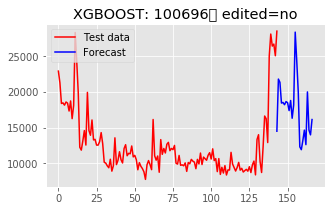


Forecasting from Cold Start Data:  36%|███▌      | 224/625 [03:03<05:16,  1.27it/s]

100638 <class 'numpy.ndarray'>
Last day observed: Sunday 	 6 / 12 / 2015
work day avg= nan 	 off day avg= 5690.068571222655
[100638 'x-large' 'low' False False False False False True True]


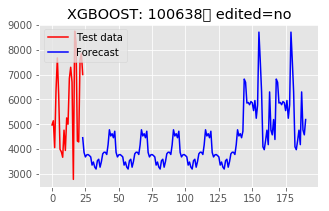


Forecasting from Cold Start Data:  36%|███▌      | 225/625 [03:03<04:07,  1.62it/s]

101850 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 13 / 9 / 2016
work day avg= 2948.4631964667155 	 off day avg= 5131.462458523262
[101850 'x-large' 'low' False False False False False True True]


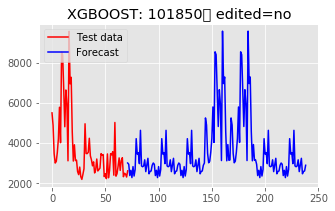


Forecasting from Cold Start Data:  36%|███▌      | 226/625 [03:03<03:59,  1.67it/s]

102904 <class 'numpy.ndarray'>
Last day observed: Friday 	 18 / 11 / 2016
work day avg= 3124.993013117472 	 off day avg= 3633.2324388774255
[102904 'x-large' 'low' False False False False False True True]


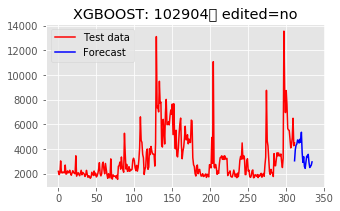


Forecasting from Cold Start Data:  36%|███▋      | 227/625 [03:04<04:28,  1.48it/s]

103345 <class 'numpy.ndarray'>
Last day observed: Saturday 	 14 / 1 / 2017
work day avg= 2939.892331676545 	 off day avg= 4291.406287844235
[103345 'x-large' 'low' False False False False False True True]


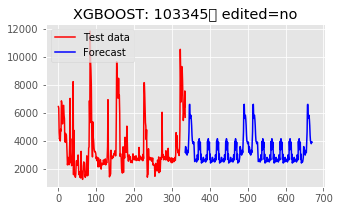


Forecasting from Cold Start Data:  36%|███▋      | 228/625 [03:05<04:57,  1.34it/s]

101182 <class 'numpy.ndarray'>
Last day observed: Friday 	 19 / 6 / 2015
work day avg= 11431.086197617662 	 off day avg= 10075.866819040772
[101182 'x-large' 'low' False False False False False True True]


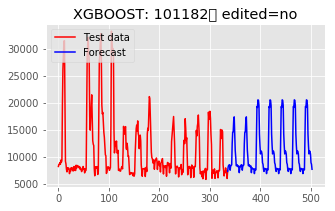


Forecasting from Cold Start Data:  37%|███▋      | 229/625 [03:06<05:25,  1.22it/s]

102581 <class 'numpy.ndarray'>
Last day observed: Thursday 	 1 / 9 / 2016
work day avg= 6068.92772038768 	 off day avg= 5040.521187596722
[102581 'x-large' 'low' False False False False False True True]


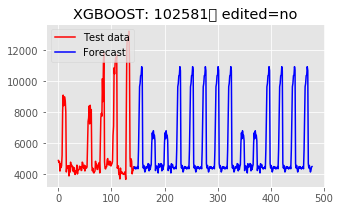


Forecasting from Cold Start Data:  37%|███▋      | 230/625 [03:07<04:37,  1.42it/s]

100004 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 7 / 2015
work day avg= 345054.52818971826 	 off day avg= nan
[100004 'x-large' 'low' False False False False False True True]


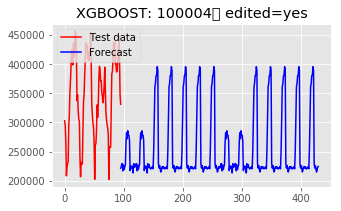


Forecasting from Cold Start Data:  37%|███▋      | 231/625 [03:07<03:48,  1.72it/s]

102280 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 30 / 12 / 2015
work day avg= 25860.3805689153 	 off day avg= 15460.142358594956
[102280 'x-small' 'low' False False False False False True True]


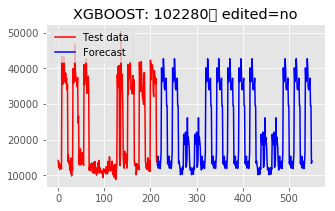


Forecasting from Cold Start Data:  37%|███▋      | 232/625 [03:08<05:24,  1.21it/s]

102274 <class 'numpy.ndarray'>
Last day observed: Monday 	 8 / 8 / 2016
work day avg= 37267.743229608 	 off day avg= 30642.973579104844
[102274 'x-small' 'low' False False False False False True True]


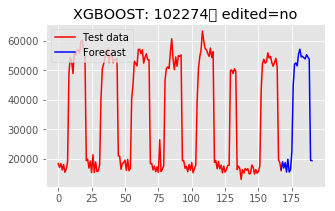


Forecasting from Cold Start Data:  37%|███▋      | 233/625 [03:09<05:45,  1.13it/s]

100373 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 28 / 9 / 2016
work day avg= 23362.303124855116 	 off day avg= nan
[100373 'x-small' 'low' False False False False False True True]


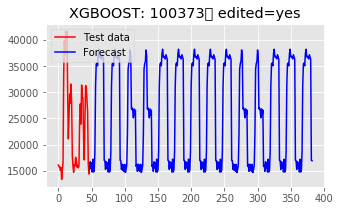


Forecasting from Cold Start Data:  37%|███▋      | 234/625 [03:10<04:31,  1.44it/s]

103220 <class 'numpy.ndarray'>
Last day observed: Friday 	 5 / 2 / 2016
work day avg= 203583.75077472095 	 off day avg= 200654.62451096534
[103220 'small' 'low' False False False False False True True]


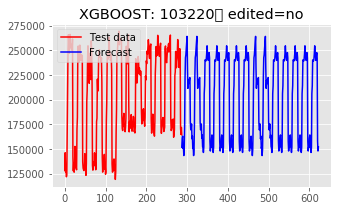


Forecasting from Cold Start Data:  38%|███▊      | 235/625 [03:11<05:54,  1.10it/s]

102577 <class 'numpy.ndarray'>
Last day observed: Sunday 	 8 / 1 / 2017
work day avg= 93812.3541726615 	 off day avg= 6760.691813692889
[102577 'medium' 'low' False False False False False True True]


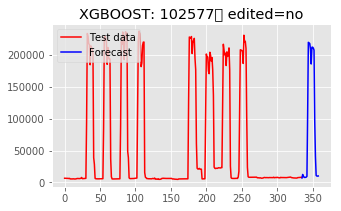


Forecasting from Cold Start Data:  38%|███▊      | 236/625 [03:12<05:45,  1.13it/s]

100243 <class 'numpy.ndarray'>
Last day observed: Monday 	 13 / 6 / 2016
work day avg= 97265.38177111892 	 off day avg= 37676.10264235541
[100243 'x-large' 'low' False False False False False True True]


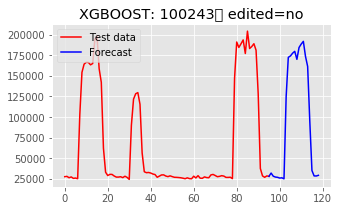


Forecasting from Cold Start Data:  38%|███▊      | 237/625 [03:13<05:43,  1.13it/s]

100447 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 17 / 8 / 2016
work day avg= 150027.81859260847 	 off day avg= 54445.77293570475
[100447 'x-large' 'low' False False False False False True True]


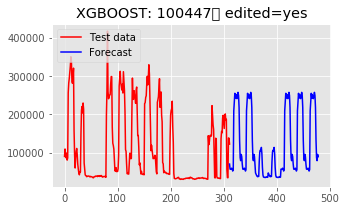


Forecasting from Cold Start Data:  38%|███▊      | 238/625 [03:14<06:51,  1.06s/it]

100497 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 5 / 10 / 2016
work day avg= 141793.67549445547 	 off day avg= 43547.94387326556
[100497 'x-large' 'low' False False False False False True True]


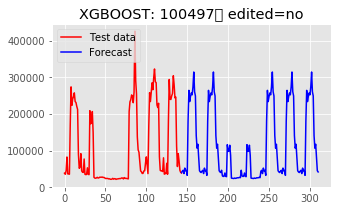


Forecasting from Cold Start Data:  38%|███▊      | 239/625 [03:15<06:09,  1.04it/s]

101045 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 12 / 2016
work day avg= 255194.9145928286 	 off day avg= 92273.15285118869
[101045 'x-large' 'low' False False False False False True True]


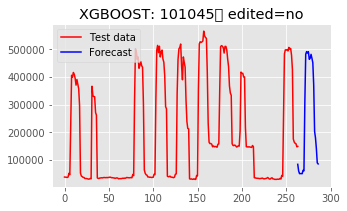


Forecasting from Cold Start Data:  38%|███▊      | 240/625 [03:16<06:35,  1.03s/it]

100202 <class 'numpy.ndarray'>
Last day observed: Sunday 	 22 / 1 / 2017
work day avg= 323949.5688217822 	 off day avg= 91073.31089570909
[100202 'x-large' 'low' False False False False False True True]


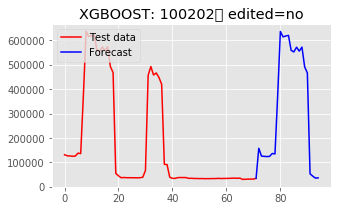


Forecasting from Cold Start Data:  39%|███▊      | 241/625 [03:16<05:29,  1.16it/s]

103525 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 8 / 1 / 2014
work day avg= 50551.50091087853 	 off day avg= 43777.81289361236
[103525 'x-small' 'low' False False False False False True True]


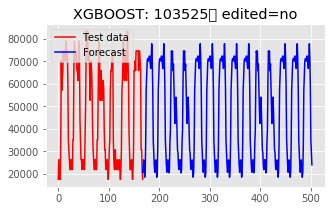


Forecasting from Cold Start Data:  39%|███▊      | 242/625 [03:17<05:39,  1.13it/s]

100393 <class 'numpy.ndarray'>
Last day observed: Sunday 	 9 / 3 / 2014
work day avg= 46761.27997537454 	 off day avg= 41875.091540447705
[100393 'x-small' 'low' False False False False False True True]


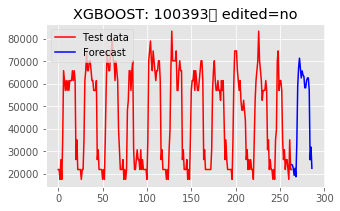


Forecasting from Cold Start Data:  39%|███▉      | 243/625 [03:19<06:18,  1.01it/s]

103615 <class 'numpy.ndarray'>
Last day observed: Saturday 	 3 / 5 / 2014
work day avg= 44691.11914313139 	 off day avg= 41646.76497806795
[103615 'x-small' 'low' False False False False False True True]


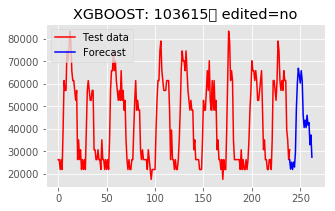


Forecasting from Cold Start Data:  39%|███▉      | 244/625 [03:20<06:38,  1.05s/it]

101745 <class 'numpy.ndarray'>
Last day observed: Saturday 	 21 / 6 / 2014
work day avg= 52332.44809744065 	 off day avg= 53885.06872162301
[101745 'x-small' 'low' False False False False False True True]


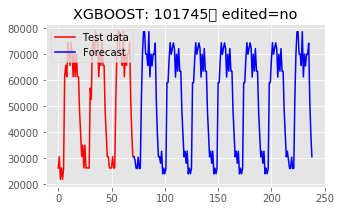


Forecasting from Cold Start Data:  39%|███▉      | 245/625 [03:20<05:47,  1.09it/s]

100028 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 21 / 10 / 2014
work day avg= 50434.80066788443 	 off day avg= 45573.98185099979
[100028 'x-small' 'low' False False False False False True True]


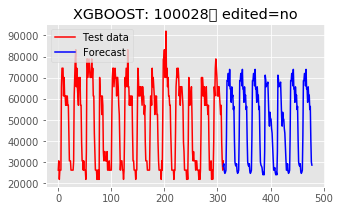


Forecasting from Cold Start Data:  39%|███▉      | 246/625 [03:22<06:43,  1.06s/it]

100110 <class 'numpy.ndarray'>
Last day observed: Thursday 	 4 / 12 / 2014
work day avg= 43656.03872700982 	 off day avg= nan
[100110 'x-small' 'low' False False False False False True True]


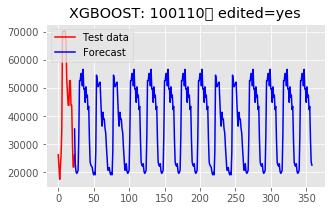


Forecasting from Cold Start Data:  40%|███▉      | 247/625 [03:22<05:17,  1.19it/s]

102218 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 4 / 2 / 2015
work day avg= 49647.32772385469 	 off day avg= 43290.71622720221
[102218 'x-small' 'low' False False False False False True True]


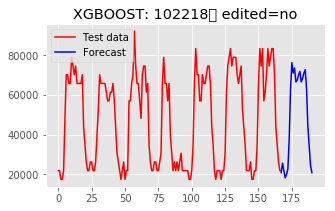


Forecasting from Cold Start Data:  40%|███▉      | 248/625 [03:23<05:22,  1.17it/s]

102901 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 26 / 5 / 2015
work day avg= 42742.73247749079 	 off day avg= 40185.4749788375
[102901 'x-small' 'low' False False False False False True True]


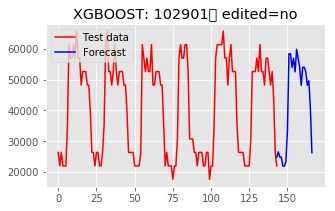


Forecasting from Cold Start Data:  40%|███▉      | 249/625 [03:24<05:16,  1.19it/s]

103274 <class 'numpy.ndarray'>
Last day observed: Saturday 	 19 / 9 / 2015
work day avg= 50675.4496161704 	 off day avg= 45543.53830934916
[103274 'x-small' 'low' False False False False False True True]


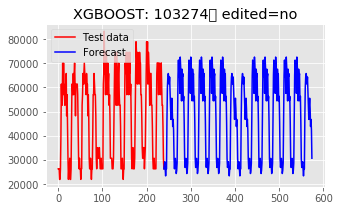


Forecasting from Cold Start Data:  40%|████      | 250/625 [03:25<06:00,  1.04it/s]

100798 <class 'numpy.ndarray'>
Last day observed: Monday 	 9 / 11 / 2015
work day avg= 43899.5870602149 	 off day avg= 39089.50747941466
[100798 'x-small' 'low' False False False False False True True]


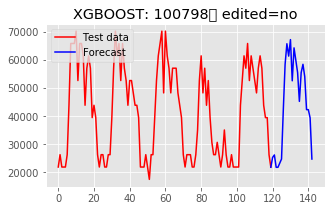


Forecasting from Cold Start Data:  40%|████      | 251/625 [03:26<05:36,  1.11it/s]

103315 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 5 / 1 / 2016
work day avg= 49428.13422397012 	 off day avg= 22467.333738168236
[103315 'x-small' 'low' False False False False False True True]


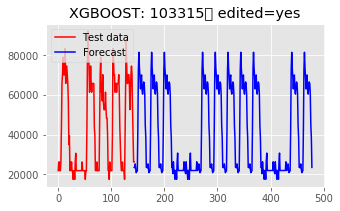


Forecasting from Cold Start Data:  40%|████      | 252/625 [03:27<05:32,  1.12it/s]

101483 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 31 / 1 / 2017
work day avg= 56213.999657896544 	 off day avg= 49044.545599172125
[101483 'x-small' 'low' False False False False False True True]


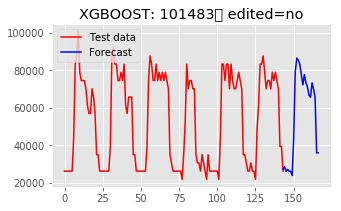


Forecasting from Cold Start Data:  40%|████      | 253/625 [03:28<05:21,  1.16it/s]

102693 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 21 / 1 / 2015
work day avg= 7568.536578794482 	 off day avg= 5491.864205164146
[102693 'medium' 'low' False False False False False True True]


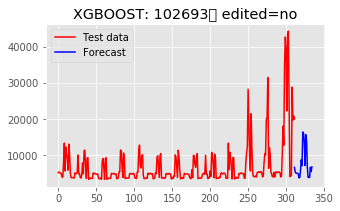


Forecasting from Cold Start Data:  41%|████      | 254/625 [03:28<04:35,  1.35it/s]

102180 <class 'numpy.ndarray'>
Last day observed: Saturday 	 22 / 8 / 2015
work day avg= 99679.29711081229 	 off day avg= 98410.07784945221
[102180 'medium' 'low' False False False False False True True]


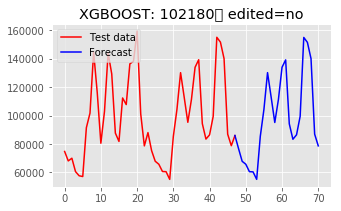


Forecasting from Cold Start Data:  41%|████      | 255/625 [03:29<04:14,  1.45it/s]

102925 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 21 / 10 / 2015
work day avg= 14175.417611115074 	 off day avg= 11157.76578723875
[102925 'medium' 'low' False False False False False True True]


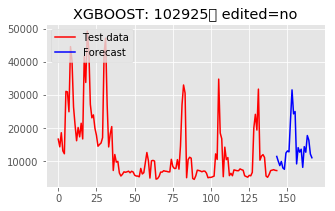


Forecasting from Cold Start Data:  41%|████      | 256/625 [03:29<04:07,  1.49it/s]

103475 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 4 / 2016
work day avg= 31387.9421130296 	 off day avg= 28594.959681235978
[103475 'medium' 'low' False False False False False True True]


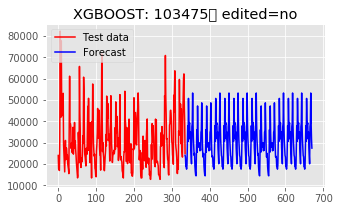


Forecasting from Cold Start Data:  41%|████      | 257/625 [03:31<05:35,  1.10it/s]

101340 <class 'numpy.ndarray'>
Last day observed: Saturday 	 28 / 5 / 2016
work day avg= 46578.19788033861 	 off day avg= 49256.97337115682
[101340 'medium' 'low' False False False False False True True]


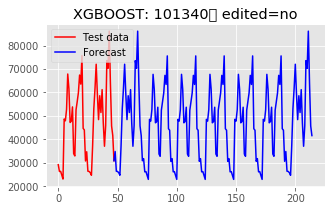


Forecasting from Cold Start Data:  41%|████▏     | 258/625 [03:31<04:49,  1.27it/s]

101071 <class 'numpy.ndarray'>
Last day observed: Friday 	 10 / 4 / 2015
work day avg= 486835.18938217516 	 off day avg= 257409.20525418964
[101071 'xx-large' 'high' False False False False False True True]


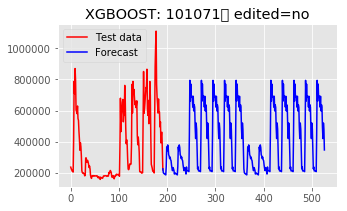


Forecasting from Cold Start Data:  41%|████▏     | 259/625 [03:32<05:13,  1.17it/s]

100987 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 4 / 8 / 2015
work day avg= 759715.8892581305 	 off day avg= 286791.3712114946
[100987 'xx-large' 'high' False False False False False True True]


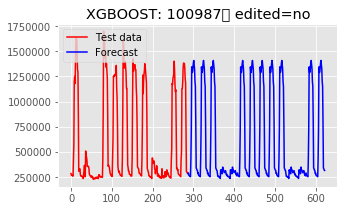


Forecasting from Cold Start Data:  42%|████▏     | 260/625 [03:34<06:03,  1.00it/s]

102459 <class 'numpy.ndarray'>
Last day observed: Sunday 	 6 / 3 / 2016
work day avg= 428939.69553951547 	 off day avg= 176370.32046043326
[102459 'xx-large' 'high' False False False False False True True]


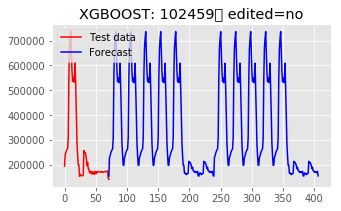


Forecasting from Cold Start Data:  42%|████▏     | 261/625 [03:34<05:12,  1.16it/s]

103292 <class 'numpy.ndarray'>
Last day observed: Friday 	 9 / 12 / 2016
work day avg= 347197.7883640875 	 off day avg= nan
[103292 'xx-large' 'high' False False False False False True True]


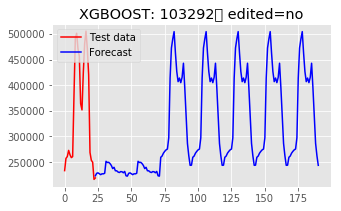


Forecasting from Cold Start Data:  42%|████▏     | 262/625 [03:34<04:06,  1.47it/s]

100062 <class 'numpy.ndarray'>
Last day observed: Saturday 	 8 / 4 / 2017
work day avg= 404007.6595369966 	 off day avg= 195921.5544808686
[100062 'xx-large' 'high' False False False False False True True]


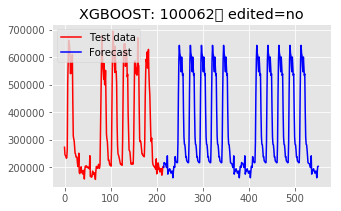


Forecasting from Cold Start Data:  42%|████▏     | 263/625 [03:35<04:51,  1.24it/s]

101407 <class 'numpy.ndarray'>
Last day observed: Saturday 	 22 / 7 / 2017
work day avg= 598993.9162771372 	 off day avg= 251074.774797225
[101407 'xx-large' 'high' False False False False False True True]


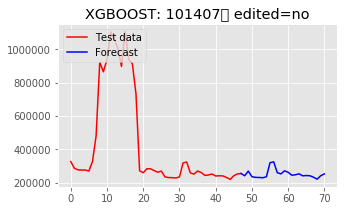


Forecasting from Cold Start Data:  42%|████▏     | 264/625 [03:36<04:06,  1.46it/s]

103062 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 11 / 2017
work day avg= 495133.64038859744 	 off day avg= 258354.39987016472
[103062 'xx-large' 'high' False False False False False True True]


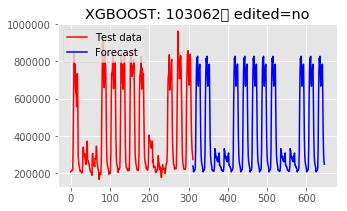


Forecasting from Cold Start Data:  42%|████▏     | 265/625 [03:37<05:35,  1.07it/s]

100679 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 3 / 12 / 2014
work day avg= 1504.5492587886079 	 off day avg= 515.5512899120416
[100679 'x-large' 'high' False False False False False True True]


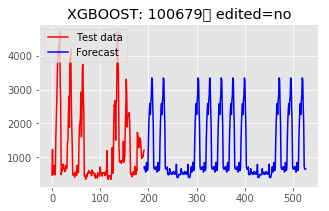


Forecasting from Cold Start Data:  43%|████▎     | 266/625 [03:38<05:13,  1.14it/s]

100164 <class 'numpy.ndarray'>
Last day observed: Sunday 	 25 / 1 / 2015
work day avg= 2011.3950227790951 	 off day avg= 961.0398375515748
[100164 'x-large' 'high' False False False False False True True]


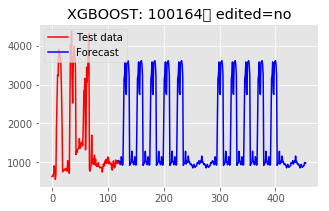


Forecasting from Cold Start Data:  43%|████▎     | 267/625 [03:39<04:38,  1.29it/s]

101998 <class 'numpy.ndarray'>
Last day observed: Sunday 	 22 / 3 / 2015
work day avg= 695.2701760041268 	 off day avg= 591.3898138055811
[101998 'x-large' 'high' False False False False False True True]


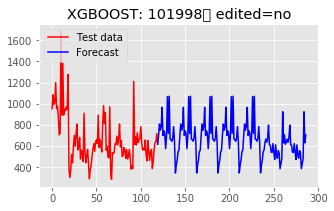


Forecasting from Cold Start Data:  43%|████▎     | 268/625 [03:39<04:12,  1.41it/s]

102254 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 14 / 7 / 2015
work day avg= 4489.414605651497 	 off day avg= 3852.195220287734
[102254 'x-large' 'high' False False False False False True True]


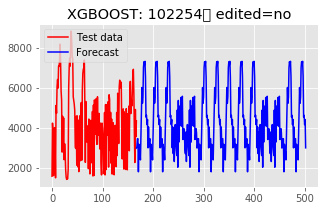


Forecasting from Cold Start Data:  43%|████▎     | 269/625 [03:40<04:32,  1.30it/s]

101973 <class 'numpy.ndarray'>
Last day observed: Sunday 	 13 / 9 / 2015
work day avg= 2331.563757963755 	 off day avg= 1786.5371477139513
[101973 'x-large' 'high' False False False False False True True]


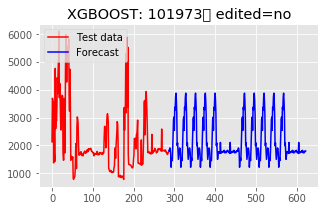


Forecasting from Cold Start Data:  43%|████▎     | 270/625 [03:41<04:48,  1.23it/s]

101781 <class 'numpy.ndarray'>
Last day observed: Thursday 	 5 / 11 / 2015
work day avg= 1309.3445813937578 	 off day avg= 250.9953795748103
[101781 'x-large' 'high' False False False False False True True]


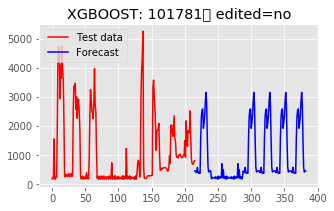


Forecasting from Cold Start Data:  43%|████▎     | 271/625 [03:42<04:30,  1.31it/s]

100402 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 10 / 10 / 2017
work day avg= 286485.44123052916 	 off day avg= 106050.29418968402
[100402 'x-large' 'low' False False False False False True True]


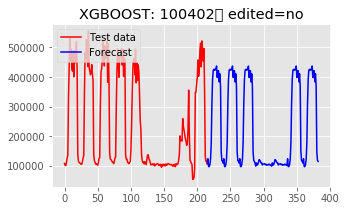


Forecasting from Cold Start Data:  44%|████▎     | 272/625 [03:43<05:03,  1.16it/s]

100256 <class 'numpy.ndarray'>
Last day observed: Sunday 	 7 / 2 / 2016
work day avg= 49379.01059964087 	 off day avg= 44010.312864495754
[100256 'x-large' 'low' False False False False False True True]


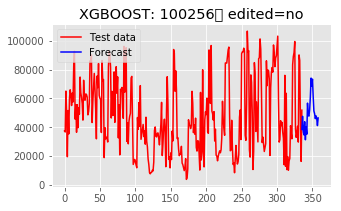


Forecasting from Cold Start Data:  44%|████▎     | 273/625 [03:43<04:37,  1.27it/s]

100466 <class 'numpy.ndarray'>
Last day observed: Thursday 	 26 / 5 / 2016
work day avg= 40279.03725387548 	 off day avg= 40276.05925711002
[100466 'x-large' 'low' False False False False False True True]


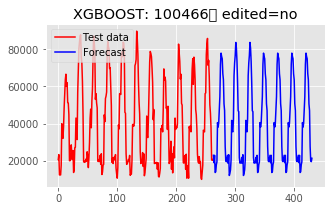


Forecasting from Cold Start Data:  44%|████▍     | 274/625 [03:45<05:29,  1.07it/s]

102662 <class 'numpy.ndarray'>
Last day observed: Sunday 	 24 / 7 / 2016
work day avg= 51028.648074159086 	 off day avg= 47482.264516779294
[102662 'x-large' 'low' False False False False False True True]


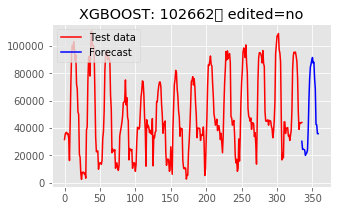


Forecasting from Cold Start Data:  44%|████▍     | 275/625 [03:46<06:20,  1.09s/it]

100556 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 13 / 9 / 2016
work day avg= 54994.03450131478 	 off day avg= 44945.298523516765
[100556 'x-large' 'low' False False False False False True True]


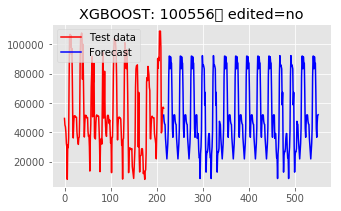


Forecasting from Cold Start Data:  44%|████▍     | 276/625 [03:47<05:16,  1.10it/s]

103135 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 2 / 11 / 2016
work day avg= 12037.760767215837 	 off day avg= nan
[103135 'x-large' 'low' False False False False False True True]


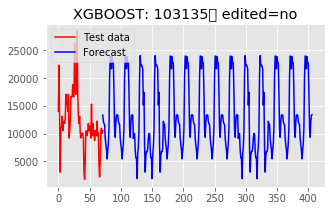


Forecasting from Cold Start Data:  44%|████▍     | 277/625 [03:47<04:10,  1.39it/s]

101042 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 9 / 2015
work day avg= 377974.73059038067 	 off day avg= 123417.580981458
[101042 'x-large' 'low' False False False False False True True]


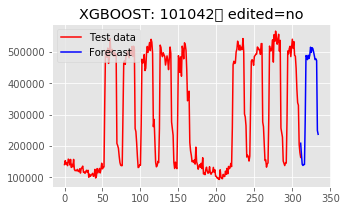


Forecasting from Cold Start Data:  44%|████▍     | 278/625 [03:48<05:24,  1.07it/s]

101063 <class 'numpy.ndarray'>
Last day observed: Monday 	 20 / 6 / 2016
work day avg= 447881.82599494606 	 off day avg= 183982.3182545801
[101063 'x-large' 'low' False False False False False True True]


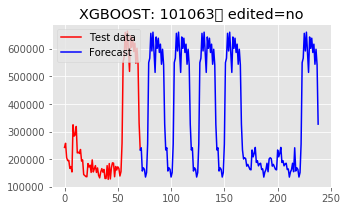


Forecasting from Cold Start Data:  45%|████▍     | 279/625 [03:49<04:47,  1.20it/s]

100749 <class 'numpy.ndarray'>
Last day observed: Monday 	 23 / 6 / 2014
work day avg= 309978.867669969 	 off day avg= 235335.2750637712
[100749 'xx-large' 'low' False False False False False True True]


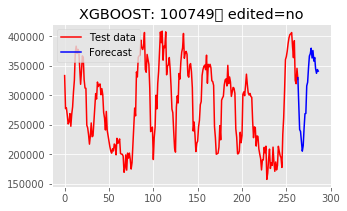


Forecasting from Cold Start Data:  45%|████▍     | 280/625 [03:50<05:29,  1.05it/s]

100050 <class 'numpy.ndarray'>
Last day observed: Sunday 	 17 / 8 / 2014
work day avg= 453423.1146644531 	 off day avg= 281009.9920444597
[100050 'xx-large' 'low' False False False False False True True]


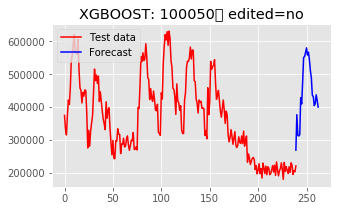


Forecasting from Cold Start Data:  45%|████▍     | 281/625 [03:51<05:45,  1.00s/it]

103056 <class 'numpy.ndarray'>
Last day observed: Thursday 	 11 / 12 / 2014
work day avg= 463656.66238948394 	 off day avg= 391524.47845439886
[103056 'xx-large' 'low' False False False False False True True]


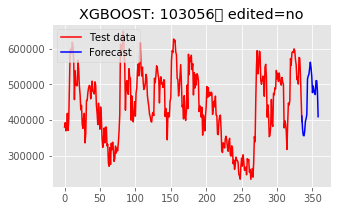


Forecasting from Cold Start Data:  45%|████▌     | 282/625 [03:53<06:30,  1.14s/it]

100350 <class 'numpy.ndarray'>
Last day observed: Monday 	 9 / 11 / 2015
work day avg= 399931.76595970156 	 off day avg= 271560.4864477219
[100350 'xx-large' 'low' False False False False False True True]


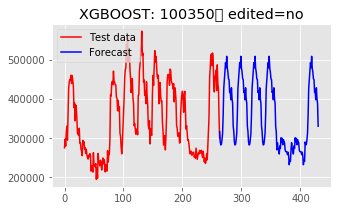


Forecasting from Cold Start Data:  45%|████▌     | 283/625 [03:54<06:38,  1.17s/it]

103357 <class 'numpy.ndarray'>
Last day observed: Friday 	 2 / 12 / 2016
work day avg= 417660.9416039358 	 off day avg= 302739.04867246153
[103357 'xx-large' 'low' False False False False False True True]


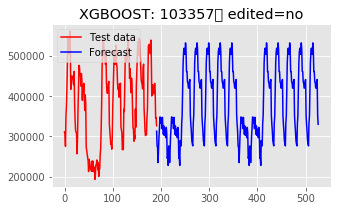


Forecasting from Cold Start Data:  45%|████▌     | 284/625 [03:55<06:22,  1.12s/it]

102772 <class 'numpy.ndarray'>
Last day observed: Sunday 	 13 / 12 / 2015
work day avg= 4624.402880582592 	 off day avg= 3188.626896367306
[102772 'x-large' 'low' False False False False False True True]


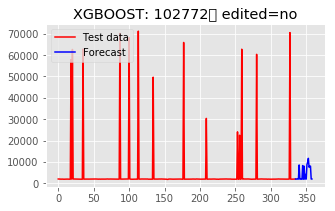


Forecasting from Cold Start Data:  46%|████▌     | 285/625 [03:55<05:15,  1.08it/s]

100401 <class 'numpy.ndarray'>
Last day observed: Sunday 	 7 / 2 / 2016
work day avg= 32034.75037930045 	 off day avg= 3493.0370685633784
[100401 'x-large' 'low' False False False False False True True]


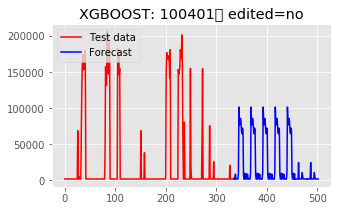


Forecasting from Cold Start Data:  46%|████▌     | 286/625 [03:56<04:52,  1.16it/s]

103499 <class 'numpy.ndarray'>
Last day observed: Friday 	 5 / 2 / 2016
work day avg= 1686283.2663478302 	 off day avg= 1684875.3798132471
[103499 'xx-large' 'low' True True True True True True True]


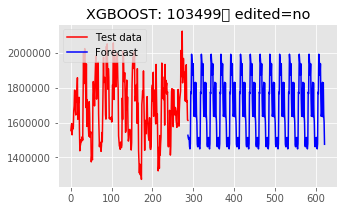


Forecasting from Cold Start Data:  46%|████▌     | 287/625 [03:57<05:41,  1.01s/it]

101729 <class 'numpy.ndarray'>
Last day observed: Monday 	 28 / 3 / 2016
work day avg= 1648247.9626724592 	 off day avg= 1741268.6817390725
[101729 'xx-large' 'low' True True True True True True True]


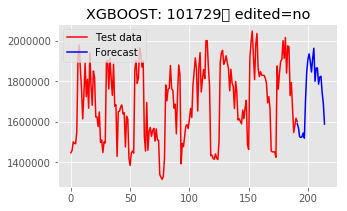


Forecasting from Cold Start Data:  46%|████▌     | 288/625 [03:58<05:34,  1.01it/s]

103492 <class 'numpy.ndarray'>
Last day observed: Saturday 	 28 / 5 / 2016
work day avg= 1659147.0365648782 	 off day avg= 1669959.5079998455
[103492 'xx-large' 'low' True True True True True True True]


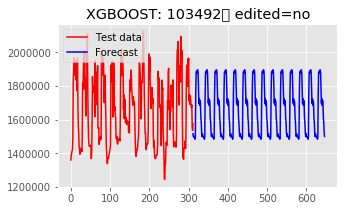


Forecasting from Cold Start Data:  46%|████▌     | 289/625 [04:00<06:15,  1.12s/it]

102556 <class 'numpy.ndarray'>
Last day observed: Monday 	 18 / 7 / 2016
work day avg= 1795038.8315189492 	 off day avg= 1768110.395387168
[102556 'xx-large' 'low' True True True True True True True]


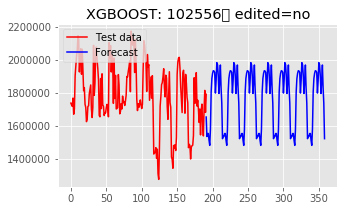


Forecasting from Cold Start Data:  46%|████▋     | 290/625 [04:01<05:54,  1.06s/it]

101402 <class 'numpy.ndarray'>
Last day observed: Monday 	 25 / 1 / 2016
work day avg= 6846.369862952513 	 off day avg= 11858.486671162065
[101402 'large' 'low' False False False False False True True]


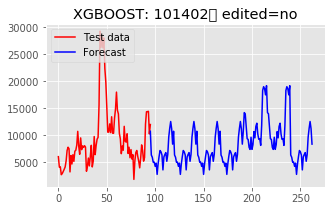


Forecasting from Cold Start Data:  47%|████▋     | 291/625 [04:01<05:19,  1.05it/s]

101052 <class 'numpy.ndarray'>
Last day observed: Friday 	 25 / 3 / 2016
work day avg= 6343.977825049135 	 off day avg= 5965.554425176833
[101052 'large' 'low' False False False False False True True]


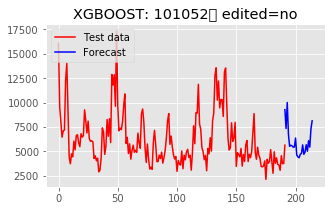


Forecasting from Cold Start Data:  47%|████▋     | 292/625 [04:02<05:09,  1.08it/s]

102055 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 18 / 5 / 2016
work day avg= 5114.554359746956 	 off day avg= 7212.860145591044
[102055 'large' 'low' False False False False False True True]


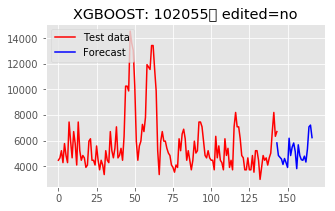


Forecasting from Cold Start Data:  47%|████▋     | 293/625 [04:03<04:33,  1.21it/s]

101446 <class 'numpy.ndarray'>
Last day observed: Saturday 	 16 / 7 / 2016
work day avg= 7625.477882219509 	 off day avg= 6935.1605579727475
[101446 'large' 'low' False False False False False True True]


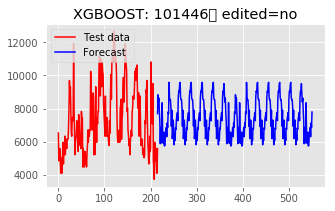


Forecasting from Cold Start Data:  47%|████▋     | 294/625 [04:04<04:53,  1.13it/s]

102647 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 10 / 2 / 2016
work day avg= 1604869.8604780564 	 off day avg= 1122409.4371544523
[102647 'xx-large' 'high' False False False False False True True]


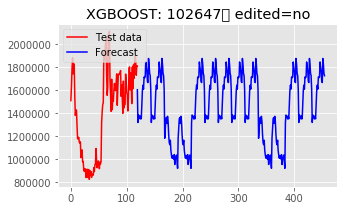


Forecasting from Cold Start Data:  47%|████▋     | 295/625 [04:05<04:37,  1.19it/s]

103556 <class 'numpy.ndarray'>
Last day observed: Saturday 	 20 / 9 / 2014
work day avg= nan 	 off day avg= 1831535.365905605
[103556 'xx-large' 'high' False False False False False True True]


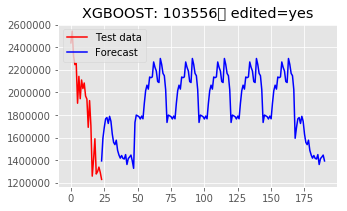


Forecasting from Cold Start Data:  47%|████▋     | 296/625 [04:05<03:39,  1.50it/s]

102658 <class 'numpy.ndarray'>
Last day observed: Friday 	 8 / 1 / 2016
work day avg= 77770.51222999764 	 off day avg= 60859.79708920392
[102658 'x-small' 'low' False False False False False True True]


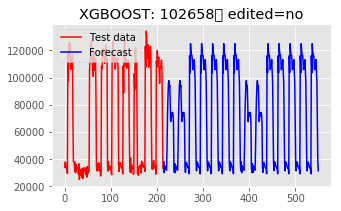


Forecasting from Cold Start Data:  48%|████▊     | 297/625 [04:06<04:15,  1.29it/s]

100738 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 6 / 2016
work day avg= 261.3307478198064 	 off day avg= 208.59168817847967
[100738 'x-small' 'low' False False False False False True True]


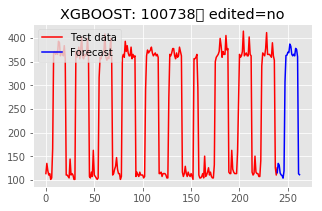


Forecasting from Cold Start Data:  48%|████▊     | 298/625 [04:07<04:39,  1.17it/s]

101205 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 28 / 3 / 2017
work day avg= 318.95867515281617 	 off day avg= nan
[101205 'x-small' 'low' False False False False False True True]


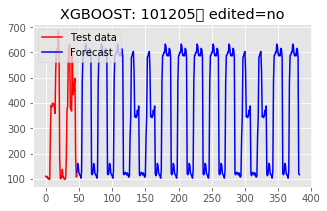


Forecasting from Cold Start Data:  48%|████▊     | 299/625 [04:07<03:41,  1.47it/s]

103042 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 18 / 10 / 2016
work day avg= 25587.799342142138 	 off day avg= 25435.77251729963
[103042 'small' 'low' False False False False False True True]


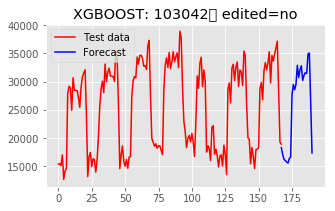


Forecasting from Cold Start Data:  48%|████▊     | 300/625 [04:08<03:54,  1.38it/s]

102890 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 3 / 2 / 2016
work day avg= 1562.2422647626559 	 off day avg= 688.0473122694739
[102890 'x-small' 'low' False False False False False True True]


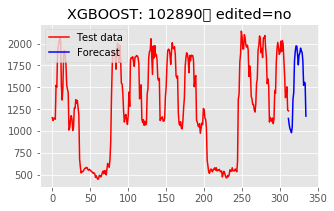


Forecasting from Cold Start Data:  48%|████▊     | 301/625 [04:09<04:48,  1.12it/s]

100409 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 5 / 2016
work day avg= 1456.6870775392492 	 off day avg= 504.9695572332026
[100409 'x-small' 'low' False False False False False True True]


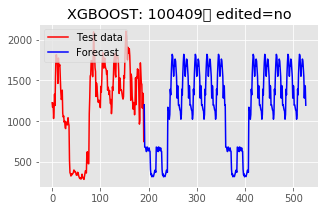


Forecasting from Cold Start Data:  48%|████▊     | 302/625 [04:10<05:03,  1.06it/s]

102988 <class 'numpy.ndarray'>
Last day observed: Sunday 	 26 / 6 / 2016
work day avg= 76165.90451973779 	 off day avg= 76199.02010544519
[102988 'small' 'low' False False False False False True True]


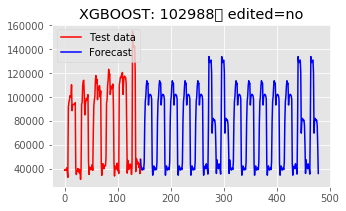


Forecasting from Cold Start Data:  48%|████▊     | 303/625 [04:11<04:54,  1.09it/s]

101399 <class 'numpy.ndarray'>
Last day observed: Saturday 	 26 / 3 / 2016
work day avg= 63558.123724938436 	 off day avg= 64539.77958109772
[101399 'small' 'low' False False False False False True True]


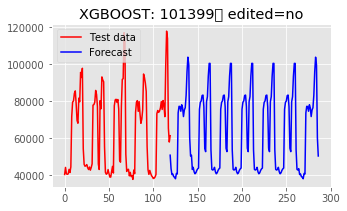


Forecasting from Cold Start Data:  49%|████▊     | 304/625 [04:12<04:28,  1.20it/s]

102177 <class 'numpy.ndarray'>
Last day observed: Saturday 	 19 / 8 / 2017
work day avg= 101924.75024855822 	 off day avg= 89510.94952317292
[102177 'small' 'low' False False False False False True True]


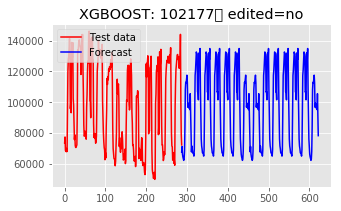


Forecasting from Cold Start Data:  49%|████▉     | 305/625 [04:13<05:08,  1.04it/s]

100715 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 7 / 2016
work day avg= 103496.04399575914 	 off day avg= 110097.82337206602
[100715 'small' 'low' False False False False False True True]


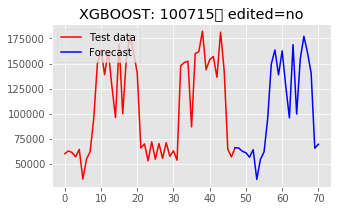


Forecasting from Cold Start Data:  49%|████▉     | 306/625 [04:14<04:19,  1.23it/s]

101993 <class 'numpy.ndarray'>
Last day observed: Sunday 	 30 / 4 / 2017
work day avg= 66172.70188567943 	 off day avg= 65533.877238453366
[101993 'small' 'low' False False False False False True True]


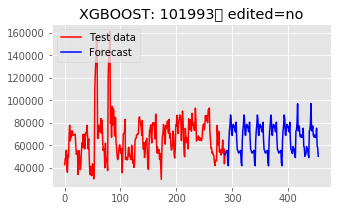


Forecasting from Cold Start Data:  49%|████▉     | 307/625 [04:15<04:51,  1.09it/s]

103489 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 27 / 6 / 2017
work day avg= 46329.12462078785 	 off day avg= 44538.899396469315
[103489 'small' 'low' False False False False False True True]


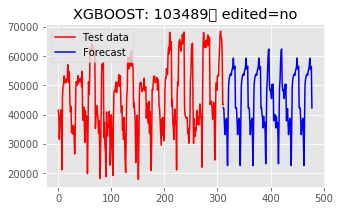


Forecasting from Cold Start Data:  49%|████▉     | 308/625 [04:16<05:43,  1.08s/it]

100229 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 1 / 6 / 2016
work day avg= 32843.71731827702 	 off day avg= 29366.11165898091
[100229 'small' 'low' False False False False False True True]


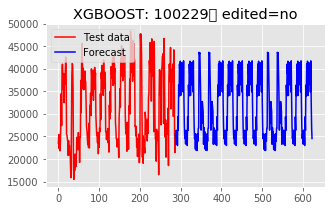


Forecasting from Cold Start Data:  49%|████▉     | 309/625 [04:18<06:12,  1.18s/it]

101788 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 5 / 2015
work day avg= 21081.3861663463 	 off day avg= 12924.385424477805
[101788 'x-large' 'low' False False False False False True True]


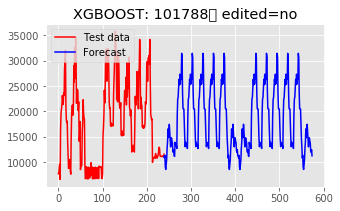


Forecasting from Cold Start Data:  50%|████▉     | 310/625 [04:19<06:14,  1.19s/it]

103486 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 3 / 2 / 2015
work day avg= 271007.8397004577 	 off day avg= 113010.08911107069
[103486 'x-large' 'low' False False False False False True True]


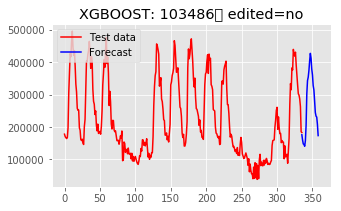


Forecasting from Cold Start Data:  50%|████▉     | 311/625 [04:20<06:40,  1.28s/it]

100981 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 10 / 2014
work day avg= 12731.604778750094 	 off day avg= 10719.325585685583
[100981 'xx-small' 'low' False False False False False True True]


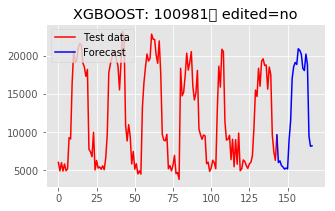


Forecasting from Cold Start Data:  50%|████▉     | 312/625 [04:21<05:54,  1.13s/it]

101488 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 3 / 12 / 2014
work day avg= 11514.869736334236 	 off day avg= 10884.184778664654
[101488 'xx-small' 'low' False False False False False True True]


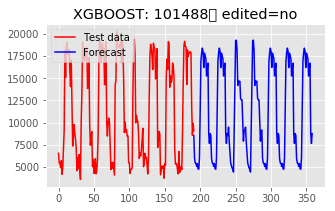


Forecasting from Cold Start Data:  50%|█████     | 313/625 [04:22<05:39,  1.09s/it]

102963 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 23 / 12 / 2014
work day avg= 65861.87128595187 	 off day avg= nan
[102963 'x-large' 'low' False False False False False True True]


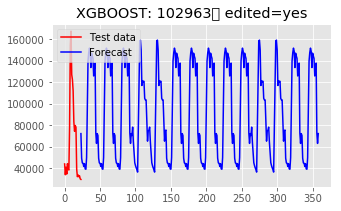


Forecasting from Cold Start Data:  50%|█████     | 314/625 [04:22<04:23,  1.18it/s]

102264 <class 'numpy.ndarray'>
Last day observed: Saturday 	 21 / 2 / 2015
work day avg= 91191.5987514595 	 off day avg= 34075.03529818405
[102264 'x-large' 'low' False False False False False True True]


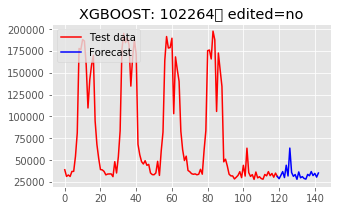


Forecasting from Cold Start Data:  50%|█████     | 315/625 [04:23<04:06,  1.26it/s]

102364 <class 'numpy.ndarray'>
Last day observed: Thursday 	 11 / 6 / 2015
work day avg= 94446.7421877445 	 off day avg= nan
[102364 'x-large' 'low' False False False False False True True]


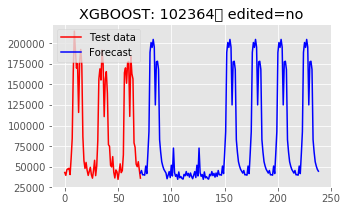


Forecasting from Cold Start Data:  51%|█████     | 316/625 [04:23<03:14,  1.59it/s]

101715 <class 'numpy.ndarray'>
Last day observed: Thursday 	 26 / 5 / 2016
work day avg= 25734.649587312168 	 off day avg= nan
[101715 'small' 'low' False False False False False True True]


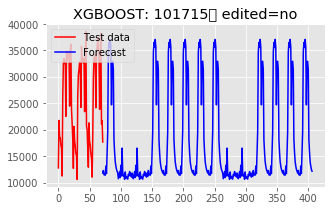


Forecasting from Cold Start Data:  51%|█████     | 317/625 [04:24<02:41,  1.91it/s]

100668 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 25 / 4 / 2017
work day avg= 35577.96138938997 	 off day avg= nan
[100668 'small' 'low' False False False False False True True]


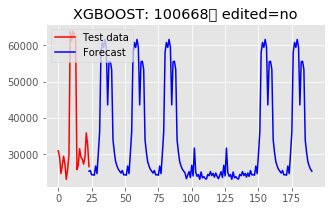


Forecasting from Cold Start Data:  51%|█████     | 318/625 [04:24<02:13,  2.29it/s]

102391 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 10 / 9 / 2014
work day avg= 175168.60211984228 	 off day avg= 74261.82504624438
[102391 'x-large' 'low' False False False False False True True]


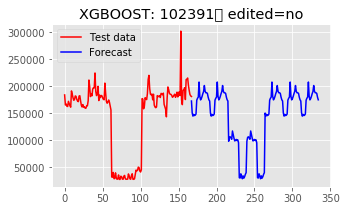


Forecasting from Cold Start Data:  51%|█████     | 319/625 [04:25<02:57,  1.72it/s]

101733 <class 'numpy.ndarray'>
Last day observed: Friday 	 31 / 10 / 2014
work day avg= 42812.78699172226 	 off day avg= nan
[101733 'x-large' 'low' False False False False False True True]


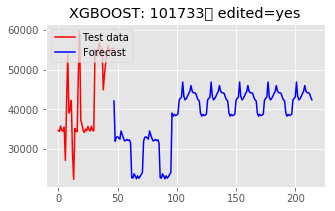


Forecasting from Cold Start Data:  51%|█████     | 320/625 [04:25<02:23,  2.12it/s]

103214 <class 'numpy.ndarray'>
Last day observed: Thursday 	 27 / 11 / 2014
work day avg= 48753.690203647944 	 off day avg= 16797.853351340786
[103214 'x-large' 'low' False False False False False True True]


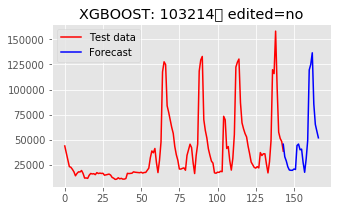


Forecasting from Cold Start Data:  51%|█████▏    | 321/625 [04:26<02:37,  1.93it/s]

101852 <class 'numpy.ndarray'>
Last day observed: Monday 	 26 / 1 / 2015
work day avg= 64144.622592770575 	 off day avg= 18970.211922195445
[101852 'x-large' 'low' False False False False False True True]


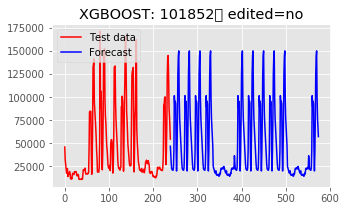


Forecasting from Cold Start Data:  52%|█████▏    | 322/625 [04:26<03:07,  1.61it/s]

101193 <class 'numpy.ndarray'>
Last day observed: Monday 	 2 / 11 / 2015
work day avg= 20170.834886555334 	 off day avg= 40018.321296072776
[101193 'x-small' 'low' False False False False False True True]


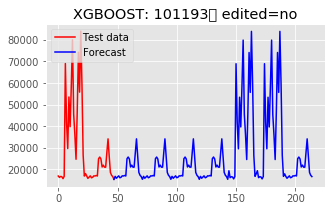


Forecasting from Cold Start Data:  52%|█████▏    | 323/625 [04:27<02:51,  1.77it/s]

102157 <class 'numpy.ndarray'>
Last day observed: Saturday 	 3 / 12 / 2016
work day avg= 24370.06116204085 	 off day avg= 27519.398751494842
[102157 'x-small' 'low' False False False False False True True]


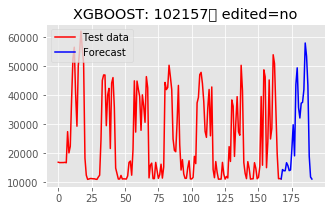


Forecasting from Cold Start Data:  52%|█████▏    | 324/625 [04:28<03:07,  1.60it/s]

101982 <class 'numpy.ndarray'>
Last day observed: Monday 	 30 / 1 / 2017
work day avg= 44440.74976637593 	 off day avg= 42821.596731506754
[101982 'x-small' 'low' False False False False False True True]


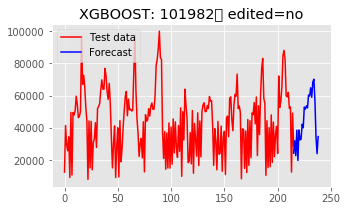


Forecasting from Cold Start Data:  52%|█████▏    | 325/625 [04:29<04:09,  1.20it/s]

103158 <class 'numpy.ndarray'>
Last day observed: Friday 	 23 / 5 / 2014
work day avg= 16819.770331484317 	 off day avg= 9763.361626363554
[103158 'large' 'low' False False False False False True True]


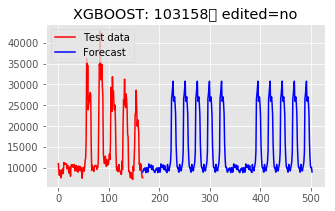


Forecasting from Cold Start Data:  52%|█████▏    | 326/625 [04:30<03:52,  1.28it/s]

101059 <class 'numpy.ndarray'>
Last day observed: Friday 	 25 / 7 / 2014
work day avg= 17933.03007420812 	 off day avg= 11794.560958025053
[101059 'large' 'low' False False False False False True True]


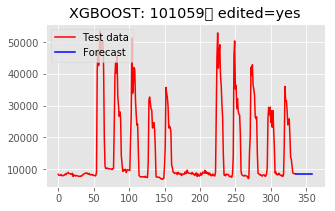


Forecasting from Cold Start Data:  52%|█████▏    | 327/625 [04:30<03:55,  1.27it/s]

101592 <class 'numpy.ndarray'>
Last day observed: Thursday 	 11 / 9 / 2014
work day avg= 18825.250694636194 	 off day avg= 10389.333612555682
[101592 'large' 'low' False False False False False True True]


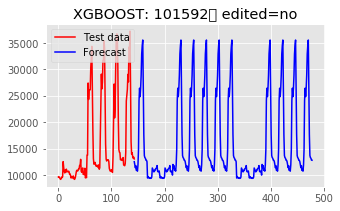


Forecasting from Cold Start Data:  52%|█████▏    | 328/625 [04:31<03:51,  1.28it/s]

101736 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 4 / 2015
work day avg= 14573.694151032576 	 off day avg= 8361.584339884046
[101736 'large' 'low' False False False False False True True]


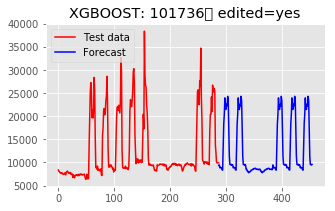


Forecasting from Cold Start Data:  53%|█████▎    | 329/625 [04:32<03:57,  1.25it/s]

101544 <class 'numpy.ndarray'>
Last day observed: Monday 	 12 / 10 / 2015
work day avg= 29020.415445214694 	 off day avg= 12491.65606295073
[101544 'large' 'low' False False False False False True True]


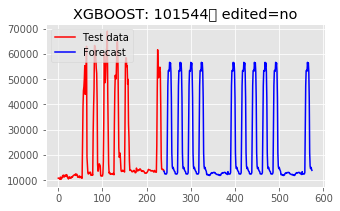


Forecasting from Cold Start Data:  53%|█████▎    | 330/625 [04:33<03:59,  1.23it/s]

103061 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 3 / 2016
work day avg= 18335.460627620345 	 off day avg= 12686.447004148426
[103061 'large' 'low' False False False False False True True]


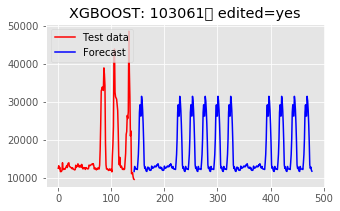


Forecasting from Cold Start Data:  53%|█████▎    | 331/625 [04:33<03:24,  1.44it/s]

102145 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 5 / 2016
work day avg= 16122.125659639902 	 off day avg= 9211.123201768985
[102145 'large' 'low' False False False False False True True]


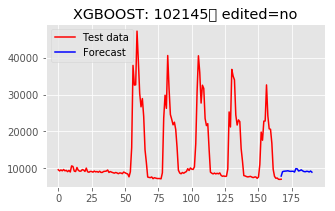


Forecasting from Cold Start Data:  53%|█████▎    | 332/625 [04:34<02:55,  1.67it/s]

102118 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 27 / 12 / 2016
work day avg= 11677.99170826129 	 off day avg= 13576.592755029124
[102118 'large' 'low' False False False False False True True]


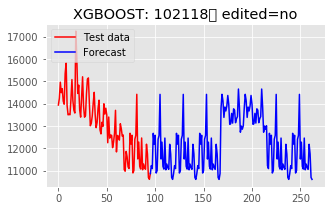


Forecasting from Cold Start Data:  53%|█████▎    | 333/625 [04:34<02:47,  1.74it/s]

103567 <class 'numpy.ndarray'>
Last day observed: Sunday 	 15 / 2 / 2015
work day avg= 22685.992645344777 	 off day avg= 21871.298467628407
[103567 'xx-small' 'low' False False False False False True True]


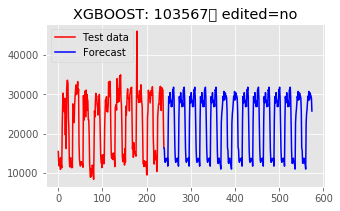


Forecasting from Cold Start Data:  53%|█████▎    | 334/625 [04:35<03:34,  1.36it/s]

100840 <class 'numpy.ndarray'>
Last day observed: Thursday 	 6 / 8 / 2015
work day avg= 22452.31394648323 	 off day avg= 22249.939288423437
[100840 'xx-small' 'low' False False False False False True True]


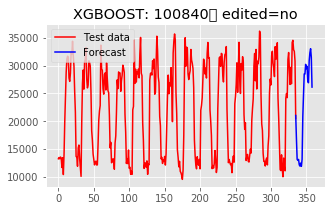


Forecasting from Cold Start Data:  54%|█████▎    | 335/625 [04:37<04:35,  1.05it/s]

103619 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 9 / 2015
work day avg= 22564.449708440246 	 off day avg= 23979.322730025317
[103619 'xx-small' 'low' False False False False False True True]


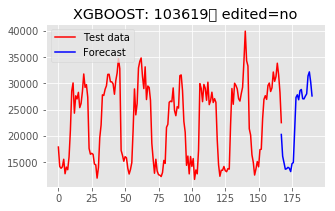


Forecasting from Cold Start Data:  54%|█████▍    | 336/625 [04:38<04:24,  1.09it/s]

102384 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 11 / 2015
work day avg= 22347.52824452264 	 off day avg= 23989.603795541723
[102384 'xx-small' 'low' False False False False False True True]


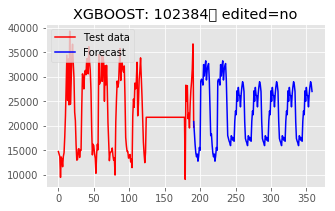


Forecasting from Cold Start Data:  54%|█████▍    | 337/625 [04:39<04:30,  1.06it/s]

102139 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 12 / 1 / 2016
work day avg= 22414.60648531408 	 off day avg= 22328.580421145423
[102139 'xx-small' 'low' False False False False False True True]


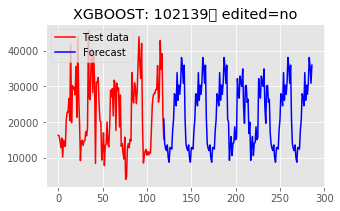


Forecasting from Cold Start Data:  54%|█████▍    | 338/625 [04:39<04:13,  1.13it/s]

103608 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 14 / 12 / 2016
work day avg= 22399.70735756191 	 off day avg= 21909.309550907838
[103608 'xx-small' 'low' False False False False False True True]


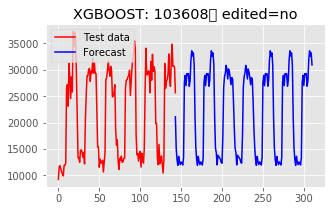


Forecasting from Cold Start Data:  54%|█████▍    | 339/625 [04:40<04:07,  1.16it/s]

101017 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 2 / 2017
work day avg= 21476.013142871027 	 off day avg= nan
[101017 'xx-small' 'low' False False False False False True True]


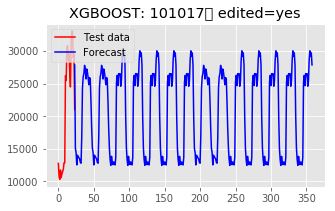


Forecasting from Cold Start Data:  54%|█████▍    | 340/625 [04:41<03:16,  1.45it/s]

102627 <class 'numpy.ndarray'>
Last day observed: Thursday 	 13 / 4 / 2017
work day avg= 23854.07482177388 	 off day avg= 22588.763977462633
[102627 'xx-small' 'low' False False False False False True True]


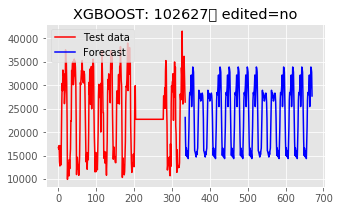


Forecasting from Cold Start Data:  55%|█████▍    | 341/625 [04:42<04:31,  1.05it/s]

101901 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 6 / 6 / 2017
work day avg= 22292.18029580104 	 off day avg= 22707.998995528287
[101901 'xx-small' 'low' False False False False False True True]


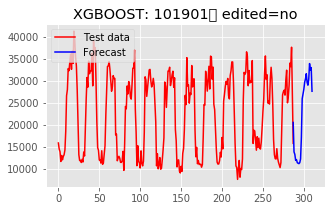


Forecasting from Cold Start Data:  55%|█████▍    | 342/625 [04:44<05:13,  1.11s/it]

102168 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 7 / 2017
work day avg= 23699.586210422043 	 off day avg= 23881.603005987574
[102168 'xx-small' 'low' False False False False False True True]


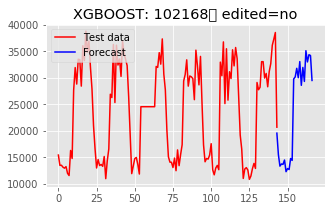


Forecasting from Cold Start Data:  55%|█████▍    | 343/625 [04:44<04:43,  1.00s/it]

103227 <class 'numpy.ndarray'>
Last day observed: Sunday 	 24 / 9 / 2017
work day avg= 23045.415990254798 	 off day avg= 23691.79108851055
[103227 'xx-small' 'low' False False False False False True True]


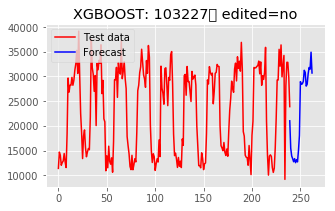


Forecasting from Cold Start Data:  55%|█████▌    | 344/625 [04:45<04:52,  1.04s/it]

102951 <class 'numpy.ndarray'>
Last day observed: Saturday 	 18 / 11 / 2017
work day avg= 23822.24578527572 	 off day avg= 23211.435357691993
[102951 'xx-small' 'low' False False False False False True True]


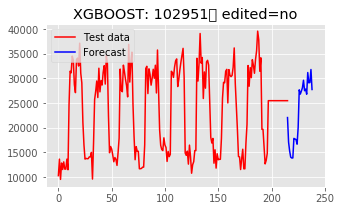


Forecasting from Cold Start Data:  55%|█████▌    | 345/625 [04:46<04:50,  1.04s/it]

100306 <class 'numpy.ndarray'>
Last day observed: Monday 	 30 / 5 / 2016
work day avg= 127834.87792124756 	 off day avg= 138983.57011859282
[100306 'large' 'low' False False False False False True True]


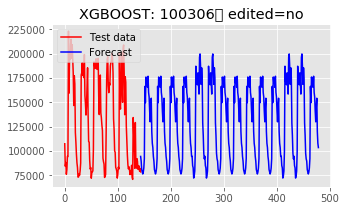


Forecasting from Cold Start Data:  55%|█████▌    | 346/625 [04:47<04:33,  1.02it/s]

100946 <class 'numpy.ndarray'>
Last day observed: Friday 	 29 / 8 / 2014
work day avg= 4782391.677130126 	 off day avg= 4789653.904230323
[100946 'large' 'low' False False False False False True True]


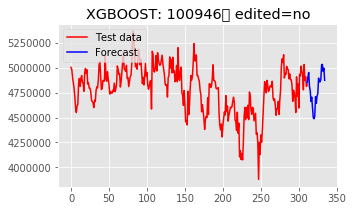


Forecasting from Cold Start Data:  56%|█████▌    | 347/625 [04:48<04:09,  1.11it/s]

102333 <class 'numpy.ndarray'>
Last day observed: Saturday 	 18 / 10 / 2014
work day avg= 4246017.999507582 	 off day avg= 4298843.012733523
[102333 'large' 'low' False False False False False True True]


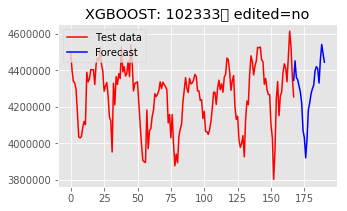


Forecasting from Cold Start Data:  56%|█████▌    | 348/625 [04:49<03:59,  1.16it/s]

101358 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 9 / 12 / 2014
work day avg= 4841798.284523963 	 off day avg= 4629230.173450141
[101358 'large' 'low' False False False False False True True]


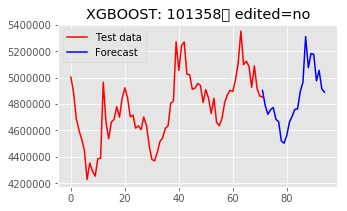


Forecasting from Cold Start Data:  56%|█████▌    | 349/625 [04:49<03:24,  1.35it/s]

103150 <class 'numpy.ndarray'>
Last day observed: Thursday 	 2 / 4 / 2015
work day avg= 4766258.4345606975 	 off day avg= 4828167.350007211
[103150 'large' 'low' False False False False False True True]


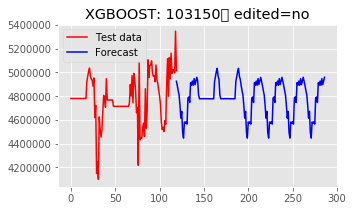


Forecasting from Cold Start Data:  56%|█████▌    | 350/625 [04:50<03:09,  1.45it/s]

101849 <class 'numpy.ndarray'>
Last day observed: Thursday 	 4 / 6 / 2015
work day avg= 4453104.230083636 	 off day avg= 4464501.406387611
[101849 'large' 'low' False False False False False True True]


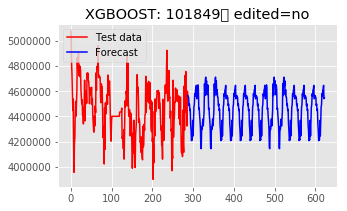


Forecasting from Cold Start Data:  56%|█████▌    | 351/625 [04:51<04:06,  1.11it/s]

101041 <class 'numpy.ndarray'>
Last day observed: Saturday 	 7 / 5 / 2016
work day avg= 4600181.436993007 	 off day avg= 4624830.822290233
[101041 'large' 'low' False False False False False True True]


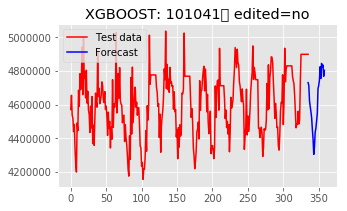


Forecasting from Cold Start Data:  56%|█████▋    | 352/625 [04:52<04:23,  1.04it/s]

100245 <class 'numpy.ndarray'>
Last day observed: Friday 	 7 / 2 / 2014
work day avg= 26362.498775831886 	 off day avg= 26362.498775831875
[100245 'large' 'low' False False False False False True True]


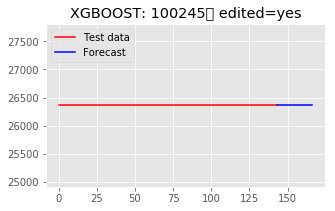


Forecasting from Cold Start Data:  56%|█████▋    | 353/625 [04:53<03:31,  1.29it/s]

103363 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 7 / 2015
work day avg= 33272.79431476808 	 off day avg= 31965.079887926946
[103363 'large' 'low' False False False False False True True]


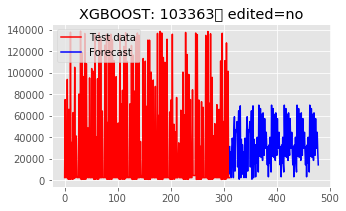


Forecasting from Cold Start Data:  57%|█████▋    | 354/625 [04:54<04:24,  1.03it/s]

100296 <class 'numpy.ndarray'>
Last day observed: Monday 	 7 / 4 / 2014
work day avg= 25083.288575939034 	 off day avg= 25092.158882175827
[100296 'large' 'low' False False False False False True True]


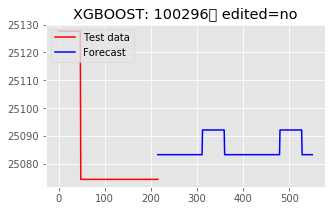


Forecasting from Cold Start Data:  57%|█████▋    | 355/625 [04:54<03:34,  1.26it/s]

100634 <class 'numpy.ndarray'>
Last day observed: Friday 	 11 / 12 / 2015
work day avg= 32965.28318803346 	 off day avg= 20673.843783703673
[100634 'large' 'low' False False False False False True True]


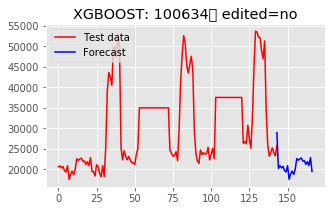


Forecasting from Cold Start Data:  57%|█████▋    | 356/625 [04:55<03:21,  1.34it/s]

103176 <class 'numpy.ndarray'>
Last day observed: Saturday 	 24 / 9 / 2016
work day avg= 34592.43485144608 	 off day avg= 24569.261867333786
[103176 'large' 'low' False False False False False True True]


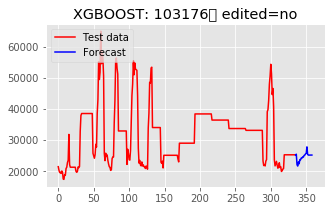


Forecasting from Cold Start Data:  57%|█████▋    | 357/625 [04:56<03:22,  1.32it/s]

101178 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 7 / 1 / 2014
work day avg= 139959.90558560792 	 off day avg= 137327.81694967553
[101178 'large' 'low' False False False False False True True]


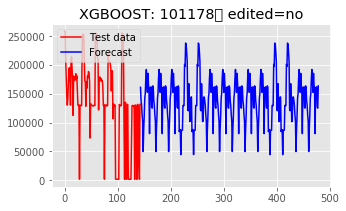


Forecasting from Cold Start Data:  57%|█████▋    | 358/625 [04:57<03:31,  1.26it/s]

102053 <class 'numpy.ndarray'>
Last day observed: Monday 	 3 / 3 / 2014
work day avg= 149025.07212057893 	 off day avg= 168430.24812539315
[102053 'large' 'low' False False False False False True True]


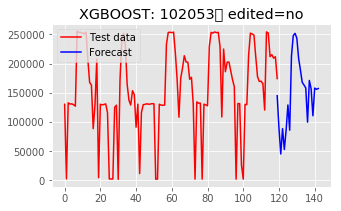


Forecasting from Cold Start Data:  57%|█████▋    | 359/625 [04:58<03:36,  1.23it/s]

101486 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 7 / 5 / 2014
work day avg= 92431.2039106441 	 off day avg= 99296.49442587615
[101486 'large' 'low' False False False False False True True]


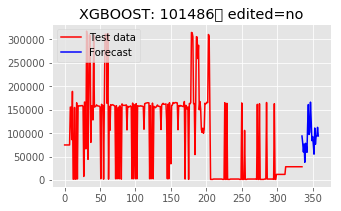


Forecasting from Cold Start Data:  58%|█████▊    | 360/625 [04:59<04:06,  1.08it/s]

101119 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 24 / 6 / 2014
work day avg= 89012.25412498084 	 off day avg= 97370.88232750328
[101119 'large' 'low' False False False False False True True]


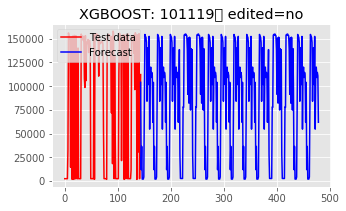


Forecasting from Cold Start Data:  58%|█████▊    | 361/625 [05:00<04:02,  1.09it/s]

102369 <class 'numpy.ndarray'>
Last day observed: Thursday 	 6 / 11 / 2014
work day avg= 86142.05859673089 	 off day avg= 76022.63691598322
[102369 'large' 'low' False False False False False True True]


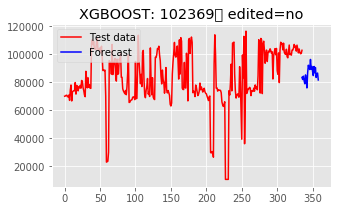


Forecasting from Cold Start Data:  58%|█████▊    | 362/625 [05:01<03:57,  1.11it/s]

102664 <class 'numpy.ndarray'>
Last day observed: Sunday 	 21 / 12 / 2014
work day avg= 95056.79843409773 	 off day avg= 81162.04760298065
[102664 'large' 'low' False False False False False True True]


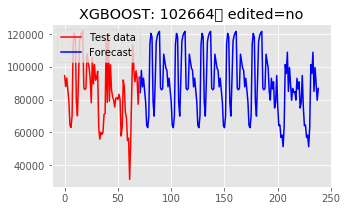


Forecasting from Cold Start Data:  58%|█████▊    | 363/625 [05:01<03:12,  1.36it/s]

100069 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 7 / 2016
work day avg= 72518.34855069639 	 off day avg= 59336.70091800557
[100069 'large' 'low' False False False False False True True]


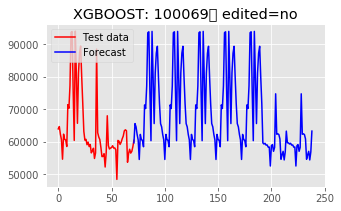


Forecasting from Cold Start Data:  58%|█████▊    | 364/625 [05:01<02:49,  1.54it/s]

100311 <class 'numpy.ndarray'>
Last day observed: Monday 	 9 / 3 / 2015
work day avg= 947517.2293919973 	 off day avg= 538153.6520764077
[100311 'large' 'low' False False False False False True True]


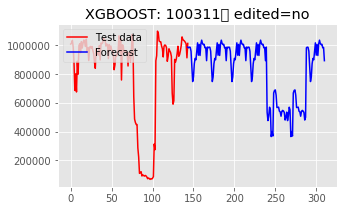


Forecasting from Cold Start Data:  58%|█████▊    | 365/625 [05:02<02:25,  1.79it/s]

103500 <class 'numpy.ndarray'>
Last day observed: Sunday 	 16 / 11 / 2014
work day avg= 622281.6415117519 	 off day avg= 532940.6879201826
[103500 'large' 'low' False False False False False True True]


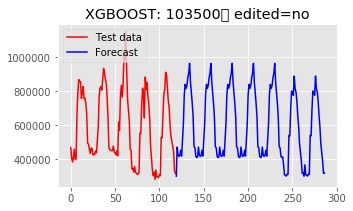


Forecasting from Cold Start Data:  59%|█████▊    | 366/625 [05:02<02:27,  1.75it/s]

102091 <class 'numpy.ndarray'>
Last day observed: Sunday 	 20 / 11 / 2016
work day avg= 640198.6631756119 	 off day avg= 659718.356574932
[102091 'large' 'low' False False False False False True True]


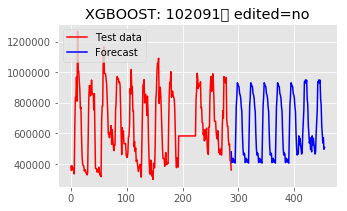


Forecasting from Cold Start Data:  59%|█████▊    | 367/625 [05:04<03:25,  1.26it/s]

100054 <class 'numpy.ndarray'>
Last day observed: Monday 	 26 / 6 / 2017
work day avg= 534308.8813377063 	 off day avg= 511203.5121737356
[100054 'large' 'low' False False False False False True True]


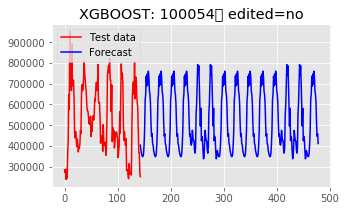


Forecasting from Cold Start Data:  59%|█████▉    | 368/625 [05:04<03:25,  1.25it/s]

102287 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 10 / 2 / 2016
work day avg= 23696.36417496453 	 off day avg= nan
[102287 'medium' 'low' False False False False False True True]


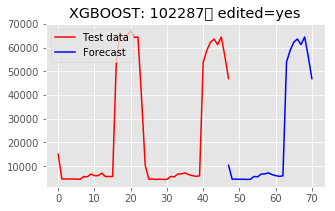


Forecasting from Cold Start Data:  59%|█████▉    | 369/625 [05:05<02:39,  1.60it/s]

100020 <class 'numpy.ndarray'>
Last day observed: Sunday 	 22 / 1 / 2017
work day avg= 22916.466493784872 	 off day avg= 27869.813658563933
[100020 'medium' 'low' False False False False False True True]


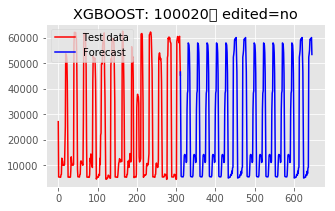


Forecasting from Cold Start Data:  59%|█████▉    | 370/625 [05:06<03:43,  1.14it/s]

101047 <class 'numpy.ndarray'>
Last day observed: Sunday 	 6 / 3 / 2016
work day avg= 4947.133407086898 	 off day avg= 4307.281495202915
[101047 'x-small' 'low' False False False False False True True]


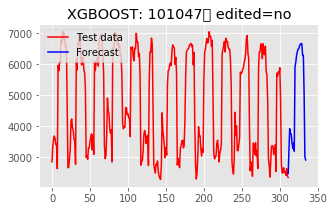


Forecasting from Cold Start Data:  59%|█████▉    | 371/625 [05:08<04:26,  1.05s/it]

100203 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 2 / 2017
work day avg= 7986.950254101808 	 off day avg= 8184.610927641431
[100203 'x-small' 'low' False False False False False True True]


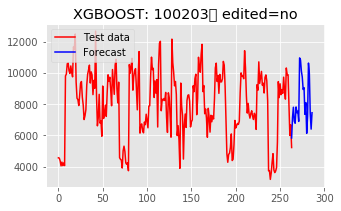


Forecasting from Cold Start Data:  60%|█████▉    | 372/625 [05:09<04:39,  1.11s/it]

102311 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 5 / 2017
work day avg= 7650.007877438027 	 off day avg= 6669.185123748102
[102311 'x-small' 'low' False False False False False True True]


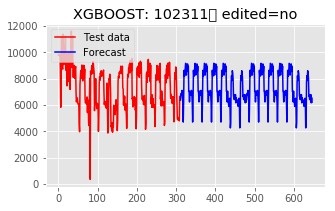


Forecasting from Cold Start Data:  60%|█████▉    | 373/625 [05:10<05:02,  1.20s/it]

101866 <class 'numpy.ndarray'>
Last day observed: Friday 	 3 / 11 / 2017
work day avg= 8099.970906043804 	 off day avg= nan
[101866 'x-small' 'low' False False False False False True True]


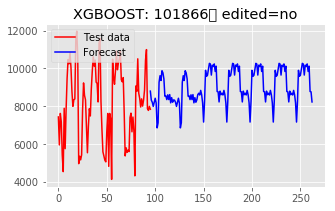


Forecasting from Cold Start Data:  60%|█████▉    | 374/625 [05:10<03:47,  1.10it/s]

100246 <class 'numpy.ndarray'>
Last day observed: Monday 	 7 / 3 / 2016
work day avg= 16857.280874286036 	 off day avg= 15092.206313436609
[100246 'small' 'low' False False False False False True True]


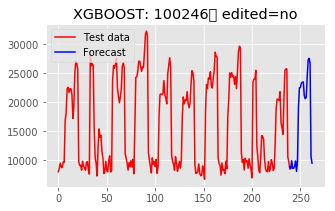


Forecasting from Cold Start Data:  60%|██████    | 375/625 [05:12<04:03,  1.03it/s]

100369 <class 'numpy.ndarray'>
Last day observed: Saturday 	 27 / 5 / 2017
work day avg= 20121.088302358792 	 off day avg= 19990.15356364887
[100369 'small' 'low' False False False False False True True]


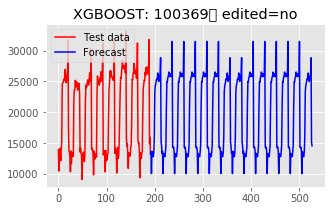


Forecasting from Cold Start Data:  60%|██████    | 376/625 [05:13<04:07,  1.01it/s]

102825 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 7 / 2017
work day avg= 24941.22878375652 	 off day avg= 25425.51484830472
[102825 'small' 'low' False False False False False True True]


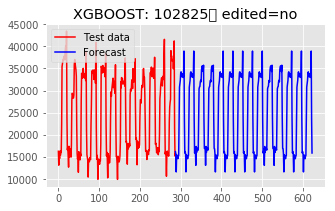


Forecasting from Cold Start Data:  60%|██████    | 377/625 [05:14<04:45,  1.15s/it]

100781 <class 'numpy.ndarray'>
Last day observed: Saturday 	 9 / 9 / 2017
work day avg= nan 	 off day avg= 21684.046256657573
[100781 'small' 'low' False False False False False True True]


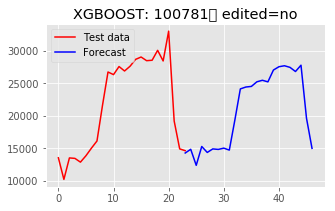


Forecasting from Cold Start Data:  60%|██████    | 378/625 [05:14<03:32,  1.16it/s]

101623 <class 'numpy.ndarray'>
Last day observed: Sunday 	 12 / 11 / 2017
work day avg= 38045.23124580781 	 off day avg= 37420.150119574624
[101623 'small' 'low' False False False False False True True]


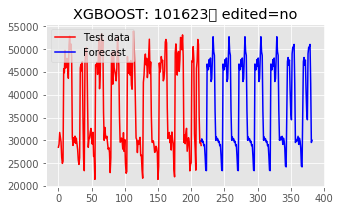


Forecasting from Cold Start Data:  61%|██████    | 379/625 [05:15<03:49,  1.07it/s]

100550 <class 'numpy.ndarray'>
Last day observed: Saturday 	 2 / 7 / 2016
work day avg= 784331.8769908367 	 off day avg= 777159.341378378
[100550 'medium' 'low' False False False False False True True]


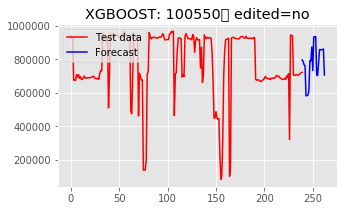


Forecasting from Cold Start Data:  61%|██████    | 380/625 [05:16<03:39,  1.11it/s]

102356 <class 'numpy.ndarray'>
Last day observed: Sunday 	 8 / 3 / 2015
work day avg= 23479.095024047205 	 off day avg= 4276.914428869
[102356 'x-large' 'low' False False False False False True True]


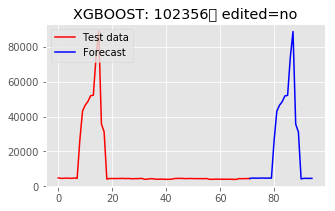


Forecasting from Cold Start Data:  61%|██████    | 381/625 [05:17<02:53,  1.40it/s]

101611 <class 'numpy.ndarray'>
Last day observed: Monday 	 4 / 5 / 2015
work day avg= 202033.42002667076 	 off day avg= 48816.77972245202
[101611 'x-large' 'low' False False False False False True True]


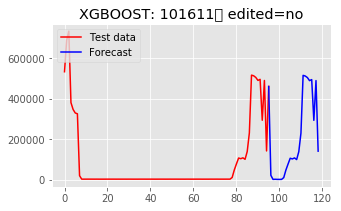


Forecasting from Cold Start Data:  61%|██████    | 382/625 [05:17<02:47,  1.45it/s]

100432 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 23 / 12 / 2015
work day avg= 474476.4523224339 	 off day avg= 157320.73131024046
[100432 'x-large' 'low' False False False False False True True]


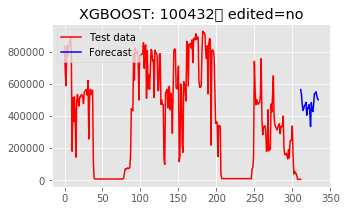


Forecasting from Cold Start Data:  61%|██████▏   | 383/625 [05:19<03:37,  1.11it/s]

100277 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 16 / 11 / 2016
work day avg= 317524.7731838365 	 off day avg= 110318.83252091683
[100277 'x-large' 'low' False False False False False True True]


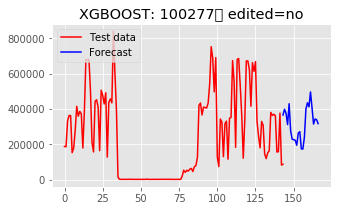


Forecasting from Cold Start Data:  61%|██████▏   | 384/625 [05:19<03:30,  1.15it/s]

101136 <class 'numpy.ndarray'>
Last day observed: Saturday 	 11 / 3 / 2017
work day avg= 400234.1192321124 	 off day avg= 82047.8306992987
[101136 'x-large' 'low' False False False False False True True]


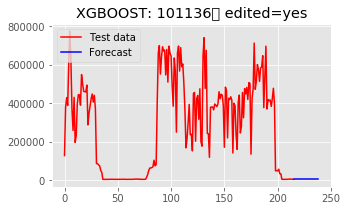


Forecasting from Cold Start Data:  62%|██████▏   | 385/625 [05:20<03:44,  1.07it/s]

100147 <class 'numpy.ndarray'>
Last day observed: Sunday 	 30 / 4 / 2017
work day avg= 616510.7234684142 	 off day avg= 200285.97275151612
[100147 'x-large' 'low' False False False False False True True]


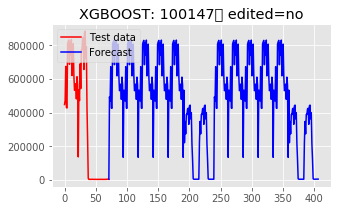


Forecasting from Cold Start Data:  62%|██████▏   | 386/625 [05:21<03:22,  1.18it/s]

102111 <class 'numpy.ndarray'>
Last day observed: Saturday 	 19 / 8 / 2017
work day avg= 4937.565002751052 	 off day avg= 4887.032058052544
[102111 'x-large' 'low' False False False False False True True]


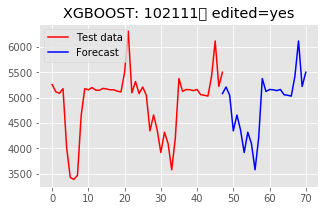


Forecasting from Cold Start Data:  62%|██████▏   | 387/625 [05:21<02:42,  1.47it/s]

100890 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 24 / 10 / 2017
work day avg= 569602.9874072926 	 off day avg= 149842.0280738912
[100890 'x-large' 'low' False False False False False True True]


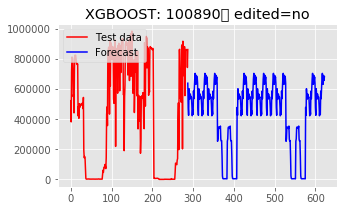


Forecasting from Cold Start Data:  62%|██████▏   | 388/625 [05:23<03:24,  1.16it/s]

100571 <class 'numpy.ndarray'>
Last day observed: Sunday 	 8 / 1 / 2017
work day avg= 50247.08912465067 	 off day avg= 40920.45983393038
[100571 'small' 'low' False False False False False True True]


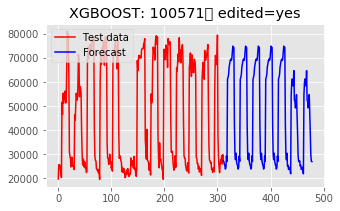


Forecasting from Cold Start Data:  62%|██████▏   | 389/625 [05:24<04:02,  1.03s/it]

102786 <class 'numpy.ndarray'>
Last day observed: Friday 	 24 / 6 / 2016
work day avg= 15313.877744200485 	 off day avg= 12358.674592116615
[102786 'x-small' 'low' False False False False False True True]


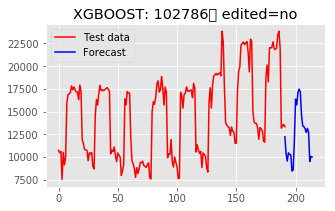


Forecasting from Cold Start Data:  62%|██████▏   | 390/625 [05:25<03:53,  1.01it/s]

100708 <class 'numpy.ndarray'>
Last day observed: Sunday 	 5 / 3 / 2017
work day avg= 28627.98857693393 	 off day avg= 21695.565596184082
[100708 'x-small' 'low' False False False False False True True]


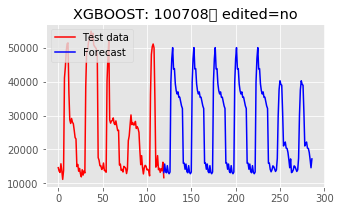


Forecasting from Cold Start Data:  63%|██████▎   | 391/625 [05:26<03:32,  1.10it/s]

102510 <class 'numpy.ndarray'>
Last day observed: Monday 	 27 / 3 / 2017
work day avg= 142545.08925112037 	 off day avg= 27714.072201958013
[102510 'large' 'low' False False False False False True True]


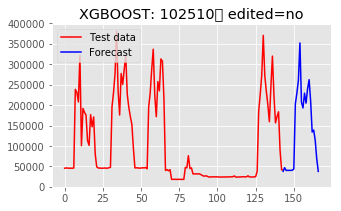


Forecasting from Cold Start Data:  63%|██████▎   | 392/625 [05:26<03:19,  1.17it/s]

101942 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 24 / 5 / 2017
work day avg= 157036.00608054863 	 off day avg= 69049.40642963647
[101942 'large' 'low' False False False False False True True]


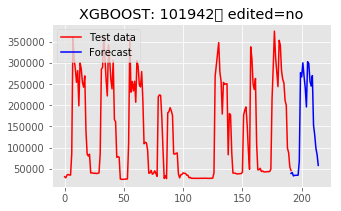


Forecasting from Cold Start Data:  63%|██████▎   | 393/625 [05:27<03:21,  1.15it/s]

103599 <class 'numpy.ndarray'>
Last day observed: Sunday 	 7 / 8 / 2016
work day avg= 34570.220571222795 	 off day avg= 32663.641292363714
[103599 'x-small' 'low' False False False False False True True]


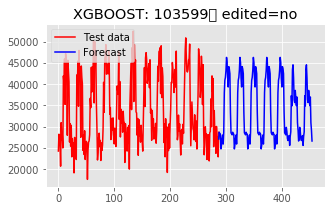


Forecasting from Cold Start Data:  63%|██████▎   | 394/625 [05:28<03:33,  1.08it/s]

100927 <class 'numpy.ndarray'>
Last day observed: Sunday 	 19 / 3 / 2017
work day avg= 23759.200921552936 	 off day avg= 21488.667207722476
[100927 'x-small' 'low' False False False False False True True]


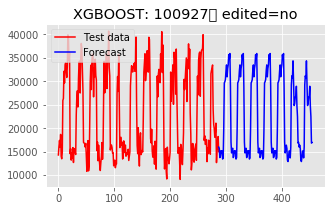


Forecasting from Cold Start Data:  63%|██████▎   | 395/625 [05:30<03:59,  1.04s/it]

101468 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 30 / 8 / 2017
work day avg= 32370.052419725092 	 off day avg= 32227.581207673997
[101468 'x-small' 'low' False False False False False True True]


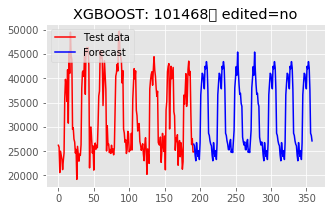


Forecasting from Cold Start Data:  63%|██████▎   | 396/625 [05:31<03:51,  1.01s/it]

102600 <class 'numpy.ndarray'>
Last day observed: Sunday 	 15 / 1 / 2017
work day avg= nan 	 off day avg= 99168.07890047754
[102600 'medium' 'low' False False False False False True True]


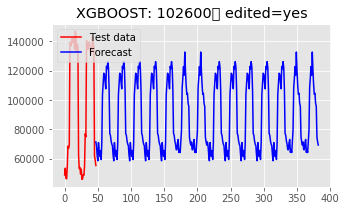


Forecasting from Cold Start Data:  64%|██████▎   | 397/625 [05:31<03:00,  1.26it/s]

100485 <class 'numpy.ndarray'>
Last day observed: Monday 	 23 / 10 / 2017
work day avg= 121483.91638752166 	 off day avg= 124169.05855100283
[100485 'medium' 'low' False False False False False True True]


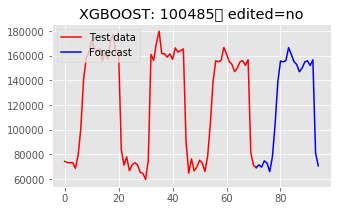


Forecasting from Cold Start Data:  64%|██████▎   | 398/625 [05:31<02:41,  1.41it/s]

103448 <class 'numpy.ndarray'>
Last day observed: Saturday 	 23 / 4 / 2016
work day avg= 35401.769577416526 	 off day avg= 35535.5875281132
[103448 'x-small' 'low' False False False False False True True]


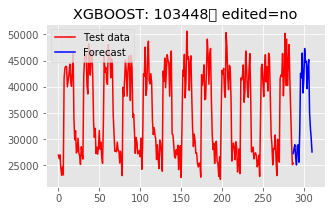


Forecasting from Cold Start Data:  64%|██████▍   | 399/625 [05:33<03:14,  1.16it/s]

101608 <class 'numpy.ndarray'>
Last day observed: Friday 	 27 / 10 / 2017
work day avg= 35005.279059713124 	 off day avg= nan
[101608 'x-small' 'low' False False False False False True True]


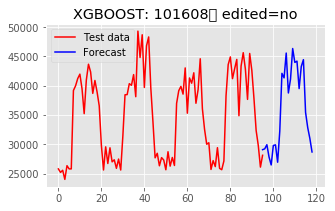


Forecasting from Cold Start Data:  64%|██████▍   | 400/625 [05:33<02:30,  1.50it/s]

101278 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 26 / 7 / 2016
work day avg= 9454.470665689852 	 off day avg= 1440.4118793060672
[101278 'medium' 'low' False False False False False True True]


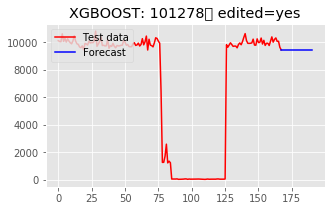


Forecasting from Cold Start Data:  64%|██████▍   | 401/625 [05:34<02:46,  1.35it/s]

103362 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 27 / 9 / 2017
work day avg= 24204.41497693401 	 off day avg= 1736.002748155879
[103362 'small' 'low' False False False False False True True]


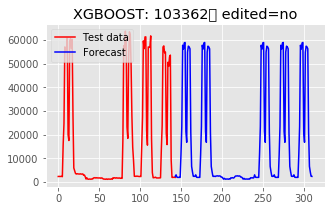


Forecasting from Cold Start Data:  64%|██████▍   | 402/625 [05:35<02:43,  1.36it/s]

101354 <class 'numpy.ndarray'>
Last day observed: Saturday 	 22 / 10 / 2016
work day avg= 12370.626990562634 	 off day avg= 1619.263477899173
[101354 'small' 'low' False False False False False True True]


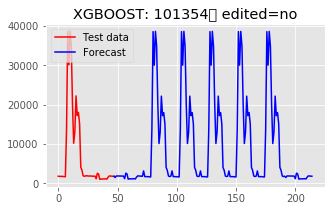


Forecasting from Cold Start Data:  64%|██████▍   | 403/625 [05:35<02:14,  1.65it/s]

101174 <class 'numpy.ndarray'>
Last day observed: Friday 	 4 / 11 / 2016
work day avg= 75063.30268466209 	 off day avg= 74065.20993419057
[101174 'x-small' 'low' False False False False False True True]


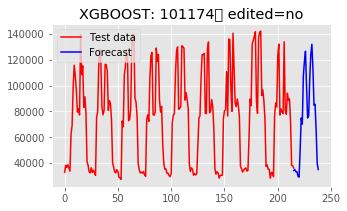


Forecasting from Cold Start Data:  65%|██████▍   | 404/625 [05:36<02:47,  1.32it/s]

103119 <class 'numpy.ndarray'>
Last day observed: Monday 	 2 / 10 / 2017
work day avg= 59020.62838226385 	 off day avg= 54591.609086362645
[103119 'x-small' 'low' False False False False False True True]


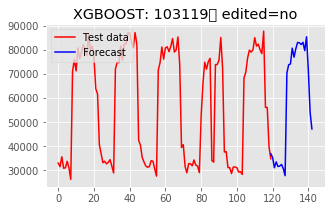


Forecasting from Cold Start Data:  65%|██████▍   | 405/625 [05:37<02:46,  1.32it/s]

103300 <class 'numpy.ndarray'>
Last day observed: Saturday 	 24 / 6 / 2017
work day avg= 43726.52920350174 	 off day avg= 42504.65491395938
[103300 'x-small' 'low' False False False False False True True]


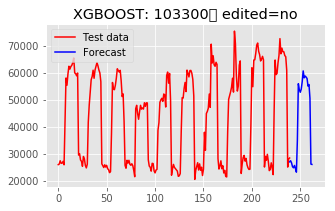


Forecasting from Cold Start Data:  65%|██████▍   | 406/625 [05:38<03:09,  1.16it/s]

103301 <class 'numpy.ndarray'>
Last day observed: Friday 	 18 / 8 / 2017
work day avg= 46575.01840322194 	 off day avg= 37065.44741652003
[103301 'x-small' 'low' False False False False False True True]


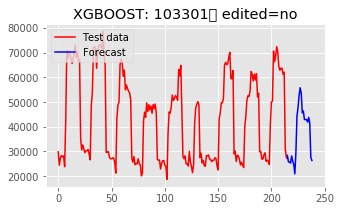


Forecasting from Cold Start Data:  65%|██████▌   | 407/625 [05:39<03:20,  1.09it/s]

101129 <class 'numpy.ndarray'>
Last day observed: Thursday 	 16 / 3 / 2017
work day avg= 35029.38625552811 	 off day avg= 35449.80054761564
[101129 'medium' 'low' False False False False False True True]


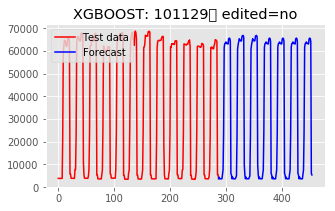


Forecasting from Cold Start Data:  65%|██████▌   | 408/625 [05:40<03:46,  1.04s/it]

100753 <class 'numpy.ndarray'>
Last day observed: Sunday 	 9 / 10 / 2016
work day avg= 115392.02050644463 	 off day avg= 106446.47219872655
[100753 'small' 'low' False False False False False True True]


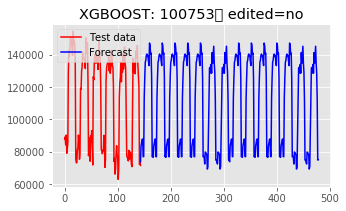


Forecasting from Cold Start Data:  65%|██████▌   | 409/625 [05:41<03:30,  1.03it/s]

103282 <class 'numpy.ndarray'>
Last day observed: Saturday 	 25 / 3 / 2017
work day avg= 52006.33098637138 	 off day avg= 52351.851002393676
[103282 'x-small' 'low' False False False False False True True]


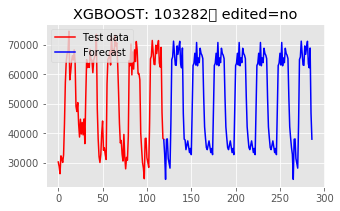


Forecasting from Cold Start Data:  66%|██████▌   | 410/625 [05:42<03:14,  1.11it/s]

103180 <class 'numpy.ndarray'>
Last day observed: Sunday 	 16 / 7 / 2017
work day avg= 91086.6799002058 	 off day avg= 88593.3001185645
[103180 'x-small' 'low' False False False False False True True]


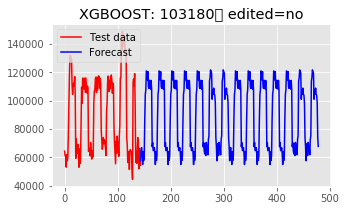


Forecasting from Cold Start Data:  66%|██████▌   | 411/625 [05:43<03:11,  1.12it/s]

100150 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 6 / 2016
work day avg= 28165.165051725402 	 off day avg= nan
[100150 'small' 'low' False False False False False True True]


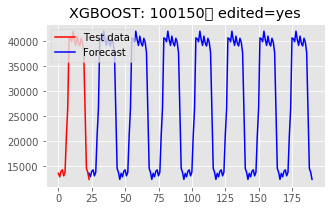


Forecasting from Cold Start Data:  66%|██████▌   | 412/625 [05:43<02:29,  1.43it/s]

100740 <class 'numpy.ndarray'>
Last day observed: Saturday 	 31 / 12 / 2016
work day avg= 37657.19531587179 	 off day avg= 29592.588256549247
[100740 'x-small' 'low' False False False False False True True]


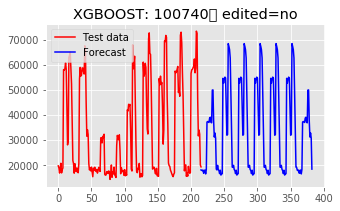


Forecasting from Cold Start Data:  66%|██████▌   | 413/625 [05:44<02:55,  1.20it/s]

101198 <class 'numpy.ndarray'>
Last day observed: Sunday 	 19 / 2 / 2017
work day avg= 41293.49397526914 	 off day avg= 37703.09947788451
[101198 'x-small' 'low' False False False False False True True]


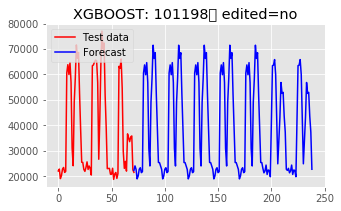


Forecasting from Cold Start Data:  66%|██████▌   | 414/625 [05:45<02:36,  1.35it/s]

102146 <class 'numpy.ndarray'>
Last day observed: Thursday 	 21 / 7 / 2016
work day avg= 77051.14834102629 	 off day avg= 75757.6978498638
[102146 'small' 'low' False False False False False False False]


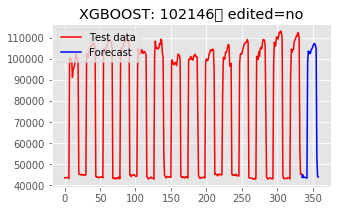


Forecasting from Cold Start Data:  66%|██████▋   | 415/625 [05:46<03:19,  1.05it/s]

103446 <class 'numpy.ndarray'>
Last day observed: Saturday 	 15 / 4 / 2017
work day avg= 15913.53959060558 	 off day avg= 14951.896395227259
[103446 'xx-small' 'low' False False False False False True True]


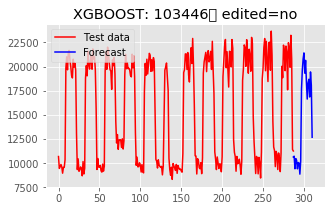


Forecasting from Cold Start Data:  67%|██████▋   | 416/625 [05:47<03:38,  1.04s/it]

103368 <class 'numpy.ndarray'>
Last day observed: Sunday 	 11 / 6 / 2017
work day avg= 19080.707753514023 	 off day avg= 17486.573016105463
[103368 'xx-small' 'low' False False False False False True True]


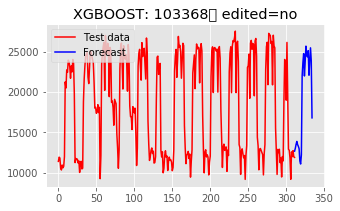


Forecasting from Cold Start Data:  67%|██████▋   | 417/625 [05:48<03:49,  1.10s/it]

101627 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 13 / 6 / 2017
work day avg= 15033.14992336114 	 off day avg= nan
[101627 'x-small' 'low' False False False False False True True]


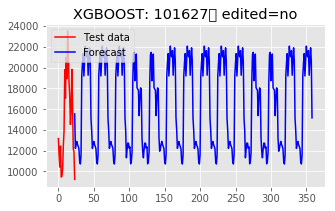


Forecasting from Cold Start Data:  67%|██████▋   | 418/625 [05:49<02:57,  1.17it/s]

102000 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 23 / 8 / 2017
work day avg= 25445.872553195826 	 off day avg= 23391.859156575178
[102000 'x-small' 'low' False False False False False True True]


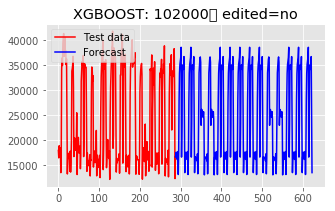


Forecasting from Cold Start Data:  67%|██████▋   | 419/625 [05:50<03:28,  1.01s/it]

103450 <class 'numpy.ndarray'>
Last day observed: Monday 	 4 / 9 / 2017
work day avg= 76108.30334779427 	 off day avg= 72484.51833936562
[103450 'small' 'low' False False False False False True True]


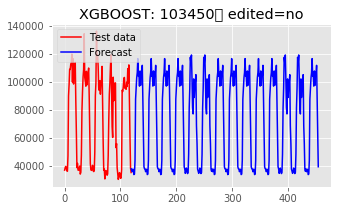


Forecasting from Cold Start Data:  67%|██████▋   | 420/625 [05:51<03:09,  1.08it/s]

101556 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 7 / 2016
work day avg= 1567.1925754565746 	 off day avg= 1159.5532103436028
[101556 'xx-small' 'low' False False False False False True True]


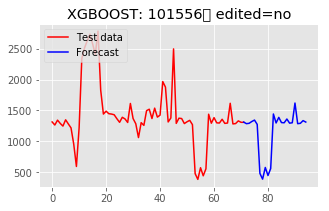


Forecasting from Cold Start Data:  67%|██████▋   | 421/625 [05:51<02:32,  1.34it/s]

100280 <class 'numpy.ndarray'>
Last day observed: Sunday 	 2 / 10 / 2016
work day avg= 784.857366410037 	 off day avg= 275.37726022056205
[100280 'xx-small' 'low' False False False False False True True]


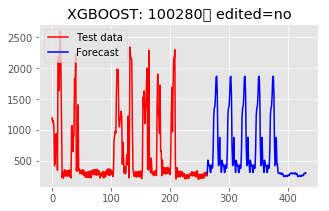


Forecasting from Cold Start Data:  68%|██████▊   | 422/625 [05:52<02:26,  1.39it/s]

100599 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 1 / 2017
work day avg= 2553.7879808456887 	 off day avg= 2007.8445619506917
[100599 'xx-small' 'low' False False False False False True True]


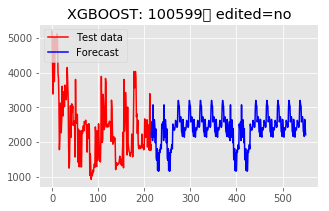


Forecasting from Cold Start Data:  68%|██████▊   | 423/625 [05:53<02:33,  1.32it/s]

101924 <class 'numpy.ndarray'>
Last day observed: Thursday 	 9 / 3 / 2017
work day avg= 1296.8034860490977 	 off day avg= nan
[101924 'xx-small' 'low' False False False False False True True]


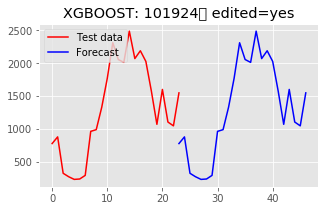


Forecasting from Cold Start Data:  68%|██████▊   | 424/625 [05:53<01:57,  1.71it/s]

100806 <class 'numpy.ndarray'>
Last day observed: Friday 	 5 / 5 / 2017
work day avg= 599.6688257476198 	 off day avg= nan
[100806 'xx-small' 'low' False False False False False True True]


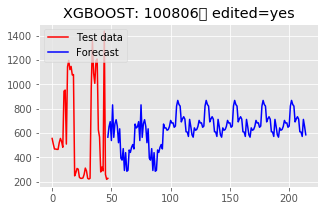


Forecasting from Cold Start Data:  68%|██████▊   | 425/625 [05:53<01:35,  2.09it/s]

101808 <class 'numpy.ndarray'>
Last day observed: Friday 	 30 / 6 / 2017
work day avg= 1321.6536460997402 	 off day avg= nan
[101808 'xx-small' 'low' False False False False False True True]


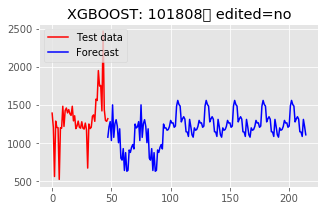


Forecasting from Cold Start Data:  68%|██████▊   | 426/625 [05:53<01:19,  2.49it/s]

100078 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 1 / 2015
work day avg= 3605.349517185212 	 off day avg= 2890.799934641293
[100078 'x-large' 'low' False False False False False True True]


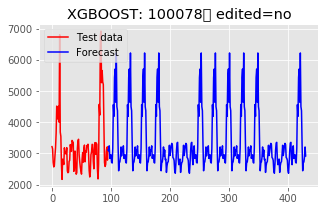


Forecasting from Cold Start Data:  68%|██████▊   | 427/625 [05:54<01:17,  2.55it/s]

103528 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 19 / 8 / 2015
work day avg= 10355.037058843178 	 off day avg= 4381.19235422091
[103528 'x-large' 'low' False False False False False True True]


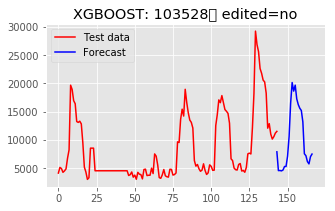


Forecasting from Cold Start Data:  68%|██████▊   | 428/625 [05:54<01:34,  2.09it/s]

101240 <class 'numpy.ndarray'>
Last day observed: Sunday 	 31 / 1 / 2016
work day avg= 8938.850404521747 	 off day avg= 8111.684659513288
[101240 'x-large' 'low' False False False False False True True]


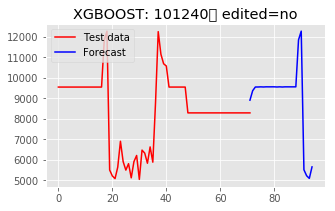


Forecasting from Cold Start Data:  69%|██████▊   | 429/625 [05:55<01:24,  2.31it/s]

100376 <class 'numpy.ndarray'>
Last day observed: Monday 	 25 / 7 / 2016
work day avg= 12539.399418045805 	 off day avg= 7772.5358381017095
[100376 'x-large' 'low' False False False False False True True]


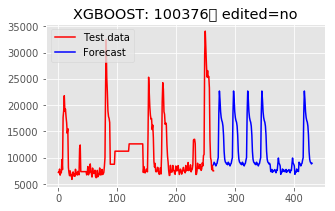


Forecasting from Cold Start Data:  69%|██████▉   | 430/625 [05:55<01:31,  2.13it/s]

100491 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 3 / 2017
work day avg= 12264.128905774976 	 off day avg= 5972.434890387968
[100491 'x-large' 'low' False False False False False True True]


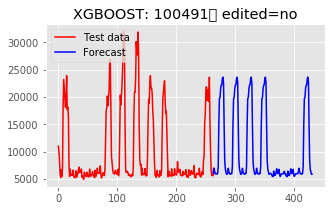


Forecasting from Cold Start Data:  69%|██████▉   | 431/625 [05:56<01:34,  2.06it/s]

102559 <class 'numpy.ndarray'>
Last day observed: Monday 	 14 / 8 / 2017
work day avg= 14388.53535302665 	 off day avg= 7806.181887561649
[102559 'x-large' 'low' False False False False False True True]


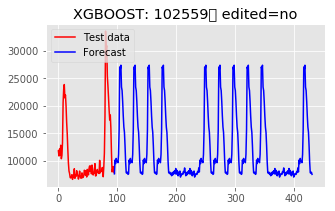


Forecasting from Cold Start Data:  69%|██████▉   | 432/625 [05:56<01:27,  2.21it/s]

102660 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 8 / 12 / 2015
work day avg= 175273.9848992368 	 off day avg= 60780.28060075397
[102660 'large' 'low' False False False False False True True]


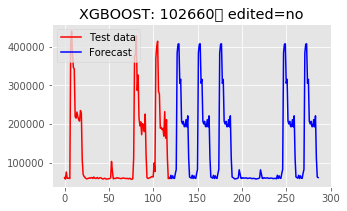


Forecasting from Cold Start Data:  69%|██████▉   | 433/625 [05:57<01:40,  1.90it/s]

100721 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 6 / 6 / 2012
work day avg= 133571.27704382455 	 off day avg= 56716.75151426161
[100721 'xx-large' 'low' False False False False False True True]


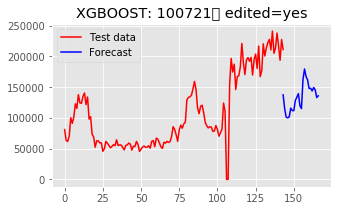


Forecasting from Cold Start Data:  69%|██████▉   | 434/625 [05:57<01:47,  1.78it/s]

101433 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 25 / 9 / 2012
work day avg= 170507.41536674497 	 off day avg= 106149.354206162
[101433 'xx-large' 'low' False False False False False True True]


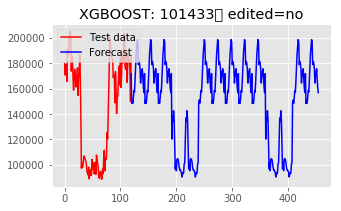


Forecasting from Cold Start Data:  70%|██████▉   | 435/625 [05:58<01:59,  1.59it/s]

103393 <class 'numpy.ndarray'>
Last day observed: Thursday 	 22 / 11 / 2012
work day avg= 73363.76855412728 	 off day avg= 70835.51231738109
[103393 'xx-large' 'low' False False False False False True True]


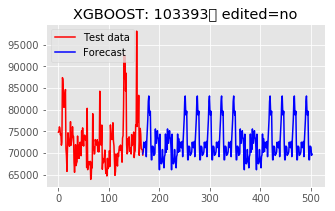


Forecasting from Cold Start Data:  70%|██████▉   | 436/625 [05:59<02:08,  1.47it/s]

101874 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 16 / 1 / 2013
work day avg= 104270.8124045927 	 off day avg= 71177.80991243535
[101874 'xx-large' 'low' False False False False False True True]


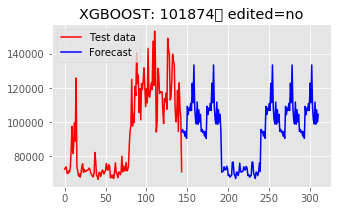


Forecasting from Cold Start Data:  70%|██████▉   | 437/625 [06:00<02:04,  1.51it/s]

103164 <class 'numpy.ndarray'>
Last day observed: Saturday 	 16 / 3 / 2013
work day avg= 129577.57126871916 	 off day avg= 76315.56381513423
[103164 'xx-large' 'low' False False False False False True True]


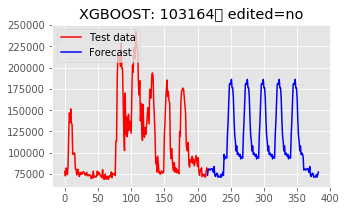


Forecasting from Cold Start Data:  70%|███████   | 438/625 [06:01<02:20,  1.34it/s]

100503 <class 'numpy.ndarray'>
Last day observed: Friday 	 5 / 7 / 2013
work day avg= 127554.43171641135 	 off day avg= 83053.08647803149
[100503 'xx-large' 'low' False False False False False True True]


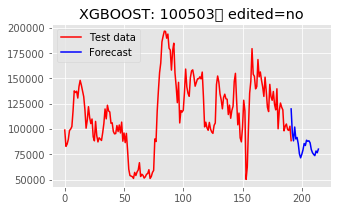


Forecasting from Cold Start Data:  70%|███████   | 439/625 [06:01<02:24,  1.29it/s]

103359 <class 'numpy.ndarray'>
Last day observed: Sunday 	 25 / 8 / 2013
work day avg= 62176.50315463935 	 off day avg= 63727.902254677705
[103359 'xx-large' 'low' False False False False False True True]


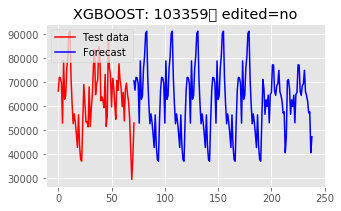


Forecasting from Cold Start Data:  70%|███████   | 440/625 [06:02<02:06,  1.46it/s]

102193 <class 'numpy.ndarray'>
Last day observed: Sunday 	 15 / 12 / 2013
work day avg= 37571.396027450646 	 off day avg= 35457.690878113535
[102193 'xx-large' 'low' False False False False False True True]


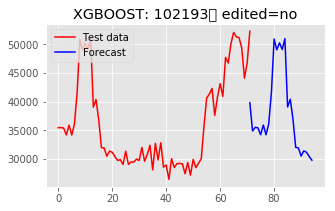


Forecasting from Cold Start Data:  71%|███████   | 441/625 [06:02<01:55,  1.59it/s]

101410 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 9 / 2014
work day avg= 63787.57683541059 	 off day avg= 40368.92637230617
[101410 'xx-large' 'low' False False False False False True True]


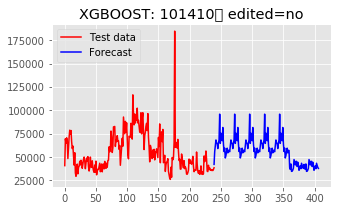


Forecasting from Cold Start Data:  71%|███████   | 442/625 [06:03<02:02,  1.49it/s]

101091 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 14 / 1 / 2015
work day avg= 58899.19618064233 	 off day avg= 36179.94580362885
[101091 'xx-large' 'low' False False False False False True True]


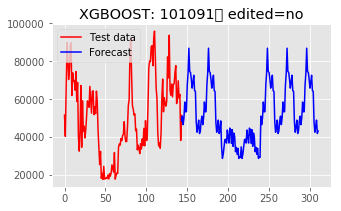


Forecasting from Cold Start Data:  71%|███████   | 443/625 [06:04<02:00,  1.50it/s]

102536 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 18 / 3 / 2015
work day avg= 58958.17465515488 	 off day avg= 31267.41531853468
[102536 'xx-large' 'low' False False False False False True True]


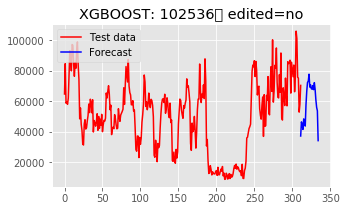


Forecasting from Cold Start Data:  71%|███████   | 444/625 [06:05<02:34,  1.17it/s]

102292 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 2 / 9 / 2015
work day avg= 75227.58479249002 	 off day avg= 61646.88687566583
[102292 'xx-large' 'low' False False False False False True True]


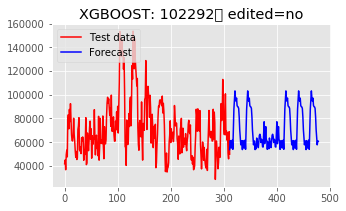


Forecasting from Cold Start Data:  71%|███████   | 445/625 [06:06<02:50,  1.06it/s]

103338 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 7 / 2016
work day avg= 254430.6190647607 	 off day avg= 144114.00747063002
[103338 'xx-large' 'low' False False False False False True True]


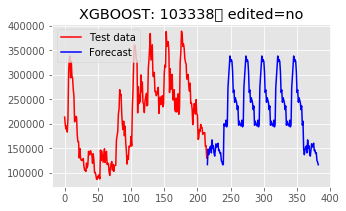


Forecasting from Cold Start Data:  71%|███████▏  | 446/625 [06:07<02:53,  1.03it/s]

100578 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 23 / 11 / 2016
work day avg= 187591.15311603618 	 off day avg= 105824.34648963095
[100578 'xx-large' 'low' False False False False False True True]


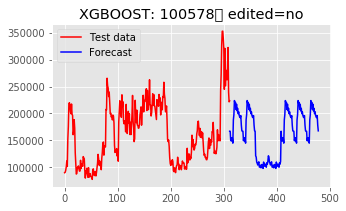


Forecasting from Cold Start Data:  72%|███████▏  | 447/625 [06:08<03:01,  1.02s/it]

102671 <class 'numpy.ndarray'>
Last day observed: Monday 	 9 / 1 / 2017
work day avg= 121861.02381767712 	 off day avg= 87207.11395895208
[102671 'xx-large' 'low' False False False False False True True]


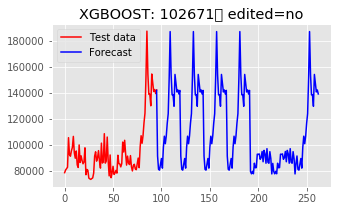


Forecasting from Cold Start Data:  72%|███████▏  | 448/625 [06:09<02:41,  1.10it/s]

100240 <class 'numpy.ndarray'>
Last day observed: Sunday 	 7 / 5 / 2017
work day avg= 207943.22701346342 	 off day avg= 114067.05457725881
[100240 'xx-large' 'low' False False False False False True True]


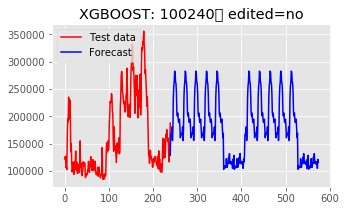


Forecasting from Cold Start Data:  72%|███████▏  | 449/625 [06:10<02:57,  1.01s/it]

103095 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 29 / 8 / 2017
work day avg= 176420.11049145763 	 off day avg= 110431.25912196292
[103095 'xx-large' 'low' False False False False False True True]


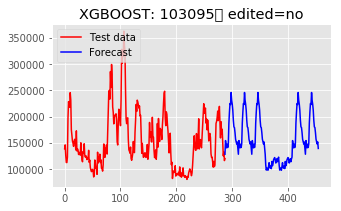


Forecasting from Cold Start Data:  72%|███████▏  | 450/625 [06:11<02:45,  1.06it/s]

102760 <class 'numpy.ndarray'>
Last day observed: Monday 	 16 / 10 / 2017
work day avg= 196470.3496206544 	 off day avg= 140571.04046313153
[102760 'xx-large' 'low' False False False False False True True]


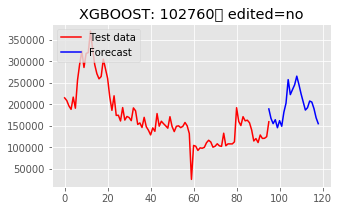


Forecasting from Cold Start Data:  72%|███████▏  | 451/625 [06:12<02:22,  1.22it/s]

100274 <class 'numpy.ndarray'>
Last day observed: Saturday 	 20 / 6 / 2015
work day avg= 302176.67367130885 	 off day avg= 49768.28629528698
[100274 'xx-large' 'low' False False False False False True True]


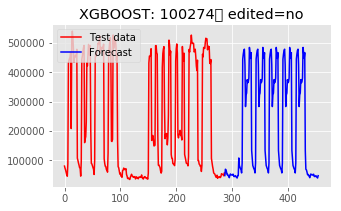


Forecasting from Cold Start Data:  72%|███████▏  | 452/625 [06:13<02:48,  1.03it/s]

102103 <class 'numpy.ndarray'>
Last day observed: Saturday 	 10 / 10 / 2015
work day avg= 323133.56115585857 	 off day avg= 99349.95518695613
[102103 'xx-large' 'low' False False False False False True True]


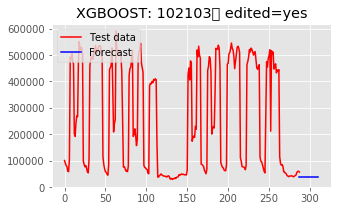


Forecasting from Cold Start Data:  72%|███████▏  | 453/625 [06:14<03:02,  1.06s/it]

100205 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 1 / 12 / 2015
work day avg= 295369.15124259307 	 off day avg= 43391.192145568006
[100205 'xx-large' 'low' False False False False False True True]


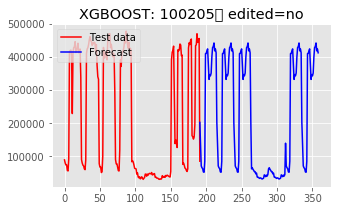


Forecasting from Cold Start Data:  73%|███████▎  | 454/625 [06:15<02:54,  1.02s/it]

103366 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 13 / 7 / 2016
work day avg= 180042.26470940333 	 off day avg= 73900.62412292052
[103366 'xx-large' 'low' False False False False False True True]


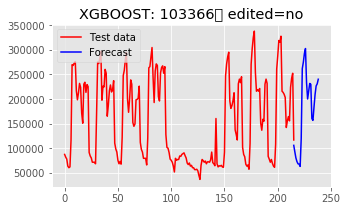


Forecasting from Cold Start Data:  73%|███████▎  | 455/625 [06:16<02:55,  1.03s/it]

100692 <class 'numpy.ndarray'>
Last day observed: Saturday 	 3 / 9 / 2016
work day avg= 168273.15978403206 	 off day avg= 64293.04689861601
[100692 'xx-large' 'low' False False False False False True True]


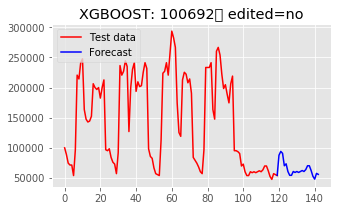


Forecasting from Cold Start Data:  73%|███████▎  | 456/625 [06:17<02:41,  1.05it/s]

101610 <class 'numpy.ndarray'>
Last day observed: Friday 	 23 / 12 / 2016
work day avg= 180824.19440235748 	 off day avg= nan
[101610 'xx-large' 'low' False False False False False True True]


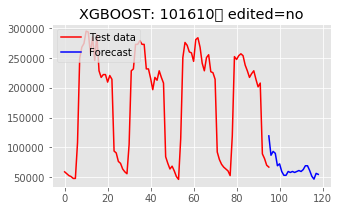


Forecasting from Cold Start Data:  73%|███████▎  | 457/625 [06:17<02:03,  1.36it/s]

103170 <class 'numpy.ndarray'>
Last day observed: Thursday 	 16 / 2 / 2017
work day avg= 22052.12064200068 	 off day avg= 22052.120642000587
[103170 'x-small' 'low' False False False False False True True]


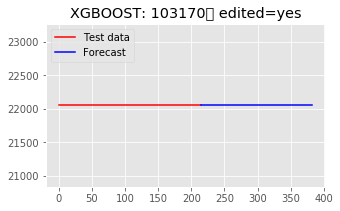


Forecasting from Cold Start Data:  73%|███████▎  | 458/625 [06:18<01:47,  1.55it/s]

100933 <class 'numpy.ndarray'>
Last day observed: Friday 	 26 / 5 / 2017
work day avg= 47094.62947221976 	 off day avg= 38535.64030876973
[100933 'x-small' 'low' False False False False False True True]


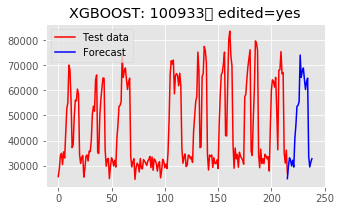


Forecasting from Cold Start Data:  73%|███████▎  | 459/625 [06:19<02:10,  1.27it/s]

101985 <class 'numpy.ndarray'>
Last day observed: Sunday 	 23 / 10 / 2016
work day avg= 202379.7305121459 	 off day avg= 195803.51726361326
[101985 'x-small' 'low' False False False False False False False]


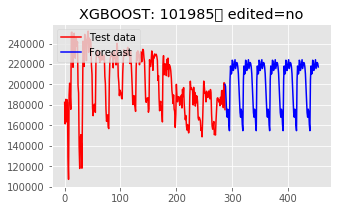


Forecasting from Cold Start Data:  74%|███████▎  | 460/625 [06:20<02:38,  1.04it/s]

100747 <class 'numpy.ndarray'>
Last day observed: Monday 	 10 / 4 / 2017
work day avg= 151561.13737772754 	 off day avg= 151038.208295784
[100747 'x-small' 'low' False False False False False False False]


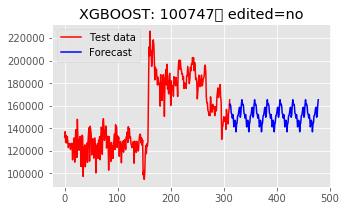


Forecasting from Cold Start Data:  74%|███████▍  | 461/625 [06:22<03:02,  1.11s/it]

102837 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 24 / 5 / 2017
work day avg= 216985.91974085604 	 off day avg= nan
[102837 'x-small' 'low' False False False False False False False]


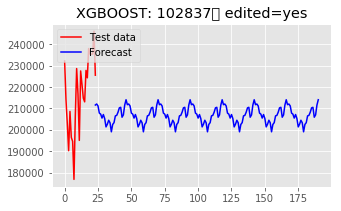


Forecasting from Cold Start Data:  74%|███████▍  | 462/625 [06:22<02:20,  1.16it/s]

100531 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 25 / 7 / 2017
work day avg= 210063.63213504685 	 off day avg= 173271.26060767355
[100531 'x-small' 'low' False False False False False False False]


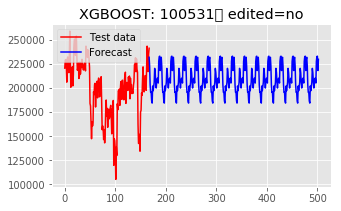


Forecasting from Cold Start Data:  74%|███████▍  | 463/625 [06:23<02:20,  1.16it/s]

101937 <class 'numpy.ndarray'>
Last day observed: Sunday 	 17 / 9 / 2017
work day avg= 225299.31156059768 	 off day avg= 208054.4864127203
[101937 'x-small' 'low' False False False False False False False]


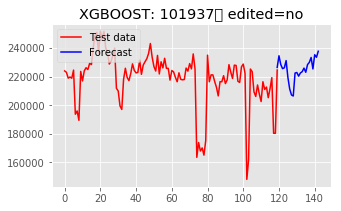


Forecasting from Cold Start Data:  74%|███████▍  | 464/625 [06:24<02:14,  1.20it/s]

102248 <class 'numpy.ndarray'>
Last day observed: Sunday 	 12 / 11 / 2017
work day avg= 138109.0312234268 	 off day avg= 145968.33609841578
[102248 'x-small' 'low' False False False False False False False]


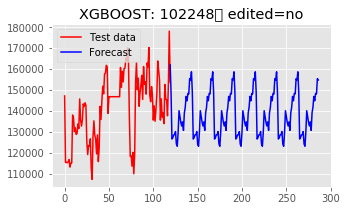


Forecasting from Cold Start Data:  74%|███████▍  | 465/625 [06:24<02:12,  1.21it/s]

101184 <class 'numpy.ndarray'>
Last day observed: Sunday 	 16 / 7 / 2017
work day avg= nan 	 off day avg= 70358.06878686132
[101184 'small' 'low' False False False False False True True]


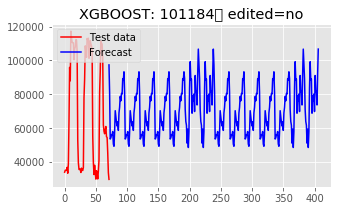


Forecasting from Cold Start Data:  75%|███████▍  | 466/625 [06:25<01:53,  1.40it/s]

103052 <class 'numpy.ndarray'>
Last day observed: Thursday 	 16 / 11 / 2017
work day avg= 59765.361603732905 	 off day avg= 53874.012092396566
[103052 'small' 'low' False False False False False True True]


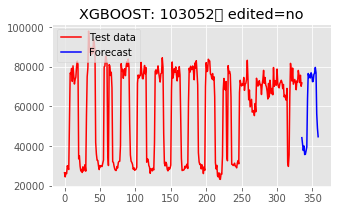


Forecasting from Cold Start Data:  75%|███████▍  | 467/625 [06:26<02:30,  1.05it/s]

102365 <class 'numpy.ndarray'>
Last day observed: Monday 	 27 / 3 / 2017
work day avg= 17208.840410079807 	 off day avg= 17678.026980035418
[102365 'small' 'low' False False False False False True True]


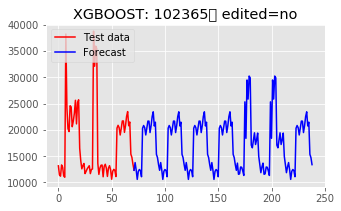


Forecasting from Cold Start Data:  75%|███████▍  | 468/625 [06:27<02:04,  1.26it/s]

101823 <class 'numpy.ndarray'>
Last day observed: Monday 	 24 / 10 / 2016
work day avg= 44224.53614559505 	 off day avg= 35290.86956203595
[101823 'x-small' 'low' False False False False False True True]


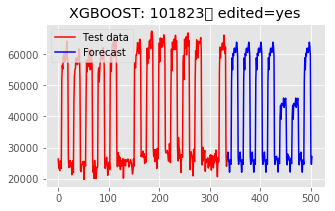


Forecasting from Cold Start Data:  75%|███████▌  | 469/625 [06:28<02:37,  1.01s/it]

100128 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 15 / 5 / 2013
work day avg= 12329.190520900826 	 off day avg= nan
[100128 'small' 'low' False False False False False True True]


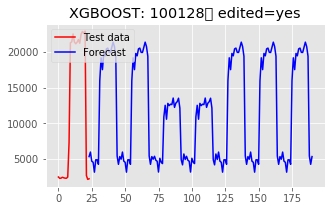


Forecasting from Cold Start Data:  75%|███████▌  | 470/625 [06:29<02:01,  1.28it/s]

100398 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 6 / 11 / 2013
work day avg= 10273.754360621417 	 off day avg= 9088.06308388873
[100398 'small' 'low' False False False False False True True]


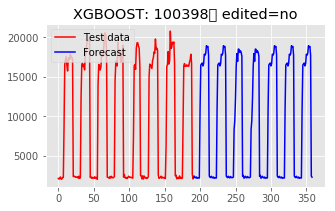


Forecasting from Cold Start Data:  75%|███████▌  | 471/625 [06:30<02:14,  1.15it/s]

103336 <class 'numpy.ndarray'>
Last day observed: Saturday 	 14 / 6 / 2014
work day avg= 14270.840293756279 	 off day avg= 14375.061200681608
[103336 'small' 'low' False False False False False True True]


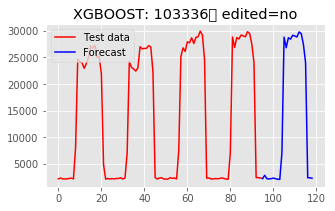


Forecasting from Cold Start Data:  76%|███████▌  | 472/625 [06:30<02:02,  1.25it/s]

103551 <class 'numpy.ndarray'>
Last day observed: Saturday 	 11 / 6 / 2016
work day avg= 4902.3937367159215 	 off day avg= 4458.635663804178
[103551 'small' 'low' False False False False False True True]


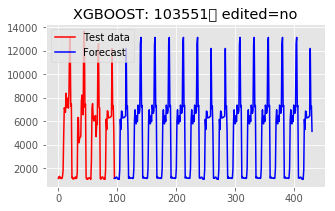


Forecasting from Cold Start Data:  76%|███████▌  | 473/625 [06:31<01:54,  1.33it/s]

102421 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 11 / 9 / 2013
work day avg= 16414.897166250972 	 off day avg= 11045.882552524097
[102421 'small' 'low' False False False False False True True]


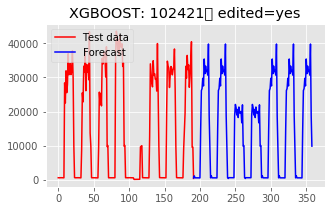


Forecasting from Cold Start Data:  76%|███████▌  | 474/625 [06:32<02:04,  1.21it/s]

102527 <class 'numpy.ndarray'>
Last day observed: Saturday 	 26 / 4 / 2014
work day avg= 5518.994438761147 	 off day avg= 2682.7093031130266
[102527 'small' 'low' False False False False False True True]


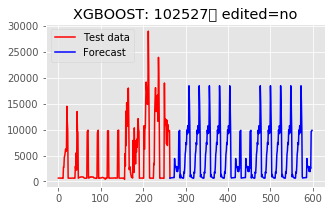


Forecasting from Cold Start Data:  76%|███████▌  | 475/625 [06:33<01:59,  1.26it/s]

102128 <class 'numpy.ndarray'>
Last day observed: Thursday 	 27 / 11 / 2014
work day avg= 31213.025359218882 	 off day avg= nan
[102128 'xx-small' 'low' False False False False False True True]


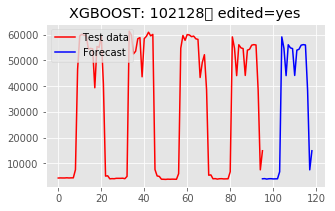


Forecasting from Cold Start Data:  76%|███████▌  | 476/625 [06:33<01:33,  1.59it/s]

102743 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 5 / 2015
work day avg= 23279.84391703903 	 off day avg= 22394.01623831864
[102743 'xx-small' 'low' False False False False False True True]


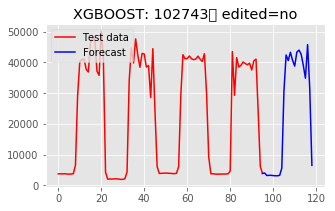


Forecasting from Cold Start Data:  76%|███████▋  | 477/625 [06:33<01:33,  1.59it/s]

101950 <class 'numpy.ndarray'>
Last day observed: Thursday 	 9 / 7 / 2015
work day avg= 18959.367263997992 	 off day avg= nan
[101950 'xx-small' 'low' False False False False False True True]


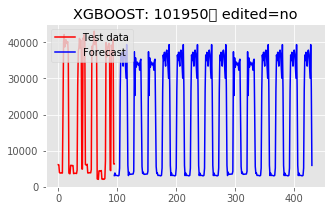


Forecasting from Cold Start Data:  76%|███████▋  | 478/625 [06:34<01:16,  1.92it/s]

101214 <class 'numpy.ndarray'>
Last day observed: Friday 	 7 / 7 / 2017
work day avg= 23588.214331327246 	 off day avg= nan
[101214 'xx-small' 'low' False False False False False True True]


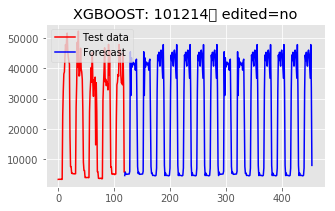


Forecasting from Cold Start Data:  77%|███████▋  | 479/625 [06:34<01:05,  2.23it/s]

101267 <class 'numpy.ndarray'>
Last day observed: Sunday 	 5 / 11 / 2017
work day avg= 15841.260194038467 	 off day avg= 7526.633913212208
[101267 'xx-small' 'low' False False False False False True True]


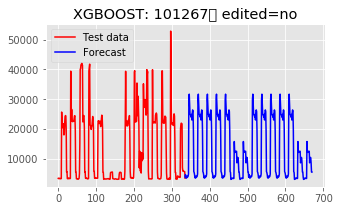


Forecasting from Cold Start Data:  77%|███████▋  | 480/625 [06:35<01:46,  1.36it/s]

100090 <class 'numpy.ndarray'>
Last day observed: Thursday 	 7 / 1 / 2016
work day avg= 12397.97561580973 	 off day avg= nan
[100090 'small' 'low' False False False False False True True]


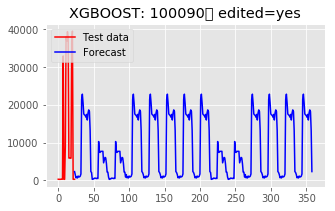


Forecasting from Cold Start Data:  77%|███████▋  | 481/625 [06:36<01:26,  1.67it/s]

102170 <class 'numpy.ndarray'>
Last day observed: Thursday 	 20 / 3 / 2014
work day avg= 20187.854588583716 	 off day avg= 8629.789503892185
[102170 'small' 'low' False False False False False True True]


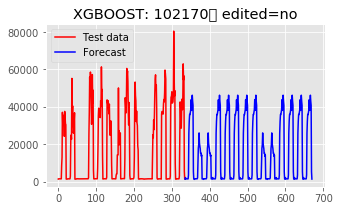


Forecasting from Cold Start Data:  77%|███████▋  | 482/625 [06:37<01:43,  1.38it/s]

103545 <class 'numpy.ndarray'>
Last day observed: Sunday 	 12 / 11 / 2017
work day avg= 12321.545085245772 	 off day avg= 6565.087615890196
[103545 'xx-small' 'low' False False False False False True True]


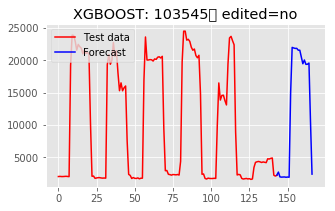


Forecasting from Cold Start Data:  77%|███████▋  | 483/625 [06:38<01:47,  1.32it/s]

101777 <class 'numpy.ndarray'>
Last day observed: Friday 	 12 / 7 / 2013
work day avg= 7462.70803309201 	 off day avg= nan
[101777 'x-small' 'low' False False False False False True True]


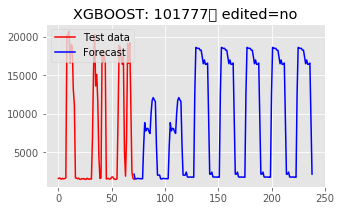


Forecasting from Cold Start Data:  77%|███████▋  | 484/625 [06:38<01:32,  1.53it/s]

100570 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 7 / 1 / 2014
work day avg= 5447.676020880851 	 off day avg= 2678.534932519542
[100570 'x-small' 'low' False False False False False True True]


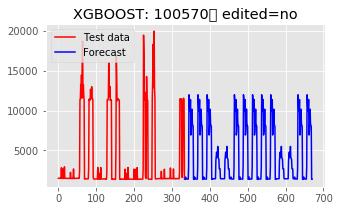


Forecasting from Cold Start Data:  78%|███████▊  | 485/625 [06:39<01:38,  1.42it/s]

100810 <class 'numpy.ndarray'>
Last day observed: Monday 	 3 / 3 / 2014
work day avg= 5977.37977658708 	 off day avg= 2979.1166527214227
[100810 'x-small' 'low' False False False False False True True]


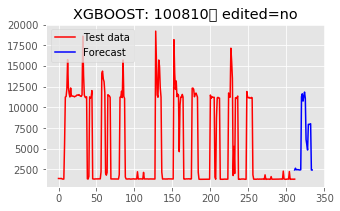


Forecasting from Cold Start Data:  78%|███████▊  | 486/625 [06:40<01:48,  1.28it/s]

101421 <class 'numpy.ndarray'>
Last day observed: Friday 	 6 / 11 / 2015
work day avg= 5951.185735563922 	 off day avg= 5498.807054381053
[101421 'x-small' 'low' False False False False False True True]


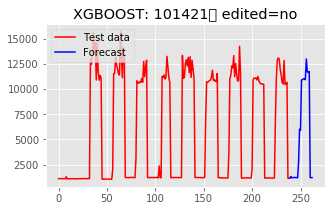


Forecasting from Cold Start Data:  78%|███████▊  | 487/625 [06:41<01:53,  1.21it/s]

101844 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 1 / 2016
work day avg= 6569.786659164044 	 off day avg= 1801.1547734697592
[101844 'x-small' 'low' False False False False False True True]


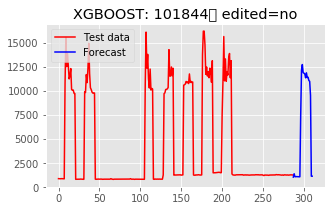


Forecasting from Cold Start Data:  78%|███████▊  | 488/625 [06:42<02:13,  1.02it/s]

101322 <class 'numpy.ndarray'>
Last day observed: Sunday 	 28 / 2 / 2016
work day avg= 3633.245732117677 	 off day avg= 2058.6761964090897
[101322 'x-small' 'low' False False False False False True True]


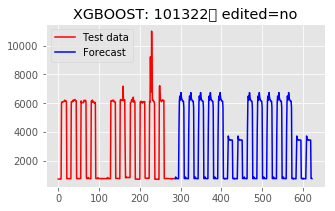


Forecasting from Cold Start Data:  78%|███████▊  | 489/625 [06:43<02:27,  1.08s/it]

100049 <class 'numpy.ndarray'>
Last day observed: Sunday 	 19 / 3 / 2017
work day avg= 4471.940926099196 	 off day avg= 2419.32187453378
[100049 'x-small' 'low' False False False False False True True]


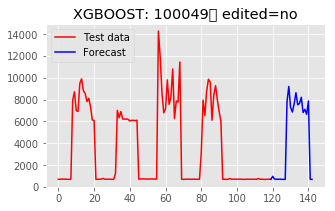


Forecasting from Cold Start Data:  78%|███████▊  | 490/625 [06:44<02:05,  1.07it/s]

102171 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 8 / 10 / 2013
work day avg= 3313.256277692504 	 off day avg= 1719.4860296146944
[102171 'x-small' 'low' False False False False False True True]


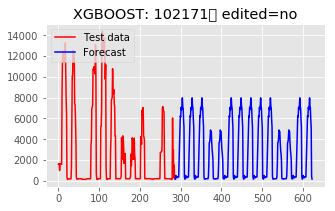


Forecasting from Cold Start Data:  79%|███████▊  | 491/625 [06:45<02:07,  1.05it/s]

100010 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 3 / 12 / 2013
work day avg= 1388.094625112135 	 off day avg= 559.5955586265773
[100010 'x-small' 'low' False False False False False True True]


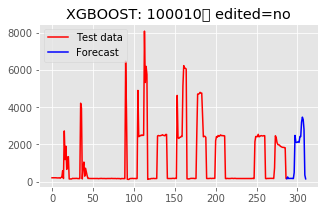


Forecasting from Cold Start Data:  79%|███████▊  | 492/625 [06:46<01:55,  1.16it/s]

101904 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 29 / 10 / 2014
work day avg= 380.1895185261965 	 off day avg= 190.4236429296434
[101904 'x-small' 'low' False False False False False True True]


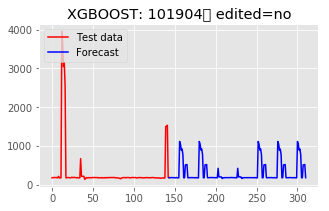


Forecasting from Cold Start Data:  79%|███████▉  | 493/625 [06:46<01:34,  1.40it/s]

102957 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 14 / 4 / 2015
work day avg= 1101.8699108151097 	 off day avg= 510.7563341446221
[102957 'x-small' 'low' False False False False False True True]


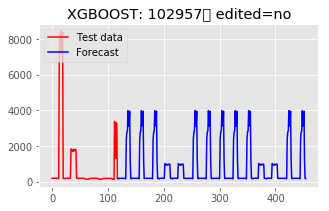


Forecasting from Cold Start Data:  79%|███████▉  | 494/625 [06:46<01:20,  1.63it/s]

101465 <class 'numpy.ndarray'>
Last day observed: Thursday 	 6 / 8 / 2015
work day avg= 9421.201511852443 	 off day avg= 2870.661083439365
[101465 'x-small' 'low' False False False False False True True]


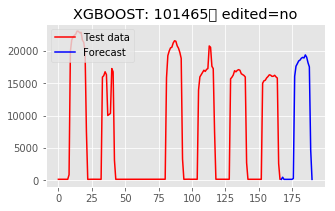


Forecasting from Cold Start Data:  79%|███████▉  | 495/625 [06:47<01:31,  1.42it/s]

102711 <class 'numpy.ndarray'>
Last day observed: Friday 	 21 / 10 / 2016
work day avg= 392.3582141883671 	 off day avg= nan
[102711 'x-small' 'low' False False False False False True True]


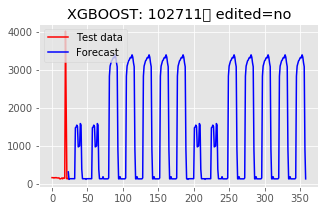


Forecasting from Cold Start Data:  79%|███████▉  | 496/625 [06:48<01:14,  1.73it/s]

102239 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 2 / 2017
work day avg= 3613.4448443315923 	 off day avg= 1554.3042080923915
[102239 'x-small' 'low' False False False False False True True]


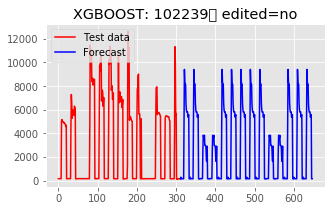


Forecasting from Cold Start Data:  80%|███████▉  | 497/625 [06:49<01:42,  1.24it/s]

100974 <class 'numpy.ndarray'>
Last day observed: Saturday 	 8 / 4 / 2017
work day avg= 934.0296129882336 	 off day avg= 1144.5151595771313
[100974 'x-small' 'low' False False False False False True True]


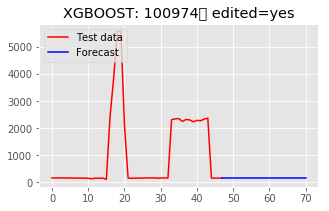


Forecasting from Cold Start Data:  80%|███████▉  | 498/625 [06:49<01:21,  1.56it/s]

102771 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 2 / 8 / 2017
work day avg= 5824.486979638001 	 off day avg= 3744.5378738164914
[102771 'x-small' 'low' False False False False False True True]


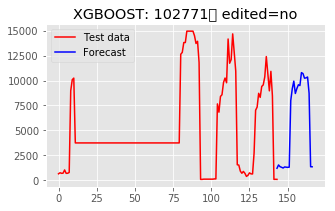


Forecasting from Cold Start Data:  80%|███████▉  | 499/625 [06:50<01:24,  1.50it/s]

100338 <class 'numpy.ndarray'>
Last day observed: Friday 	 7 / 2 / 2014
work day avg= 120687.66778284044 	 off day avg= 67375.34053972922
[100338 'medium' 'low' False False False False False True True]


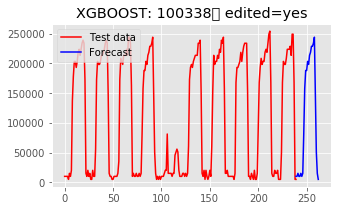


Forecasting from Cold Start Data:  80%|████████  | 500/625 [06:51<01:41,  1.24it/s]

102489 <class 'numpy.ndarray'>
Last day observed: Thursday 	 22 / 5 / 2014
work day avg= 204986.29551002523 	 off day avg= nan
[102489 'medium' 'low' False False False False False True True]


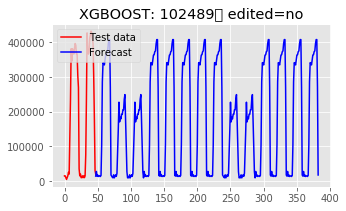


Forecasting from Cold Start Data:  80%|████████  | 501/625 [06:51<01:26,  1.43it/s]

102474 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 29 / 7 / 2014
work day avg= 267064.8325482034 	 off day avg= 193704.10405172152
[102474 'medium' 'low' False False False False False True True]


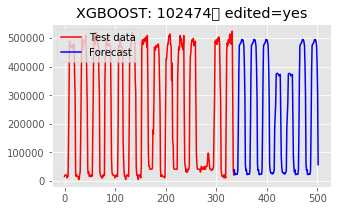


Forecasting from Cold Start Data:  80%|████████  | 502/625 [06:53<01:57,  1.05it/s]

102192 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 10 / 9 / 2014
work day avg= 248737.89243283682 	 off day avg= nan
[102192 'medium' 'low' False False False False False True True]


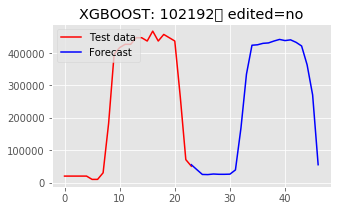


Forecasting from Cold Start Data:  80%|████████  | 503/625 [06:53<01:29,  1.36it/s]

101024 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 27 / 1 / 2016
work day avg= 132366.69575948035 	 off day avg= nan
[101024 'medium' 'low' False False False False False True True]


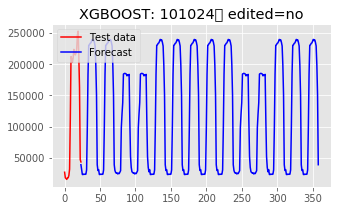


Forecasting from Cold Start Data:  81%|████████  | 504/625 [06:54<01:14,  1.63it/s]

103149 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 14 / 6 / 2017
work day avg= 96000.45314609539 	 off day avg= nan
[103149 'medium' 'low' False False False False False True True]


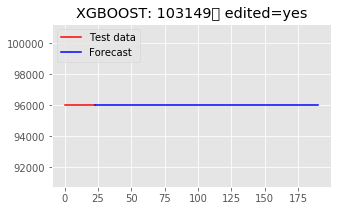


Forecasting from Cold Start Data:  81%|████████  | 505/625 [06:54<01:01,  1.96it/s]

102127 <class 'numpy.ndarray'>
Last day observed: Friday 	 11 / 8 / 2017
work day avg= 133161.64002899313 	 off day avg= nan
[102127 'medium' 'low' False False False False False True True]


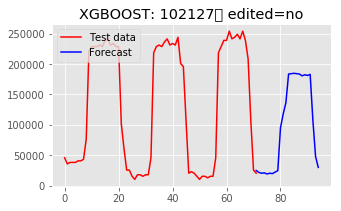


Forecasting from Cold Start Data:  81%|████████  | 506/625 [06:54<00:50,  2.38it/s]

100492 <class 'numpy.ndarray'>
Last day observed: Thursday 	 14 / 8 / 2014
work day avg= 31075.757837497134 	 off day avg= 2658.436697400408
[100492 'medium' 'low' False False False False False True True]


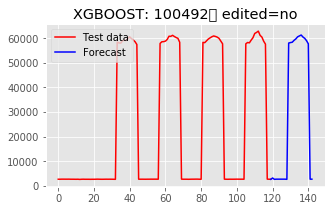


Forecasting from Cold Start Data:  81%|████████  | 507/625 [06:54<00:49,  2.38it/s]

103628 <class 'numpy.ndarray'>
Last day observed: Saturday 	 31 / 1 / 2015
work day avg= 12653.363132372084 	 off day avg= 8427.867066334613
[103628 'medium' 'low' False False False False False True True]


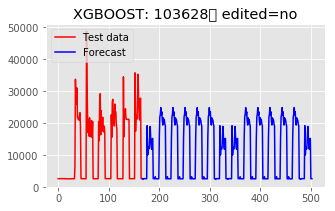


Forecasting from Cold Start Data:  81%|████████▏ | 508/625 [06:55<00:53,  2.18it/s]

101431 <class 'numpy.ndarray'>
Last day observed: Monday 	 23 / 3 / 2015
work day avg= 13640.772251577699 	 off day avg= 2659.5103794268216
[101431 'medium' 'low' False False False False False True True]


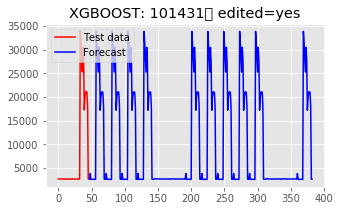


Forecasting from Cold Start Data:  81%|████████▏ | 509/625 [06:55<00:53,  2.16it/s]

100071 <class 'numpy.ndarray'>
Last day observed: Friday 	 27 / 6 / 2014
work day avg= 26981.930799802805 	 off day avg= 11186.161205071432
[100071 'x-small' 'low' False False False False False True True]


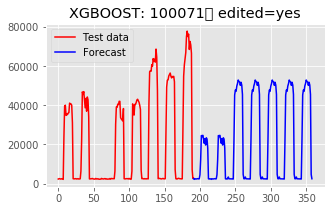


Forecasting from Cold Start Data:  82%|████████▏ | 510/625 [06:57<01:13,  1.56it/s]

103326 <class 'numpy.ndarray'>
Last day observed: Thursday 	 18 / 12 / 2014
work day avg= 5612.2768230124375 	 off day avg= 4758.021429217886
[103326 'x-small' 'low' False False False False False True True]


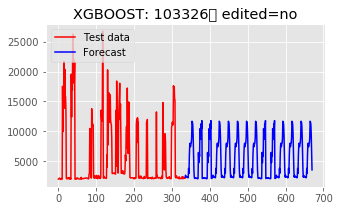


Forecasting from Cold Start Data:  82%|████████▏ | 511/625 [06:57<01:23,  1.36it/s]

103439 <class 'numpy.ndarray'>
Last day observed: Friday 	 29 / 4 / 2016
work day avg= 5578.695228468394 	 off day avg= 4094.40761568601
[103439 'x-small' 'low' False False False False False True True]


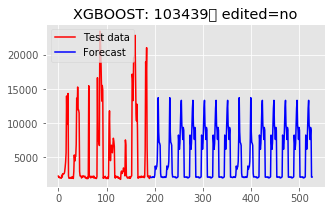


Forecasting from Cold Start Data:  82%|████████▏ | 512/625 [06:58<01:11,  1.58it/s]

102329 <class 'numpy.ndarray'>
Last day observed: Saturday 	 13 / 8 / 2016
work day avg= 23713.699585469556 	 off day avg= 15888.056092846324
[102329 'x-small' 'low' False False False False False True True]


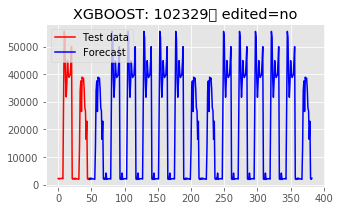


Forecasting from Cold Start Data:  82%|████████▏ | 513/625 [06:58<01:06,  1.69it/s]

100513 <class 'numpy.ndarray'>
Last day observed: Saturday 	 28 / 1 / 2017
work day avg= 19061.328116614954 	 off day avg= 15411.687967994018
[100513 'x-small' 'low' False False False False False True True]


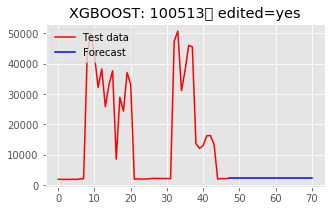


Forecasting from Cold Start Data:  82%|████████▏ | 514/625 [06:59<00:58,  1.91it/s]

101948 <class 'numpy.ndarray'>
Last day observed: Monday 	 3 / 4 / 2017
work day avg= 4049.196440045855 	 off day avg= 2403.7542836225966
[101948 'x-small' 'low' False False False False False True True]


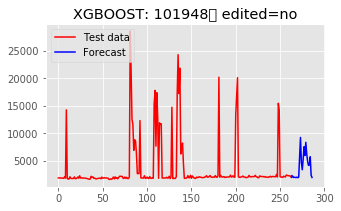


Forecasting from Cold Start Data:  82%|████████▏ | 515/625 [06:59<00:53,  2.06it/s]

103251 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 20 / 9 / 2017
work day avg= 22440.659487679433 	 off day avg= 10015.993563726312
[103251 'x-small' 'low' False False False False False True True]


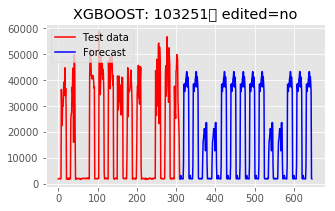


Forecasting from Cold Start Data:  83%|████████▎ | 516/625 [07:00<01:20,  1.36it/s]

103161 <class 'numpy.ndarray'>
Last day observed: Saturday 	 8 / 6 / 2013
work day avg= 24148.63700445075 	 off day avg= 16290.142500751264
[103161 'medium' 'low' False False False False False True True]


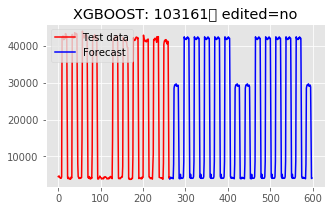


Forecasting from Cold Start Data:  83%|████████▎ | 517/625 [07:02<01:32,  1.17it/s]

103107 <class 'numpy.ndarray'>
Last day observed: Thursday 	 1 / 8 / 2013
work day avg= 26018.011814753925 	 off day avg= 14726.592047266255
[103107 'medium' 'low' False False False False False True True]


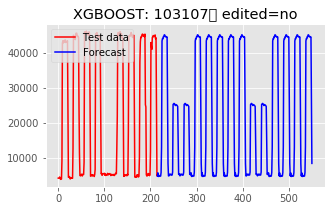


Forecasting from Cold Start Data:  83%|████████▎ | 518/625 [07:03<01:40,  1.06it/s]

102332 <class 'numpy.ndarray'>
Last day observed: Saturday 	 23 / 8 / 2014
work day avg= 22717.287818575645 	 off day avg= 21620.086352051178
[102332 'medium' 'low' False False False False False True True]


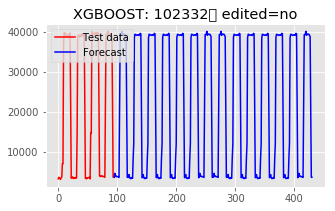


Forecasting from Cold Start Data:  83%|████████▎ | 519/625 [07:03<01:28,  1.19it/s]

100365 <class 'numpy.ndarray'>
Last day observed: Saturday 	 18 / 10 / 2014
work day avg= 23072.382111378112 	 off day avg= 22116.819379623164
[100365 'medium' 'low' False False False False False True True]


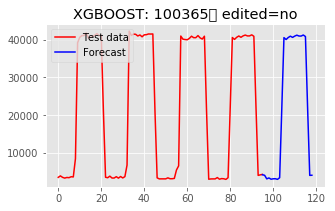


Forecasting from Cold Start Data:  83%|████████▎ | 520/625 [07:04<01:19,  1.33it/s]

101947 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 27 / 5 / 2015
work day avg= 23761.70085090649 	 off day avg= nan
[101947 'medium' 'low' False False False False False True True]


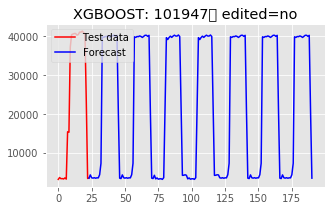


Forecasting from Cold Start Data:  83%|████████▎ | 521/625 [07:04<01:01,  1.70it/s]

103351 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 18 / 11 / 2015
work day avg= 22522.323557985528 	 off day avg= 12102.126273659103
[103351 'medium' 'low' False False False False False True True]


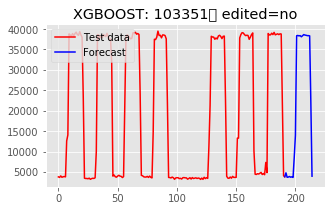


Forecasting from Cold Start Data:  84%|████████▎ | 522/625 [07:05<01:09,  1.47it/s]

103445 <class 'numpy.ndarray'>
Last day observed: Friday 	 16 / 12 / 2016
work day avg= 15572.511359744036 	 off day avg= 13703.662680014211
[103445 'medium' 'low' False False False False False True True]


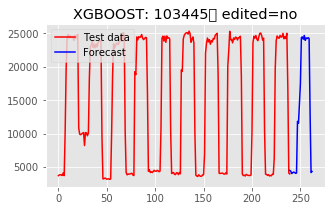


Forecasting from Cold Start Data:  84%|████████▎ | 523/625 [07:06<01:19,  1.28it/s]

101978 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 1 / 2 / 2017
work day avg= 15671.259491731238 	 off day avg= nan
[101978 'medium' 'low' False False False False False True True]


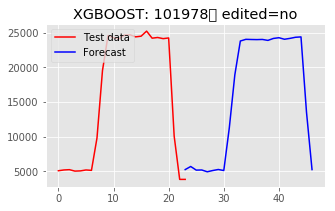


Forecasting from Cold Start Data:  84%|████████▍ | 524/625 [07:06<01:00,  1.67it/s]

103305 <class 'numpy.ndarray'>
Last day observed: Monday 	 5 / 6 / 2017
work day avg= 14641.942570487015 	 off day avg= 9853.08400604052
[103305 'medium' 'low' False False False False False True True]


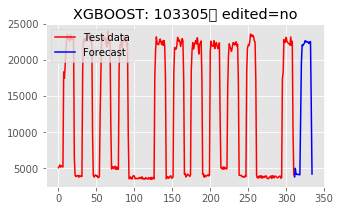


Forecasting from Cold Start Data:  84%|████████▍ | 525/625 [07:07<01:20,  1.25it/s]

103065 <class 'numpy.ndarray'>
Last day observed: Thursday 	 13 / 4 / 2017
work day avg= 11455.089577447545 	 off day avg= 9207.70024280772
[103065 'x-small' 'low' False False False False False True True]


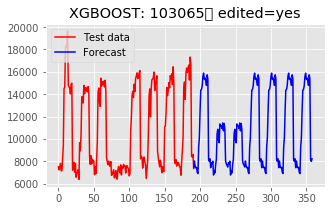


Forecasting from Cold Start Data:  84%|████████▍ | 526/625 [07:08<01:23,  1.18it/s]

101070 <class 'numpy.ndarray'>
Last day observed: Thursday 	 23 / 2 / 2017
work day avg= 23424.61389248785 	 off day avg= 21795.515692306904
[101070 'x-small' 'low' False False False False False False False]


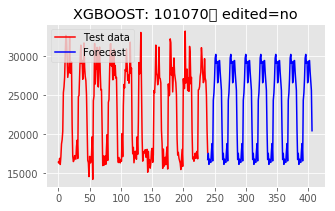


Forecasting from Cold Start Data:  84%|████████▍ | 527/625 [07:09<01:28,  1.11it/s]

100082 <class 'numpy.ndarray'>
Last day observed: Friday 	 6 / 10 / 2017
work day avg= 30672.109246892942 	 off day avg= 29912.894253292314
[100082 'x-small' 'low' False False False False False False False]


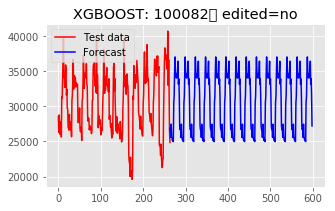


Forecasting from Cold Start Data:  84%|████████▍ | 528/625 [07:11<01:35,  1.02it/s]

101088 <class 'numpy.ndarray'>
Last day observed: Saturday 	 25 / 11 / 2017
work day avg= 24681.97520531039 	 off day avg= 24280.65538117534
[101088 'x-small' 'low' False False False False False False False]


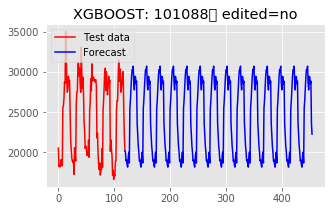


Forecasting from Cold Start Data:  85%|████████▍ | 529/625 [07:11<01:27,  1.10it/s]

103319 <class 'numpy.ndarray'>
Last day observed: Thursday 	 5 / 1 / 2017
work day avg= 21293.201839665457 	 off day avg= 15771.9397150151
[103319 'x-small' 'low' False False False False False True True]


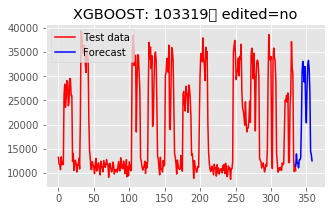


Forecasting from Cold Start Data:  85%|████████▍ | 530/625 [07:13<01:38,  1.04s/it]

101873 <class 'numpy.ndarray'>
Last day observed: Friday 	 4 / 11 / 2016
work day avg= 2051.7149651823565 	 off day avg= 1988.8469867971726
[101873 'small' 'low' False False False False False True True]


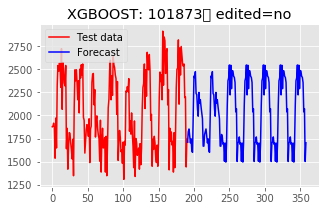


Forecasting from Cold Start Data:  85%|████████▍ | 531/625 [07:14<01:35,  1.01s/it]

100506 <class 'numpy.ndarray'>
Last day observed: Friday 	 23 / 12 / 2016
work day avg= 1781.0128464885056 	 off day avg= nan
[100506 'small' 'low' False False False False False True True]


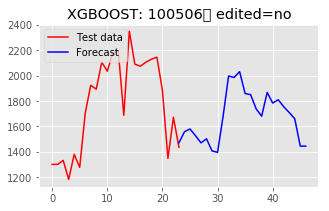


Forecasting from Cold Start Data:  85%|████████▌ | 532/625 [07:14<01:11,  1.31it/s]

100389 <class 'numpy.ndarray'>
Last day observed: Friday 	 14 / 4 / 2017
work day avg= nan 	 off day avg= 2130.0492880539346
[100389 'small' 'low' False False False False False True True]


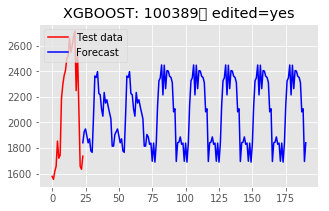


Forecasting from Cold Start Data:  85%|████████▌ | 533/625 [07:14<00:55,  1.65it/s]

102884 <class 'numpy.ndarray'>
Last day observed: Thursday 	 5 / 1 / 2017
work day avg= 716.5550585083911 	 off day avg= 659.6078979304488
[102884 'small' 'low' False False False False False True True]


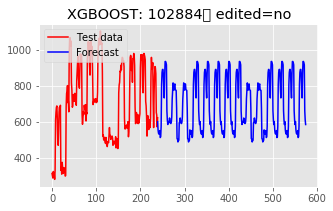


Forecasting from Cold Start Data:  85%|████████▌ | 534/625 [07:15<01:08,  1.33it/s]

102080 <class 'numpy.ndarray'>
Last day observed: Sunday 	 13 / 11 / 2016
work day avg= 15384.122262981351 	 off day avg= 12577.69564142926
[102080 'xx-small' 'low' False False False False False True True]


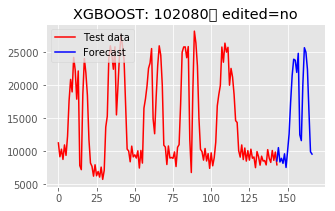


Forecasting from Cold Start Data:  86%|████████▌ | 535/625 [07:16<01:05,  1.37it/s]

102412 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 8 / 3 / 2017
work day avg= 14969.50741955829 	 off day avg= 11091.075068619539
[102412 'xx-small' 'low' False False False False False True True]


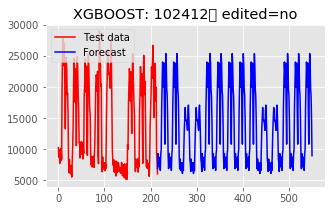


Forecasting from Cold Start Data:  86%|████████▌ | 536/625 [07:17<01:15,  1.18it/s]

101439 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 26 / 4 / 2017
work day avg= 14222.394256965295 	 off day avg= nan
[101439 'xx-small' 'low' False False False False False True True]


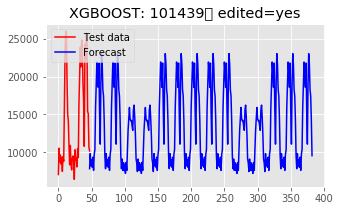


Forecasting from Cold Start Data:  86%|████████▌ | 537/625 [07:17<00:59,  1.48it/s]

100358 <class 'numpy.ndarray'>
Last day observed: Saturday 	 11 / 3 / 2017
work day avg= 17095.678181420833 	 off day avg= 16139.61755387908
[100358 'xx-small' 'low' False False False False False True True]


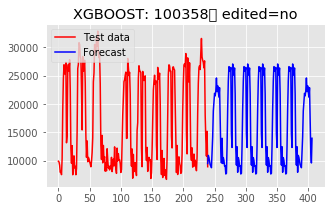


Forecasting from Cold Start Data:  86%|████████▌ | 538/625 [07:18<01:08,  1.28it/s]

102607 <class 'numpy.ndarray'>
Last day observed: Saturday 	 29 / 4 / 2017
work day avg= 16705.121352551272 	 off day avg= 17054.95850041175
[102607 'xx-small' 'low' False False False False False True True]


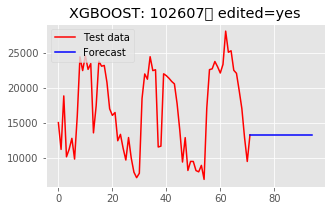


Forecasting from Cold Start Data:  86%|████████▌ | 539/625 [07:19<00:59,  1.45it/s]

100416 <class 'numpy.ndarray'>
Last day observed: Sunday 	 25 / 6 / 2017
work day avg= 30534.024790590553 	 off day avg= 23007.854990581924
[100416 'xx-small' 'low' False False False False False True True]


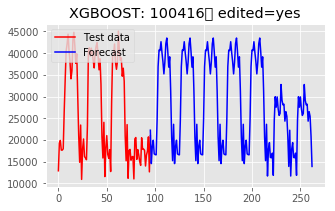


Forecasting from Cold Start Data:  86%|████████▋ | 540/625 [07:19<00:57,  1.49it/s]

100872 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 8 / 2017
work day avg= 27961.098456444342 	 off day avg= 24178.219267060613
[100872 'xx-small' 'low' False False False False False True True]


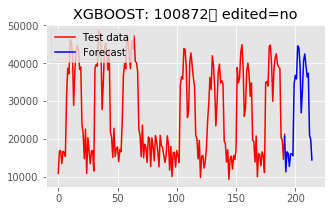


Forecasting from Cold Start Data:  87%|████████▋ | 541/625 [07:20<01:01,  1.36it/s]

103186 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 25 / 10 / 2017
work day avg= 18391.27876161782 	 off day avg= 16448.06061876118
[103186 'xx-small' 'low' False False False False False True True]


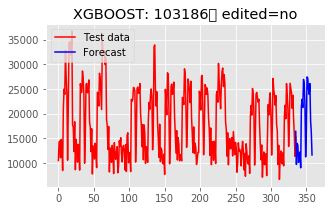


Forecasting from Cold Start Data:  87%|████████▋ | 542/625 [07:22<01:19,  1.04it/s]

100874 <class 'numpy.ndarray'>
Last day observed: Sunday 	 16 / 4 / 2017
work day avg= 1526.7004191826952 	 off day avg= 1889.483758227919
[100874 'medium' 'low' False False False False False True True]


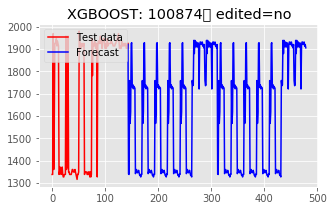


Forecasting from Cold Start Data:  87%|████████▋ | 543/625 [07:23<01:17,  1.06it/s]

100765 <class 'numpy.ndarray'>
Last day observed: Sunday 	 1 / 10 / 2017
work day avg= 823.2893281613724 	 off day avg= 1018.5426388138876
[100765 'medium' 'low' False False False False False True True]


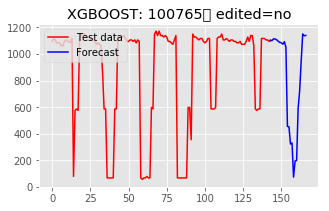


Forecasting from Cold Start Data:  87%|████████▋ | 544/625 [07:23<01:04,  1.25it/s]

103120 <class 'numpy.ndarray'>
Last day observed: Sunday 	 5 / 11 / 2017
work day avg= 2500.6032302048948 	 off day avg= 2367.4283258562427
[103120 'medium' 'low' False False False False False True True]


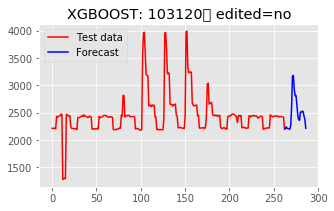


Forecasting from Cold Start Data:  87%|████████▋ | 545/625 [07:24<01:07,  1.18it/s]

100922 <class 'numpy.ndarray'>
Last day observed: Friday 	 9 / 6 / 2017
work day avg= 415.11782394382266 	 off day avg= 415.1178239438222
[100922 'xx-small' 'low' False False False False False True True]


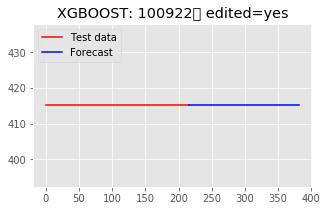


Forecasting from Cold Start Data:  87%|████████▋ | 546/625 [07:24<00:57,  1.37it/s]

102467 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 8 / 8 / 2017
work day avg= 178.31284296944634 	 off day avg= 180.59355517172662
[102467 'xx-small' 'low' False False False False False True True]


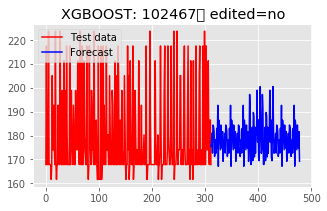


Forecasting from Cold Start Data:  88%|████████▊ | 547/625 [07:26<01:13,  1.06it/s]

101520 <class 'numpy.ndarray'>
Last day observed: Friday 	 24 / 11 / 2017
work day avg= 507.6563185895793 	 off day avg= 501.8286312588316
[101520 'xx-small' 'low' False False False False False True True]


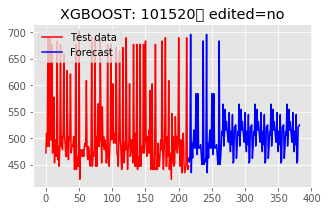


Forecasting from Cold Start Data:  88%|████████▊ | 548/625 [07:27<01:12,  1.06it/s]

103594 <class 'numpy.ndarray'>
Last day observed: Saturday 	 4 / 2 / 2017
work day avg= 21047.944715186597 	 off day avg= 14398.60094590747
[103594 'xx-small' 'low' False False False False False True True]


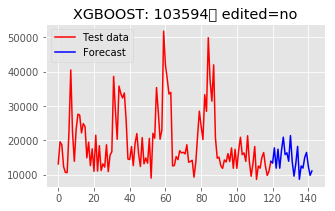


Forecasting from Cold Start Data:  88%|████████▊ | 549/625 [07:27<01:03,  1.20it/s]

101498 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 23 / 5 / 2017
work day avg= 27140.834217187366 	 off day avg= nan
[101498 'xx-small' 'low' False False False False False True True]


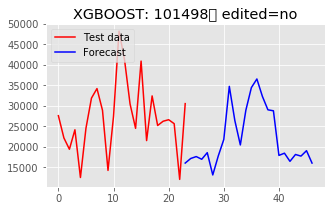


Forecasting from Cold Start Data:  88%|████████▊ | 550/625 [07:28<00:49,  1.53it/s]

103504 <class 'numpy.ndarray'>
Last day observed: Friday 	 21 / 7 / 2017
work day avg= 1034.2807143180908 	 off day avg= nan
[103504 'xx-small' 'low' False False False False False True True]


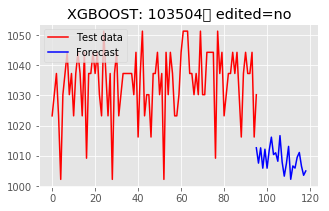


Forecasting from Cold Start Data:  88%|████████▊ | 551/625 [07:28<00:39,  1.90it/s]

103099 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 19 / 9 / 2017
work day avg= 27820.450167606454 	 off day avg= 22632.401152177175
[103099 'xx-small' 'low' False False False False False True True]


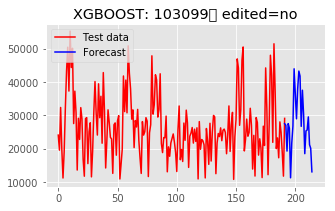


Forecasting from Cold Start Data:  88%|████████▊ | 552/625 [07:28<00:35,  2.08it/s]

101760 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 27 / 1 / 2016
work day avg= 479510.17134937114 	 off day avg= 324159.5414716155
[101760 'large' 'low' False False False False False True True]


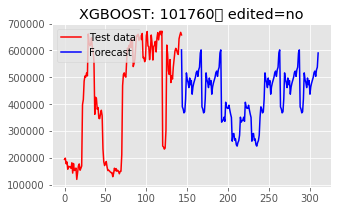


Forecasting from Cold Start Data:  88%|████████▊ | 553/625 [07:29<00:43,  1.67it/s]

102425 <class 'numpy.ndarray'>
Last day observed: Friday 	 20 / 10 / 2017
work day avg= 12489.35675457058 	 off day avg= nan
[102425 'medium' 'low' False False False False False False False]


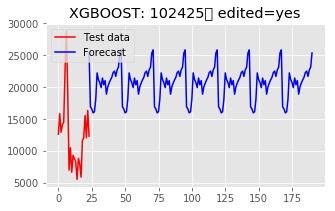


Forecasting from Cold Start Data:  89%|████████▊ | 554/625 [07:30<00:38,  1.84it/s]

102999 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 24 / 1 / 2017
work day avg= 27093.111079007387 	 off day avg= 16574.881170496035
[102999 'x-small' 'low' False False False False False False False]


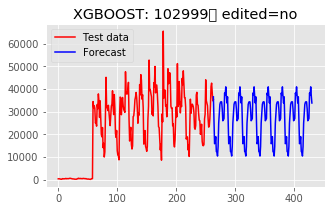


Forecasting from Cold Start Data:  89%|████████▉ | 555/625 [07:31<00:46,  1.51it/s]

100672 <class 'numpy.ndarray'>
Last day observed: Saturday 	 11 / 3 / 2017
work day avg= nan 	 off day avg= 25692.702526609723
[100672 'x-small' 'low' False False False False False False False]


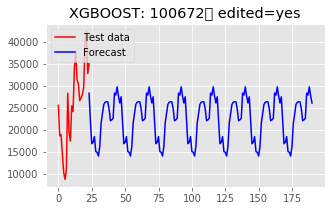


Forecasting from Cold Start Data:  89%|████████▉ | 556/625 [07:31<00:37,  1.82it/s]

100366 <class 'numpy.ndarray'>
Last day observed: Saturday 	 6 / 5 / 2017
work day avg= nan 	 off day avg= 24715.700986245025
[100366 'x-small' 'low' False False False False False False False]


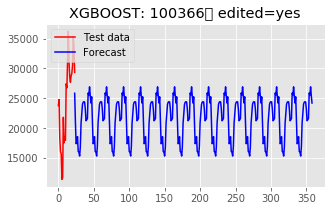


Forecasting from Cold Start Data:  89%|████████▉ | 557/625 [07:31<00:31,  2.13it/s]

103034 <class 'numpy.ndarray'>
Last day observed: Friday 	 7 / 7 / 2017
work day avg= 24819.649964717726 	 off day avg= 25664.70758152008
[103034 'x-small' 'low' False False False False False False False]


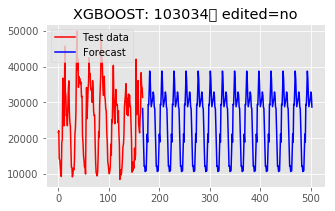


Forecasting from Cold Start Data:  89%|████████▉ | 558/625 [07:32<00:39,  1.70it/s]

100859 <class 'numpy.ndarray'>
Last day observed: Sunday 	 27 / 8 / 2017
work day avg= nan 	 off day avg= 28772.85187091368
[100859 'x-small' 'low' False False False False False False False]


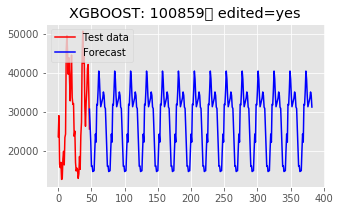


Forecasting from Cold Start Data:  89%|████████▉ | 559/625 [07:32<00:33,  1.97it/s]

100514 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 1 / 11 / 2017
work day avg= 22897.263978193823 	 off day avg= 24245.110367940895
[100514 'x-small' 'low' False False False False False False False]


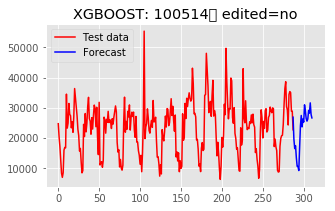


Forecasting from Cold Start Data:  90%|████████▉ | 560/625 [07:34<00:49,  1.33it/s]

102654 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 30 / 5 / 2017
work day avg= 171289.64888132177 	 off day avg= nan
[102654 'x-large' 'low' False False False False False False False]


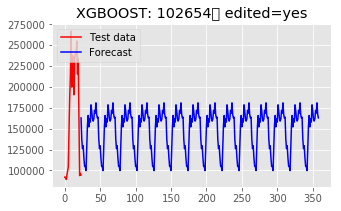


Forecasting from Cold Start Data:  90%|████████▉ | 561/625 [07:34<00:40,  1.59it/s]

101128 <class 'numpy.ndarray'>
Last day observed: Saturday 	 16 / 4 / 2016
work day avg= 44118.0083814104 	 off day avg= 21495.983664041694
[101128 'medium' 'low' False False False False False True True]


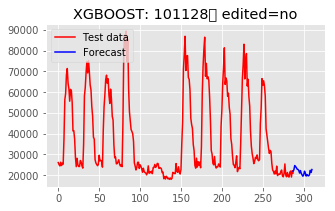


Forecasting from Cold Start Data:  90%|████████▉ | 562/625 [07:35<00:54,  1.17it/s]

103200 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 8 / 6 / 2016
work day avg= 46676.702382783136 	 off day avg= 21645.163315830596
[103200 'medium' 'low' False False False False False True True]


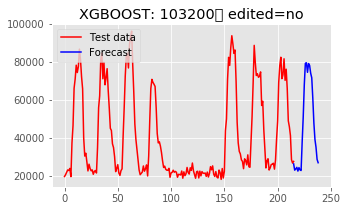


Forecasting from Cold Start Data:  90%|█████████ | 563/625 [07:36<00:56,  1.09it/s]

102611 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 7 / 2016
work day avg= 56966.030672799876 	 off day avg= 27620.71920283356
[102611 'medium' 'low' False False False False False True True]


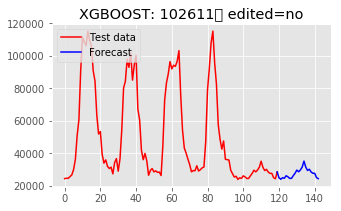


Forecasting from Cold Start Data:  90%|█████████ | 564/625 [07:37<00:52,  1.16it/s]

103478 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 28 / 9 / 2016
work day avg= 41971.646968842 	 off day avg= 21740.18533825719
[103478 'medium' 'low' False False False False False True True]


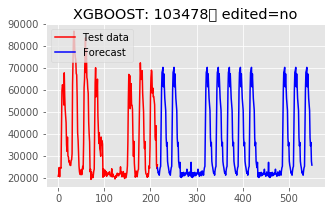


Forecasting from Cold Start Data:  90%|█████████ | 565/625 [07:38<00:56,  1.06it/s]

102289 <class 'numpy.ndarray'>
Last day observed: Sunday 	 27 / 11 / 2016
work day avg= 53622.21646219433 	 off day avg= 21470.463932630064
[102289 'medium' 'low' False False False False False True True]


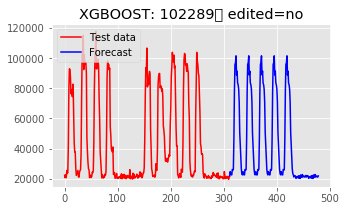


Forecasting from Cold Start Data:  91%|█████████ | 566/625 [07:40<01:03,  1.08s/it]

100845 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 18 / 1 / 2017
work day avg= 63851.93879760531 	 off day avg= 28376.628417508677
[100845 'medium' 'low' False False False False False True True]


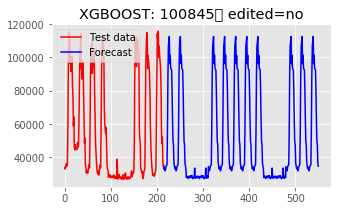


Forecasting from Cold Start Data:  91%|█████████ | 567/625 [07:41<01:03,  1.09s/it]

102010 <class 'numpy.ndarray'>
Last day observed: Sunday 	 19 / 3 / 2017
work day avg= 53510.655392686385 	 off day avg= 24810.266466986544
[102010 'medium' 'low' False False False False False True True]


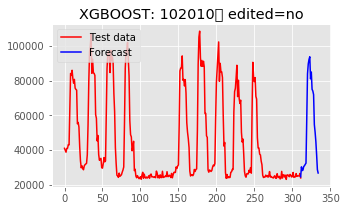


Forecasting from Cold Start Data:  91%|█████████ | 568/625 [07:42<01:07,  1.18s/it]

103078 <class 'numpy.ndarray'>
Last day observed: Friday 	 12 / 5 / 2017
work day avg= 45371.29251140077 	 off day avg= 25627.226100215532
[103078 'medium' 'low' False False False False False True True]


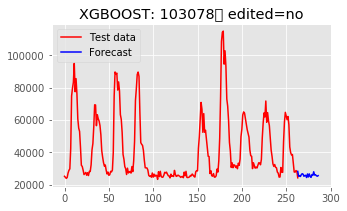


Forecasting from Cold Start Data:  91%|█████████ | 569/625 [07:43<01:03,  1.13s/it]

103267 <class 'numpy.ndarray'>
Last day observed: Saturday 	 8 / 7 / 2017
work day avg= 50990.265084538434 	 off day avg= 29375.098166115582
[103267 'medium' 'low' False False False False False True True]


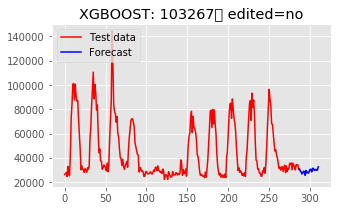


Forecasting from Cold Start Data:  91%|█████████ | 570/625 [07:44<01:03,  1.16s/it]

101427 <class 'numpy.ndarray'>
Last day observed: Thursday 	 24 / 8 / 2017
work day avg= 52024.5846308983 	 off day avg= nan
[101427 'medium' 'low' False False False False False True True]


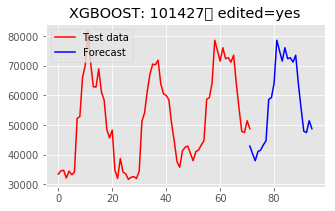


Forecasting from Cold Start Data:  91%|█████████▏| 571/625 [07:45<00:49,  1.10it/s]

102270 <class 'numpy.ndarray'>
Last day observed: Thursday 	 19 / 10 / 2017
work day avg= 48813.42014244633 	 off day avg= nan
[102270 'medium' 'low' False False False False False True True]


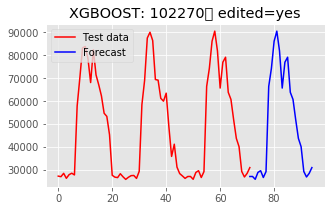


Forecasting from Cold Start Data:  92%|█████████▏| 572/625 [07:45<00:36,  1.44it/s]

103530 <class 'numpy.ndarray'>
Last day observed: Saturday 	 24 / 6 / 2017
work day avg= 51963.66333264062 	 off day avg= 51223.253208750975
[103530 'xx-large' 'low' False False False False False True True]


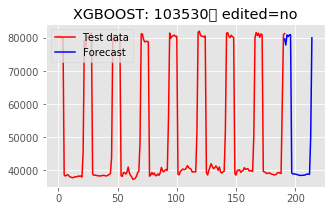


Forecasting from Cold Start Data:  92%|█████████▏| 573/625 [07:46<00:39,  1.32it/s]

102487 <class 'numpy.ndarray'>
Last day observed: Monday 	 14 / 8 / 2017
work day avg= 70930.36093245917 	 off day avg= 71716.71643686395
[102487 'small' 'low' False False False False False False False]


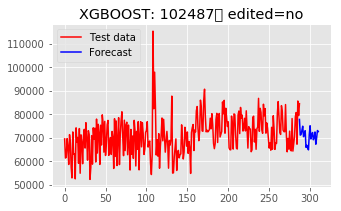


Forecasting from Cold Start Data:  92%|█████████▏| 574/625 [07:46<00:33,  1.53it/s]

101879 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 28 / 7 / 2015
work day avg= 109490.15533306857 	 off day avg= 13782.65585686994
[101879 'medium' 'low' False False False False False True True]


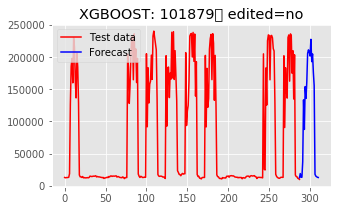


Forecasting from Cold Start Data:  92%|█████████▏| 575/625 [07:47<00:41,  1.20it/s]

103111 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 15 / 9 / 2015
work day avg= 94243.1502340214 	 off day avg= 37776.35543063318
[103111 'medium' 'low' False False False False False True True]


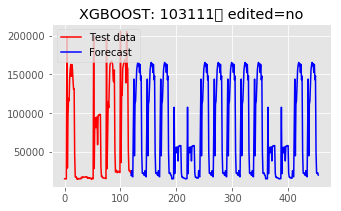


Forecasting from Cold Start Data:  92%|█████████▏| 576/625 [07:48<00:40,  1.21it/s]

102398 <class 'numpy.ndarray'>
Last day observed: Saturday 	 30 / 4 / 2016
work day avg= 30588.537340487976 	 off day avg= 18604.77231633372
[102398 'medium' 'low' False False False False False True True]


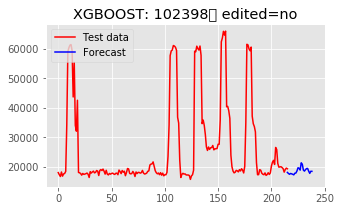


Forecasting from Cold Start Data:  92%|█████████▏| 577/625 [07:49<00:35,  1.36it/s]

103155 <class 'numpy.ndarray'>
Last day observed: Thursday 	 25 / 8 / 2016
work day avg= 110550.55897792403 	 off day avg= 53128.40829071533
[103155 'medium' 'low' False False False False False True True]


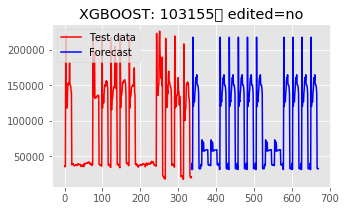


Forecasting from Cold Start Data:  92%|█████████▏| 578/625 [07:50<00:46,  1.02it/s]

102009 <class 'numpy.ndarray'>
Last day observed: Monday 	 6 / 11 / 2017
work day avg= 46524.42879290125 	 off day avg= 23699.73248289281
[102009 'medium' 'low' False False False False False True True]


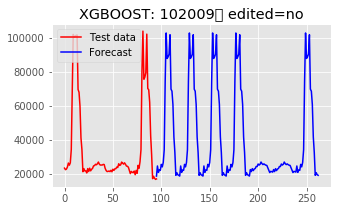


Forecasting from Cold Start Data:  93%|█████████▎| 579/625 [07:51<00:38,  1.20it/s]

102649 <class 'numpy.ndarray'>
Last day observed: Monday 	 28 / 11 / 2016
work day avg= 34736.31458520453 	 off day avg= 23775.56889806122
[102649 'medium' 'low' False False False False False False False]


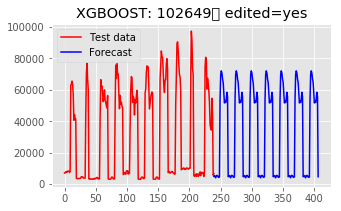


Forecasting from Cold Start Data:  93%|█████████▎| 580/625 [07:52<00:40,  1.10it/s]

100744 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 17 / 1 / 2017
work day avg= 49166.58364120987 	 off day avg= 27712.5687048173
[100744 'medium' 'low' False False False False False False False]


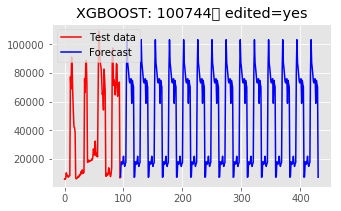


Forecasting from Cold Start Data:  93%|█████████▎| 581/625 [07:53<00:36,  1.19it/s]

102263 <class 'numpy.ndarray'>
Last day observed: Sunday 	 12 / 3 / 2017
work day avg= nan 	 off day avg= 11221.488554286063
[102263 'medium' 'low' False False False False False False False]


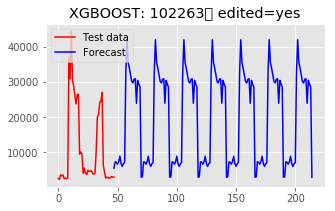


Forecasting from Cold Start Data:  93%|█████████▎| 582/625 [07:53<00:27,  1.54it/s]

101530 <class 'numpy.ndarray'>
Last day observed: Friday 	 19 / 5 / 2017
work day avg= 17274.239113440974 	 off day avg= 11336.212999305548
[101530 'medium' 'low' False False False False False False False]


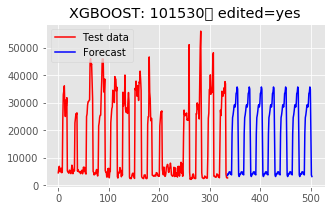


Forecasting from Cold Start Data:  93%|█████████▎| 583/625 [07:54<00:34,  1.22it/s]

103531 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 5 / 7 / 2017
work day avg= 30183.745735907534 	 off day avg= 10179.966999712118
[103531 'medium' 'low' False False False False False False False]


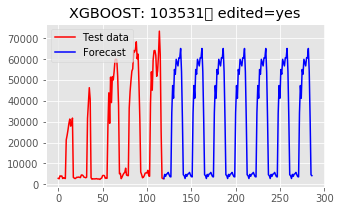


Forecasting from Cold Start Data:  93%|█████████▎| 584/625 [07:55<00:33,  1.23it/s]

102216 <class 'numpy.ndarray'>
Last day observed: Monday 	 28 / 8 / 2017
work day avg= 26909.67882893054 	 off day avg= 2776.3436520881755
[102216 'medium' 'low' False False False False False False False]


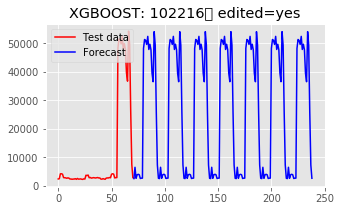


Forecasting from Cold Start Data:  94%|█████████▎| 585/625 [07:55<00:28,  1.40it/s]

102185 <class 'numpy.ndarray'>
Last day observed: Thursday 	 26 / 10 / 2017
work day avg= 19014.796224944515 	 off day avg= 10203.28644983193
[102185 'medium' 'low' False False False False False False False]


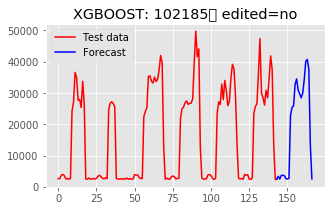


Forecasting from Cold Start Data:  94%|█████████▍| 586/625 [07:56<00:29,  1.34it/s]

100454 <class 'numpy.ndarray'>
Last day observed: Saturday 	 19 / 3 / 2016
work day avg= 362607.70259079884 	 off day avg= 350876.1248053405
[100454 'large' 'low' False False False False False False True]


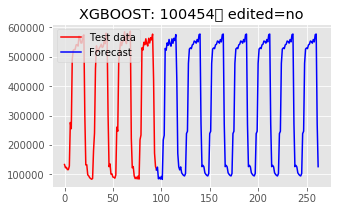


Forecasting from Cold Start Data:  94%|█████████▍| 587/625 [07:57<00:27,  1.38it/s]

101305 <class 'numpy.ndarray'>
Last day observed: Sunday 	 23 / 4 / 2017
work day avg= 366250.21357116225 	 off day avg= 209866.0991533092
[101305 'large' 'low' False False False False False False True]


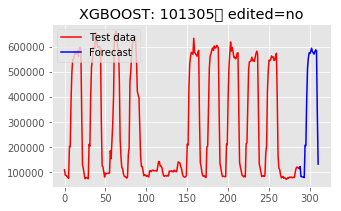


Forecasting from Cold Start Data:  94%|█████████▍| 588/625 [07:58<00:33,  1.11it/s]

103379 <class 'numpy.ndarray'>
Last day observed: Thursday 	 6 / 7 / 2017
work day avg= 387207.47371353547 	 off day avg= 309954.58607072063
[103379 'x-large' 'low' False False False False False False False]


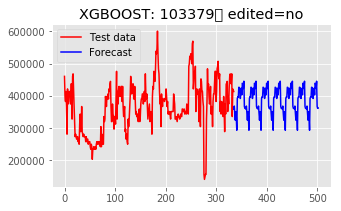


Forecasting from Cold Start Data:  94%|█████████▍| 589/625 [07:59<00:36,  1.00s/it]

101325 <class 'numpy.ndarray'>
Last day observed: Thursday 	 31 / 8 / 2017
work day avg= 371766.65173863893 	 off day avg= 276812.9125672567
[101325 'x-large' 'low' False False False False False False False]


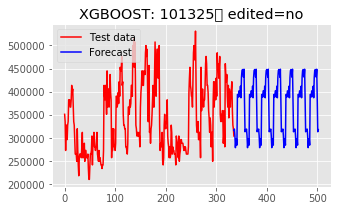


Forecasting from Cold Start Data:  94%|█████████▍| 590/625 [08:01<00:40,  1.16s/it]

103396 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 22 / 3 / 2017
work day avg= 497166.39217666705 	 off day avg= 429947.8664143632
[103396 'xx-large' 'low' False False False False False True True]


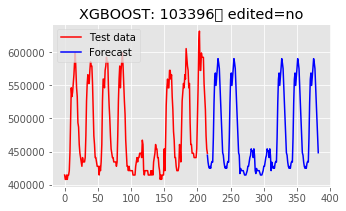


Forecasting from Cold Start Data:  95%|█████████▍| 591/625 [08:02<00:38,  1.13s/it]

103365 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 9 / 5 / 2017
work day avg= 510563.0913670563 	 off day avg= nan
[103365 'xx-large' 'low' False False False False False True True]


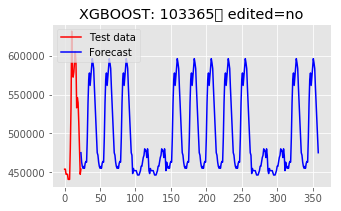


Forecasting from Cold Start Data:  95%|█████████▍| 592/625 [08:02<00:28,  1.15it/s]

100290 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 5 / 7 / 2017
work day avg= 479852.52948031604 	 off day avg= nan
[100290 'xx-large' 'low' False False False False False True True]


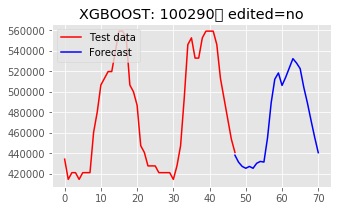


Forecasting from Cold Start Data:  95%|█████████▍| 593/625 [08:02<00:21,  1.49it/s]

101719 <class 'numpy.ndarray'>
Last day observed: Sunday 	 3 / 9 / 2017
work day avg= 462852.0398644423 	 off day avg= 420899.21871559153
[101719 'xx-large' 'low' False False False False False True True]


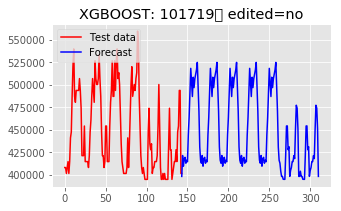


Forecasting from Cold Start Data:  95%|█████████▌| 594/625 [08:03<00:22,  1.39it/s]

100731 <class 'numpy.ndarray'>
Last day observed: Saturday 	 28 / 10 / 2017
work day avg= 488393.90450506564 	 off day avg= 427754.2548510246
[100731 'xx-large' 'low' False False False False False True True]


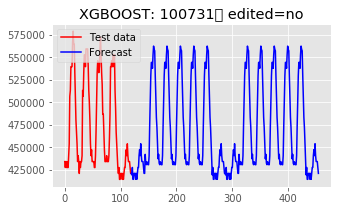


Forecasting from Cold Start Data:  95%|█████████▌| 595/625 [08:04<00:22,  1.36it/s]

101434 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 19 / 8 / 2015
work day avg= 86707.7032716992 	 off day avg= 44006.90974625244
[101434 'large' 'low' False False False False False True True]


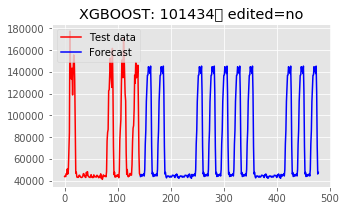


Forecasting from Cold Start Data:  95%|█████████▌| 596/625 [08:05<00:21,  1.34it/s]

101112 <class 'numpy.ndarray'>
Last day observed: Monday 	 16 / 10 / 2017
work day avg= 78009.309013541 	 off day avg= 49711.25352391577
[101112 'large' 'low' False False False False False True True]


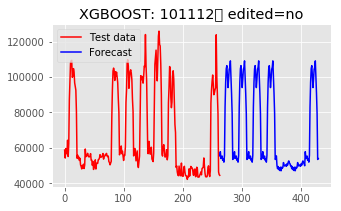


Forecasting from Cold Start Data:  96%|█████████▌| 597/625 [08:06<00:25,  1.11it/s]

100135 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 3 / 5 / 2017
work day avg= 148844.82945930725 	 off day avg= 147675.05077536165
[100135 'small' 'low' False False False False False False False]


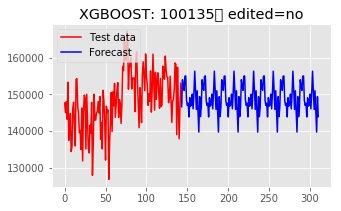


Forecasting from Cold Start Data:  96%|█████████▌| 598/625 [08:07<00:23,  1.14it/s]

101521 <class 'numpy.ndarray'>
Last day observed: Sunday 	 2 / 7 / 2017
work day avg= 183900.74097981188 	 off day avg= 184004.3228111904
[101521 'small' 'low' False False False False False False False]


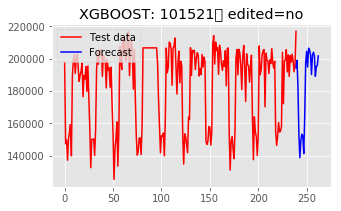


Forecasting from Cold Start Data:  96%|█████████▌| 599/625 [08:07<00:20,  1.29it/s]

100635 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 23 / 8 / 2017
work day avg= 206340.52968523817 	 off day avg= 202807.48749552248
[100635 'small' 'low' False False False False False False False]


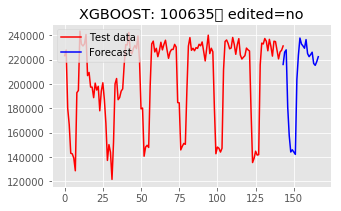


Forecasting from Cold Start Data:  96%|█████████▌| 600/625 [08:08<00:16,  1.48it/s]

101514 <class 'numpy.ndarray'>
Last day observed: Sunday 	 22 / 10 / 2017
work day avg= 145520.95935260833 	 off day avg= 147017.02514068317
[101514 'small' 'low' False False False False False False False]


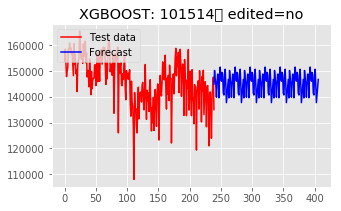


Forecasting from Cold Start Data:  96%|█████████▌| 601/625 [08:09<00:19,  1.26it/s]

101994 <class 'numpy.ndarray'>
Last day observed: Monday 	 27 / 11 / 2017
work day avg= 72874.15792582695 	 off day avg= 77737.57147569228
[101994 'small' 'low' False False False False False True True]


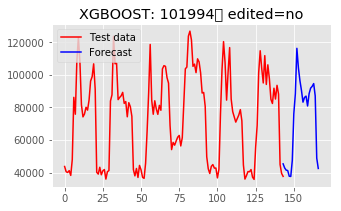


Forecasting from Cold Start Data:  96%|█████████▋| 602/625 [08:10<00:18,  1.24it/s]

103007 <class 'numpy.ndarray'>
Last day observed: Monday 	 29 / 6 / 2015
work day avg= 7641.830389987056 	 off day avg= 112.69857636963327
[103007 'xx-small' 'low' False False False False False True True]


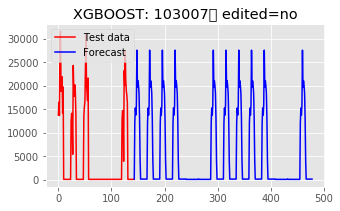


Forecasting from Cold Start Data:  96%|█████████▋| 603/625 [08:11<00:18,  1.21it/s]

101110 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 9 / 8 / 2017
work day avg= 258.8327904322307 	 off day avg= 213.98072668861664
[101110 'large' 'low' False False False False False True True]


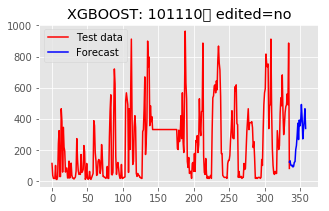


Forecasting from Cold Start Data:  97%|█████████▋| 604/625 [08:12<00:20,  1.03it/s]

100867 <class 'numpy.ndarray'>
Last day observed: Monday 	 17 / 7 / 2017
work day avg= 187755.2677739932 	 off day avg= 172213.1142089555
[100867 'medium' 'low' False False False False False True True]


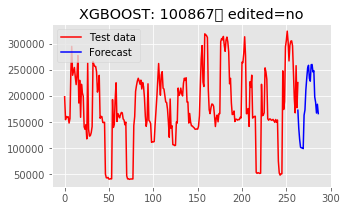


Forecasting from Cold Start Data:  97%|█████████▋| 605/625 [08:13<00:20,  1.03s/it]

101902 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 5 / 9 / 2017
work day avg= 217196.45009412218 	 off day avg= 141841.9991573587
[101902 'medium' 'low' False False False False False True True]


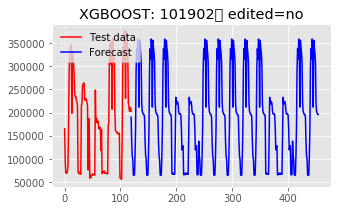


Forecasting from Cold Start Data:  97%|█████████▋| 606/625 [08:14<00:18,  1.02it/s]

101537 <class 'numpy.ndarray'>
Last day observed: Sunday 	 4 / 6 / 2017
work day avg= 16047.77629242917 	 off day avg= 12973.407660009465
[101537 'medium' 'low' False False False False False True True]


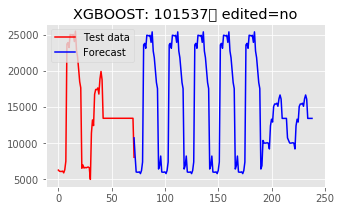


Forecasting from Cold Start Data:  97%|█████████▋| 607/625 [08:15<00:15,  1.17it/s]

103537 <class 'numpy.ndarray'>
Last day observed: Friday 	 4 / 8 / 2017
work day avg= 15674.455621794526 	 off day avg= 9944.490278112498
[103537 'medium' 'low' False False False False False True True]


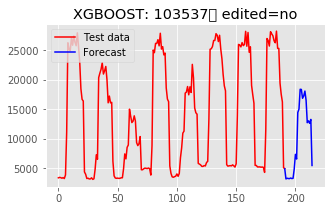


Forecasting from Cold Start Data:  97%|█████████▋| 608/625 [08:15<00:15,  1.13it/s]

100530 <class 'numpy.ndarray'>
Last day observed: Monday 	 25 / 9 / 2017
work day avg= 16846.479747363406 	 off day avg= 10485.275515678155
[100530 'medium' 'low' False False False False False True True]


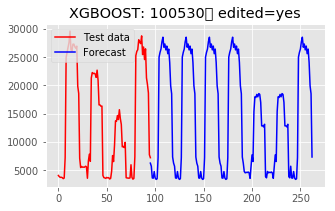


Forecasting from Cold Start Data:  97%|█████████▋| 609/625 [08:16<00:13,  1.22it/s]

101329 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 21 / 11 / 2017
work day avg= 16610.54837449665 	 off day avg= 10303.001157113787
[101329 'medium' 'low' False False False False False True True]


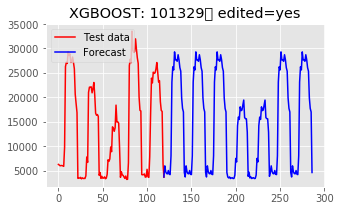


Forecasting from Cold Start Data:  98%|█████████▊| 610/625 [08:17<00:12,  1.24it/s]

101153 <class 'numpy.ndarray'>
Last day observed: Monday 	 16 / 3 / 2015
work day avg= 4006.5229110826945 	 off day avg= 1621.9067732307205
[101153 'small' 'low' False False False False False True True]


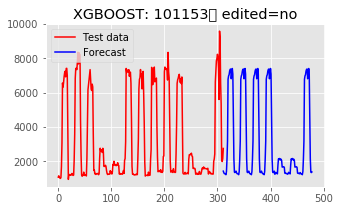


Forecasting from Cold Start Data:  98%|█████████▊| 611/625 [08:18<00:13,  1.03it/s]

101389 <class 'numpy.ndarray'>
Last day observed: Sunday 	 18 / 9 / 2016
work day avg= 10005.273292965385 	 off day avg= 4551.429722059479
[101389 'small' 'low' False False False False False True True]


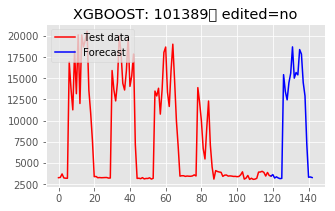


Forecasting from Cold Start Data:  98%|█████████▊| 612/625 [08:19<00:11,  1.12it/s]

103343 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 20 / 9 / 2017
work day avg= 43453.38195130229 	 off day avg= nan
[103343 'small' 'low' False False False False False True True]


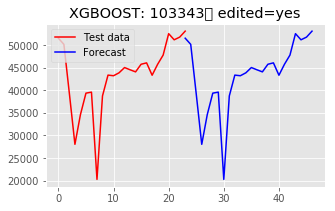


Forecasting from Cold Start Data:  98%|█████████▊| 613/625 [08:19<00:08,  1.46it/s]

102532 <class 'numpy.ndarray'>
Last day observed: Thursday 	 23 / 11 / 2017
work day avg= 40396.47302873202 	 off day avg= 40058.78443361423
[102532 'small' 'low' False False False False False True True]


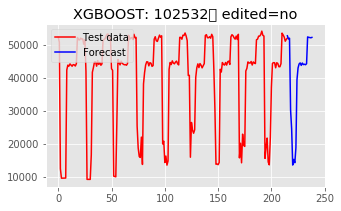


Forecasting from Cold Start Data:  98%|█████████▊| 614/625 [08:20<00:08,  1.28it/s]

100146 <class 'numpy.ndarray'>
Last day observed: Thursday 	 28 / 9 / 2017
work day avg= 78267.01478044034 	 off day avg= 80304.36762023155
[100146 'small' 'low' False False False False False True True]


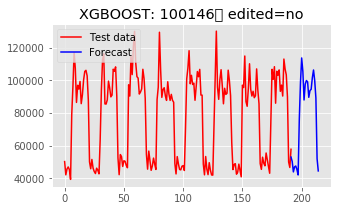


Forecasting from Cold Start Data:  98%|█████████▊| 615/625 [08:21<00:08,  1.18it/s]

101442 <class 'numpy.ndarray'>
Last day observed: Thursday 	 12 / 10 / 2017
work day avg= 95774.95521542634 	 off day avg= 20479.250380555717
[101442 'xx-large' 'low' False False False False False True True]


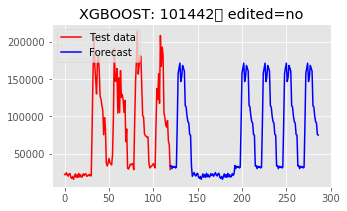


Forecasting from Cold Start Data:  99%|█████████▊| 616/625 [08:22<00:07,  1.20it/s]

100843 <class 'numpy.ndarray'>
Last day observed: Friday 	 6 / 10 / 2017
work day avg= 29529.97050647752 	 off day avg= nan
[100843 'x-small' 'low' False False False False False True True]


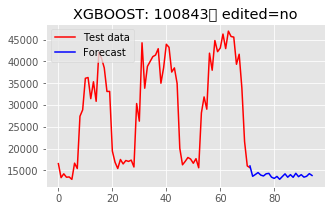


Forecasting from Cold Start Data:  99%|█████████▊| 617/625 [08:22<00:05,  1.54it/s]

103252 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 18 / 8 / 2015
work day avg= 39978.138534394006 	 off day avg= 37249.90670837336
[103252 'large' 'low' False False False False False True True]


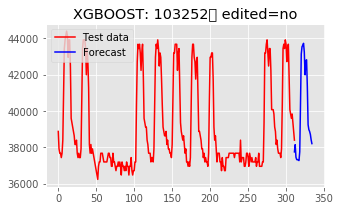


Forecasting from Cold Start Data:  99%|█████████▉| 618/625 [08:24<00:06,  1.10it/s]

102428 <class 'numpy.ndarray'>
Last day observed: Thursday 	 8 / 10 / 2015
work day avg= 43407.80456881524 	 off day avg= 39662.56258954527
[102428 'large' 'low' False False False False False True True]


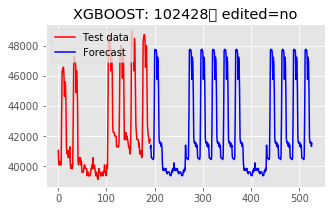


Forecasting from Cold Start Data:  99%|█████████▉| 619/625 [08:25<00:05,  1.04it/s]

100099 <class 'numpy.ndarray'>
Last day observed: Friday 	 27 / 11 / 2015
work day avg= 44632.88372091289 	 off day avg= nan
[100099 'large' 'low' False False False False False True True]


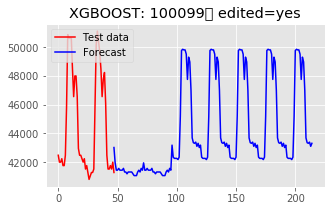


Forecasting from Cold Start Data:  99%|█████████▉| 620/625 [08:25<00:03,  1.28it/s]

101159 <class 'numpy.ndarray'>
Last day observed: Sunday 	 20 / 3 / 2016
work day avg= 39842.57422005758 	 off day avg= 36362.34936348628
[101159 'large' 'low' False False False False False True True]


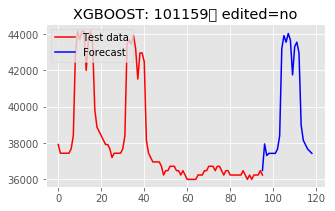


Forecasting from Cold Start Data:  99%|█████████▉| 621/625 [08:26<00:02,  1.43it/s]

100111 <class 'numpy.ndarray'>
Last day observed: Sunday 	 2 / 7 / 2017
work day avg= 27937.658565129856 	 off day avg= 18861.696022190397
[100111 'small' 'low' False False False False False True True]


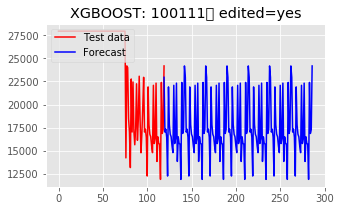


Forecasting from Cold Start Data: 100%|█████████▉| 622/625 [08:27<00:02,  1.34it/s]

102161 <class 'numpy.ndarray'>
Last day observed: Wednesday 	 3 / 5 / 2017
work day avg= 23896.4370068666 	 off day avg= nan
[102161 'medium' 'low' False False False False False True True]


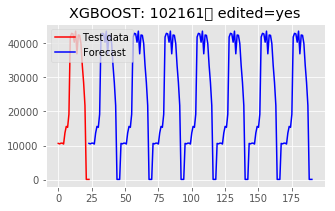


Forecasting from Cold Start Data: 100%|█████████▉| 623/625 [08:27<00:01,  1.64it/s]

100096 <class 'numpy.ndarray'>
Last day observed: Tuesday 	 11 / 7 / 2017
work day avg= 63772.25873822646 	 off day avg= 32468.496717895494
[100096 'medium' 'low' False False False False False True True]


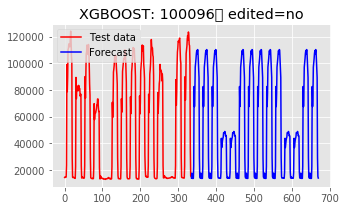


Forecasting from Cold Start Data: 100%|█████████▉| 624/625 [08:29<00:00,  1.04it/s]

102154 <class 'numpy.ndarray'>
Last day observed: Saturday 	 26 / 8 / 2017
work day avg= 78939.82032487457 	 off day avg= 57902.28402802002
[102154 'medium' 'low' False False False False False True True]


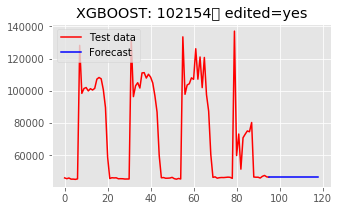


Forecasting from Cold Start Data: 100%|██████████| 625/625 [08:29<00:00,  1.14it/s]


In [58]:
pred_window_to_num_preds = {'hourly': 24, 'daily': 7, 'weekly': 2}
pred_window_to_num_pred_hours = {'hourly': 24, 'daily': 7 * 24, 'weekly': 2 * 7 * 24}
num_test_series = my_submission.series_id.nunique()
import random
from itertools import chain, repeat
ser_id = random.choice(test.series_id.unique())

for ser_id in tqdm(sublist, 
                            total=num_test_series, 
                            desc="Forecasting from Cold Start Data"):
    #print(ser_id)
    pred_df = sub[sub.series_id ==ser_id]
    # get info about this series' prediction window
    pred_window = pred_df.prediction_window.unique()[0]
    num_preds = pred_window_to_num_preds[pred_window]
    num_pred_hours = pred_window_to_num_pred_hours[pred_window]
  
    series_data = test[test.series_id == ser_id]#.consumption
    lastconsump = series_data.consumption.values[-1]
    #print(series_data.timestamp.tail(1).dt.weekday)
    dayofflist=meta[['monday_is_day_off','tuesday_is_day_off',
                     'wednesday_is_day_off','thursday_is_day_off',
                     'friday_is_day_off','saturday_is_day_off',
                     'sunday_is_day_off']][meta.series_id == ser_id].values.reshape(7,1)

    edited ='no'
    cold_X, cold_y, scaler, processed = prepare_training_data(series_data, lag)

    if (test[test.series_id == ser_id].shape[0]>24) & (ser_id!=102364) &(ser_id in notnandata):
        reg.fit(cold_X, cold_y)
    
    # make hourly forecasts for duration of pred window
    preds = xgb_generate_hourly_forecast(series_data,num_pred_hours, 
                                         cold_X, reg, scaler, lag,
                                         lastconsump,dayofflist,processed) 
    
    
    lessdatalist =[103268,100735,101428,101226,101482,101284,
                   101518,101924]
    if (ser_id in lessdatalist):
        preds = series_data.consumption.values
        edited ='yes'

    if (ser_id in [100777,101136,101278,100974,102607]):
        preds[-24:] =[series_data.consumption.values[-1]]*24
        edited ='yes'
        
    if (ser_id in [103208,102287,102111,103343]):
        preds[-24:] =series_data.consumption.values[-24:]
        edited ='yes'
        
    if (ser_id in [100150,102161]):
        x = list(series_data.consumption.values)
        for j in range(6):
            x =x + list(series_data.consumption.values)
        preds = np.array(x)
        edited ='yes'
        
    if (ser_id in [100111]):
        x = list(series_data.consumption.values[-24:])
        for j in range(6):
            x =x + list(series_data.consumption.values[-24:])
        preds = np.array(x)
        edited ='yes'
    
    if ser_id == 100721:
        preds = preds+0.5
        edited ='yes'
        
    if np.abs(series_data.consumption.values.std()) <= 0.01 :
        preds = np.array(num_pred_hours*[series_data.consumption.values[-1]])
        edited ='yes'
    
    #Taking exponential to invert log scaling
    #preds = np.exp(preds)-1
    if ser_id ==103449:
        preds = np.array([x *(137435.852/104159.29) for x in preds])
        edited ='yes'
     
    
    if ser_id ==102920:
        preds = np.array([x *(1.1) for x in preds])
        edited ='yes'
    if ser_id ==103464:
        preds = np.array([x *(12.0/11.0) for x in preds])
        edited ='yes'
                
    if ser_id ==103463:
        preds = np.array([x *(2.0) for x in preds])
        edited ='yes'
        
    if ser_id ==102288:
        preds = np.array([x *(9.0/8.0) for x in preds])
        edited ='yes'
        
    if ser_id ==101059:
        preds = np.array([8429.974*x/x for x in preds])
        edited ='yes'
        
    if ser_id ==102270:
        preds = series_data.consumption.values[-24:]
        edited ='yes'
    if ser_id ==101427:
        preds = series_data.consumption.values[-24:]
        edited ='yes'
        
    if ser_id ==102128:
        preds = series_data.consumption.values[-24:]
        edited ='yes'
    if ser_id ==102103:
        preds = np.array([38959.469*x/x for x in preds])
        edited ='yes'
    if ser_id ==100933:
        preds = series_data.consumption[series_data.Day=='Saturday'].values
        edited ='yes'
    if ser_id ==100338:
        preds = series_data.consumption[series_data.Day=='Saturday'].values
        edited ='yes'
        
    if ser_id ==102154:
        preds = np.array([series_data.consumption[series_data.Day=='Saturday'].values[-1]*x/x for x in preds])
        edited ='yes'
    if ser_id ==100513:
        preds = np.array([series_data.consumption[series_data.Day=='Saturday'].values[-1]*x/x for x in preds])
        edited ='yes'
        
    if ser_id ==103073:
        preds = series_data.consumption.values[-24:]
        edited ='yes'
    print(ser_id,type(preds))
    # reduce by taking sum over each sub window in pred window
    reduced_preds = [pred.sum() for pred in np.split(preds, num_preds)]
    
    
        
    ser_id_mask = my_submission.series_id == ser_id
    my_submission.loc[ser_id_mask, 'consumption'] = reduced_preds
    
    print('Last day observed:',  test.Day[test.series_id == ser_id].tail(1).values[0],'\t',
           test.Date[test.series_id == ser_id].tail(1).values[0],'/',
           test.Month[test.series_id == ser_id].tail(1).values[0],'/',
          test.Year[test.series_id == ser_id].tail(1).values[0])

    print('work day avg=',temp.workdayavg[test.series_id == ser_id].head(1).values[0],'\t',
           'off day avg=',temp.offdayavg[test.series_id == ser_id].head(1).values[0])
    print(meta[meta.series_id == ser_id].tail(1).values[0])

    l = test.consumption[test.series_id ==ser_id].shape[0]
    xl =list(range(l))
    plt.figure(figsize=(5,3))
    plt.plot(xl,test.consumption[test.series_id ==ser_id],'-r',label='Test data')
    xt = list(range(len(preds)))
    xt = [x+xl[-1] for x in xt]
    plt.plot(xt,preds,'-b',label='Forecast')
    plt.title('XGBOOST: '+str(ser_id)+'\t edited='+edited)
    plt.legend(loc='upper left')
    plt.show()

In [52]:
print('work day avg=',temp.workdayavg[test.series_id == 100380].head(1).values[0],'\t',
      'off day avg=',temp.offdayavg[test.series_id == 100380].head(1).values[0])
    

work day avg= 46104.74111542073 	 off day avg= 29074.648856635904


In [54]:
my_submission.head()

,pred_id,series_id,timestamp,temperature,consumption,prediction_window
0,0,102781,2013-03-03,19.931250,3.779732e+05,daily
1,1,102781,2013-03-04,20.034375,1.394872e+06,daily
2,2,102781,2013-03-05,19.189583,1.392613e+06,daily
3,3,102781,2013-03-06,18.397917,1.392613e+06,daily
4,4,102781,2013-03-07,20.762500,1.392613e+06,daily


In [55]:
#my_submission.to_csv(save_path / "my_submmission.csv", index_label='pred_id')
t1= my_submission.drop(labels=['pred_id'],axis=1)
t1.index.names=['pred_id']
t1.head()

,series_id,timestamp,temperature,consumption,prediction_window
pred_id,,,,,
0,102781,2013-03-03,19.931250,3.779732e+05,daily
1,102781,2013-03-04,20.034375,1.394872e+06,daily
2,102781,2013-03-05,19.189583,1.392613e+06,daily
3,102781,2013-03-06,18.397917,1.392613e+06,daily
4,102781,2013-03-07,20.762500,1.392613e+06,daily


In [56]:
t1.to_csv("corrected_dayoff_bigbyhand_xgboost.csv", index_label='pred_id')

In [ ]:
naive = pd.read_csv('zero_order.csv',parse_dates=['timestamp'])
benchmark = pd.read_csv("given_benchmark.csv",parse_dates=['timestamp'])


In [ ]:
diff = (benchmark.consumption.values - t1.consumption.values)/benchmark.consumption.values

In [ ]:
((benchmark.consumption.values - naive.consumption.values)/benchmark.consumption.values).min()

In [ ]:
naive['diffe']  = diff
mask = np.abs(naive.diffe.values) >100
largeerror = naive[mask]
largeerror.describe()#[largeerror.prediction_window=='weekly'].head()

In [ ]:
largeerror

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(series, model='multiplicative', freq=1)
result.plot()

In [ ]:
from pandas.tools.plotting import autocorrelation_plot
series = test.consumption[test.series_id == ser_id].values
autocorrelation_plot(series)